# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = '/data'
!pip install matplotlib==2.0.2
# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

    100% |████████████████████████████████| 14.6MB 42kB/s  eta 0:00:01
  Found existing installation: matplotlib 2.1.0
    Uninstalling matplotlib-2.1.0:
      Successfully uninstalled matplotlib-2.1.0
You are using pip version 9.0.1, however version 18.0 is available.
You should consider upgrading via the 'pip install --upgrade pip' command.
Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

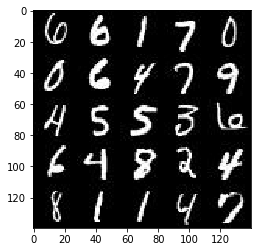

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

In [3]:
mnist_images.shape

(25, 28, 28, 1)

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

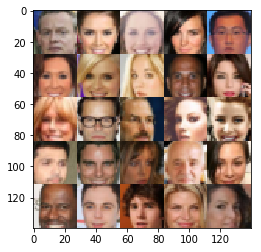

In [4]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [5]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.3.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [6]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    real_inputs = tf.placeholder(tf.float32, (None, image_width, image_height, image_channels),name='real_inputs')
    z_inputs = tf.placeholder(tf.float32, (None, z_dim), name='z_inputs')
    lr = tf.placeholder(tf.float32, name='learning_rate')
    return real_inputs,z_inputs,lr


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

ERROR:tensorflow:==================================
Object was never used (type <class 'tensorflow.python.framework.ops.Operation'>):
<tf.Operation 'assert_rank_2/Assert/Assert' type=Assert>
If you want to mark it as used call its "mark_used()" method.
It was originally created here:
['File "/opt/conda/lib/python3.6/runpy.py", line 193, in _run_module_as_main\n    "__main__", mod_spec)', 'File "/opt/conda/lib/python3.6/runpy.py", line 85, in _run_code\n    exec(code, run_globals)', 'File "/opt/conda/lib/python3.6/site-packages/ipykernel_launcher.py", line 16, in <module>\n    app.launch_new_instance()', 'File "/opt/conda/lib/python3.6/site-packages/traitlets/config/application.py", line 658, in launch_instance\n    app.start()', 'File "/opt/conda/lib/python3.6/site-packages/ipykernel/kernelapp.py", line 478, in start\n    self.io_loop.start()', 'File "/opt/conda/lib/python3.6/site-packages/zmq/eventloop/ioloop.py", line 177, in start\n    super(ZMQIOLoop, self).start()', 'File "/opt/co

### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [7]:
def discriminator(images, reuse=False,alpha=0.2):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    with tf.variable_scope('discriminator', reuse=reuse):
        x1 = tf.layers.conv2d(images, 64, 5, strides=2, padding='same')
        h1 = tf.maximum(alpha * x1, x1)
        
        x2 = tf.layers.conv2d(h1, 128, 5, strides=2, padding='same')
        b1 = tf.layers.batch_normalization(x2, training=True)
        h2 = tf.maximum(alpha * b1, b1)
        
        x3 = tf.layers.conv2d(h2, 256, 5, strides=2, padding='same')
        b2 = tf.layers.batch_normalization(x3, training=True)
        h3 = tf.maximum(alpha * b2, b2)
        
        flat = tf.reshape(h3, (-1, 4*4*256))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)
    return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [8]:
def generator(z,out_channel_dim,is_train=True,reuse=False,alpha=0.2):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    with tf.variable_scope('generator', reuse=not is_train):
        x1 = tf.layers.dense(z, 7*7*512)
        x1 = tf.reshape(x1, (-1, 7, 7, 512))
        b1 = tf.layers.batch_normalization(x1, training=is_train)
        h1 = tf.maximum(alpha * b1,b1)
        
        x2 = tf.layers.conv2d_transpose(h1, 256, 5, strides=1, padding='same')
        #4*4*256
        b2 = tf.layers.batch_normalization(x2, training=is_train)
        h2 = tf.maximum(alpha * b2, b2)
        
        x3 = tf.layers.conv2d_transpose(h2, 128, 5, strides=2, padding='same')
        b3 = tf.layers.batch_normalization(x3, training=is_train)
        h3 = tf.maximum(alpha * b3, b3)
      
        logits = tf.layers.conv2d_transpose(h3, out_channel_dim, 5, strides=2, padding='same')
        
        out = tf.tanh(logits)
        
        return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [9]:
def model_loss(input_real, input_z, out_channel_dim,alpha=0.2):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    g_model = generator(input_z, out_channel_dim, alpha=alpha)
    d_model_real, d_logits_real = discriminator(input_real, alpha=alpha)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True, alpha=alpha)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)*0.9))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake

    return d_loss,g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [10]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [11]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [12]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model

    real_inputs, z_inputs, lr = model_inputs(data_shape[1], data_shape[2], data_shape[3], z_dim)
    
    print(real_inputs.shape)

    d_loss, g_loss = model_loss(real_inputs, z_inputs, data_shape[3])

    d_opt, g_opt = model_opt(d_loss, g_loss, lr, beta1)
    
    show_every=100
    steps=0
    n_images = 25
    print_every = 10
    losses=[]
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                steps += 1
                # Sample random noise for G
#                 print(batch_images.shape)
#                 print(epoch_i+1)
                batch_images = batch_images * 2
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))

                # Run optimizers
                _ = sess.run(d_opt, feed_dict={real_inputs:batch_images,z_inputs: batch_z,lr: learning_rate})
                _ = sess.run(g_opt, feed_dict={z_inputs: batch_z,real_inputs: batch_images,lr: learning_rate})

                if steps % print_every == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = d_loss.eval({z_inputs: batch_z,real_inputs: batch_images})
                    train_loss_g = g_loss.eval({z_inputs: batch_z})

                    print("Epoch {}/{}...".format(epoch_i+1, epochs),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    # Save losses to view after training
                    losses.append((train_loss_d, train_loss_g))

                if steps % show_every == 0:
                     show_generator_output(sess, n_images, z_inputs,data_shape[3],data_image_mode)
    return losses                

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

(?, 28, 28, 1)
Epoch 1/2... Discriminator Loss: 2.4125... Generator Loss: 0.1646
Epoch 1/2... Discriminator Loss: 1.8853... Generator Loss: 0.3607
Epoch 1/2... Discriminator Loss: 2.8518... Generator Loss: 0.2173
Epoch 1/2... Discriminator Loss: 1.8584... Generator Loss: 0.3062
Epoch 1/2... Discriminator Loss: 1.6403... Generator Loss: 0.3846
Epoch 1/2... Discriminator Loss: 1.4617... Generator Loss: 0.5593
Epoch 1/2... Discriminator Loss: 1.5932... Generator Loss: 0.4150
Epoch 1/2... Discriminator Loss: 1.3331... Generator Loss: 0.6609
Epoch 1/2... Discriminator Loss: 1.3819... Generator Loss: 1.2974
Epoch 1/2... Discriminator Loss: 1.3618... Generator Loss: 0.6075


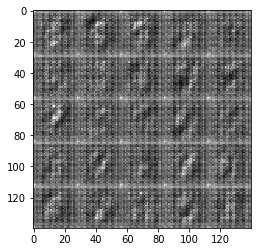

Epoch 1/2... Discriminator Loss: 1.1983... Generator Loss: 1.0625
Epoch 1/2... Discriminator Loss: 1.5572... Generator Loss: 0.3884
Epoch 1/2... Discriminator Loss: 1.3328... Generator Loss: 0.6227
Epoch 1/2... Discriminator Loss: 1.3580... Generator Loss: 0.5834
Epoch 1/2... Discriminator Loss: 1.2143... Generator Loss: 1.0254
Epoch 1/2... Discriminator Loss: 1.1687... Generator Loss: 1.0016
Epoch 1/2... Discriminator Loss: 1.0813... Generator Loss: 0.9047
Epoch 1/2... Discriminator Loss: 1.4678... Generator Loss: 1.4828
Epoch 1/2... Discriminator Loss: 1.1178... Generator Loss: 0.8373
Epoch 1/2... Discriminator Loss: 1.2419... Generator Loss: 0.6984


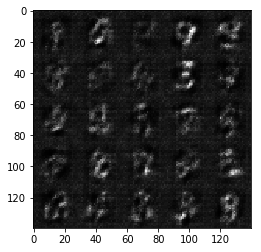

Epoch 1/2... Discriminator Loss: 1.1132... Generator Loss: 0.9968
Epoch 1/2... Discriminator Loss: 1.1851... Generator Loss: 1.3266
Epoch 1/2... Discriminator Loss: 1.2093... Generator Loss: 0.6798
Epoch 1/2... Discriminator Loss: 1.0864... Generator Loss: 0.7440
Epoch 1/2... Discriminator Loss: 1.0359... Generator Loss: 1.2128
Epoch 1/2... Discriminator Loss: 1.1951... Generator Loss: 1.0693
Epoch 1/2... Discriminator Loss: 1.6410... Generator Loss: 0.3735
Epoch 1/2... Discriminator Loss: 1.3709... Generator Loss: 0.4828
Epoch 1/2... Discriminator Loss: 1.1327... Generator Loss: 0.7050
Epoch 1/2... Discriminator Loss: 1.0430... Generator Loss: 0.7478


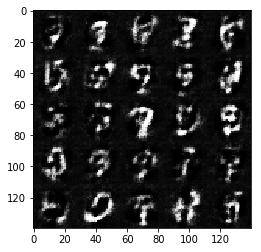

Epoch 1/2... Discriminator Loss: 1.2688... Generator Loss: 1.8248
Epoch 1/2... Discriminator Loss: 1.0665... Generator Loss: 0.8849
Epoch 1/2... Discriminator Loss: 1.4002... Generator Loss: 0.4602
Epoch 1/2... Discriminator Loss: 0.9231... Generator Loss: 1.2033
Epoch 1/2... Discriminator Loss: 1.0644... Generator Loss: 1.9116
Epoch 1/2... Discriminator Loss: 1.0204... Generator Loss: 1.1757
Epoch 1/2... Discriminator Loss: 1.0523... Generator Loss: 0.8265
Epoch 1/2... Discriminator Loss: 1.4741... Generator Loss: 0.4185
Epoch 1/2... Discriminator Loss: 0.9912... Generator Loss: 0.8461
Epoch 1/2... Discriminator Loss: 1.1144... Generator Loss: 0.7618


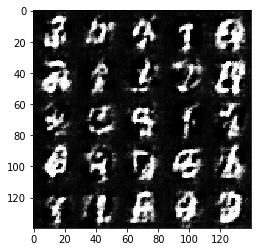

Epoch 1/2... Discriminator Loss: 1.5938... Generator Loss: 0.3657
Epoch 1/2... Discriminator Loss: 0.9507... Generator Loss: 1.0904
Epoch 1/2... Discriminator Loss: 1.0288... Generator Loss: 0.9107
Epoch 1/2... Discriminator Loss: 0.9037... Generator Loss: 1.1123
Epoch 1/2... Discriminator Loss: 0.9636... Generator Loss: 1.0878
Epoch 1/2... Discriminator Loss: 1.0292... Generator Loss: 0.9094
Epoch 1/2... Discriminator Loss: 0.9001... Generator Loss: 1.0234
Epoch 1/2... Discriminator Loss: 1.2064... Generator Loss: 1.9178
Epoch 1/2... Discriminator Loss: 0.8822... Generator Loss: 1.3464
Epoch 1/2... Discriminator Loss: 1.2603... Generator Loss: 2.0207


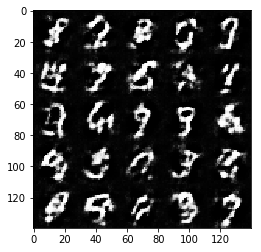

Epoch 1/2... Discriminator Loss: 1.2016... Generator Loss: 1.7100
Epoch 1/2... Discriminator Loss: 1.0273... Generator Loss: 1.0217
Epoch 1/2... Discriminator Loss: 1.0005... Generator Loss: 1.0678
Epoch 1/2... Discriminator Loss: 1.3594... Generator Loss: 0.5171
Epoch 1/2... Discriminator Loss: 1.1957... Generator Loss: 0.6667
Epoch 1/2... Discriminator Loss: 1.8303... Generator Loss: 0.2931
Epoch 1/2... Discriminator Loss: 1.3158... Generator Loss: 0.5546
Epoch 1/2... Discriminator Loss: 1.7961... Generator Loss: 0.3704
Epoch 1/2... Discriminator Loss: 1.2498... Generator Loss: 0.6223
Epoch 1/2... Discriminator Loss: 1.1060... Generator Loss: 0.9335


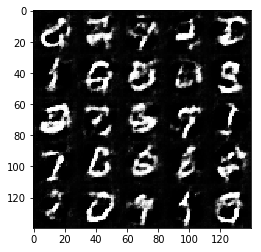

Epoch 1/2... Discriminator Loss: 1.3955... Generator Loss: 0.5148
Epoch 1/2... Discriminator Loss: 1.0969... Generator Loss: 0.9929
Epoch 1/2... Discriminator Loss: 1.0731... Generator Loss: 0.8935
Epoch 1/2... Discriminator Loss: 1.3911... Generator Loss: 0.4897
Epoch 1/2... Discriminator Loss: 1.0982... Generator Loss: 1.3431
Epoch 1/2... Discriminator Loss: 1.2989... Generator Loss: 0.5464
Epoch 1/2... Discriminator Loss: 1.2993... Generator Loss: 1.4918
Epoch 1/2... Discriminator Loss: 1.3717... Generator Loss: 0.5264
Epoch 1/2... Discriminator Loss: 1.3938... Generator Loss: 0.4927
Epoch 1/2... Discriminator Loss: 1.5243... Generator Loss: 0.4150


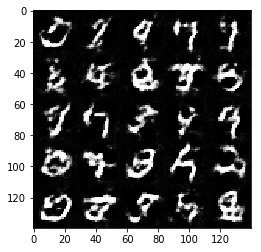

Epoch 1/2... Discriminator Loss: 1.1420... Generator Loss: 0.7217
Epoch 1/2... Discriminator Loss: 1.1107... Generator Loss: 1.4380
Epoch 1/2... Discriminator Loss: 1.3707... Generator Loss: 0.5379
Epoch 1/2... Discriminator Loss: 1.4811... Generator Loss: 0.4174
Epoch 1/2... Discriminator Loss: 1.1270... Generator Loss: 0.9153
Epoch 1/2... Discriminator Loss: 1.4321... Generator Loss: 0.5204
Epoch 1/2... Discriminator Loss: 1.3401... Generator Loss: 0.5408
Epoch 1/2... Discriminator Loss: 1.1324... Generator Loss: 0.7014
Epoch 1/2... Discriminator Loss: 1.0832... Generator Loss: 1.2787
Epoch 1/2... Discriminator Loss: 1.3997... Generator Loss: 0.4800


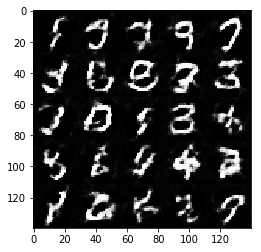

Epoch 1/2... Discriminator Loss: 1.3745... Generator Loss: 1.9308
Epoch 1/2... Discriminator Loss: 1.1256... Generator Loss: 1.0318
Epoch 1/2... Discriminator Loss: 1.0529... Generator Loss: 1.5398
Epoch 1/2... Discriminator Loss: 1.1038... Generator Loss: 1.0804
Epoch 1/2... Discriminator Loss: 1.0334... Generator Loss: 1.5264
Epoch 1/2... Discriminator Loss: 1.1171... Generator Loss: 1.4237
Epoch 1/2... Discriminator Loss: 1.4138... Generator Loss: 1.5161
Epoch 1/2... Discriminator Loss: 1.2840... Generator Loss: 0.6099
Epoch 1/2... Discriminator Loss: 1.0484... Generator Loss: 1.0835
Epoch 1/2... Discriminator Loss: 1.3005... Generator Loss: 1.4495


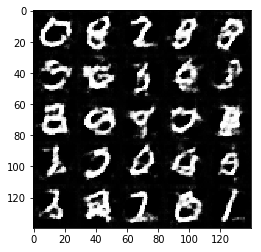

Epoch 1/2... Discriminator Loss: 1.3215... Generator Loss: 0.5363
Epoch 1/2... Discriminator Loss: 1.8544... Generator Loss: 0.2764
Epoch 1/2... Discriminator Loss: 1.1158... Generator Loss: 1.6233
Epoch 1/2... Discriminator Loss: 1.1866... Generator Loss: 0.6101
Epoch 1/2... Discriminator Loss: 1.1026... Generator Loss: 0.8047
Epoch 1/2... Discriminator Loss: 1.6692... Generator Loss: 0.3405
Epoch 1/2... Discriminator Loss: 1.1795... Generator Loss: 0.6953
Epoch 1/2... Discriminator Loss: 1.1516... Generator Loss: 0.6845
Epoch 1/2... Discriminator Loss: 1.5087... Generator Loss: 0.4244
Epoch 1/2... Discriminator Loss: 1.6357... Generator Loss: 0.3686


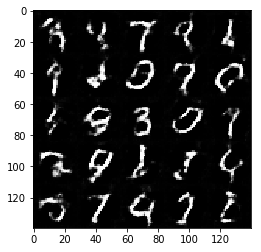

Epoch 1/2... Discriminator Loss: 0.9470... Generator Loss: 0.9330
Epoch 1/2... Discriminator Loss: 1.2210... Generator Loss: 1.6363
Epoch 1/2... Discriminator Loss: 1.0396... Generator Loss: 1.1662
Epoch 1/2... Discriminator Loss: 1.4320... Generator Loss: 0.4518
Epoch 1/2... Discriminator Loss: 1.2891... Generator Loss: 0.5650
Epoch 1/2... Discriminator Loss: 1.1895... Generator Loss: 0.7297
Epoch 1/2... Discriminator Loss: 0.8987... Generator Loss: 1.0844
Epoch 1/2... Discriminator Loss: 0.9656... Generator Loss: 1.3025
Epoch 1/2... Discriminator Loss: 0.9697... Generator Loss: 1.1551
Epoch 1/2... Discriminator Loss: 1.2347... Generator Loss: 0.6242


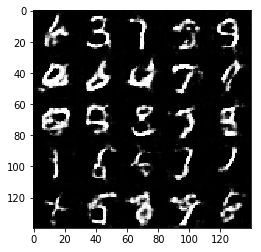

Epoch 1/2... Discriminator Loss: 1.0885... Generator Loss: 1.2309
Epoch 1/2... Discriminator Loss: 0.9593... Generator Loss: 1.0782
Epoch 1/2... Discriminator Loss: 1.1066... Generator Loss: 0.7625
Epoch 1/2... Discriminator Loss: 1.2621... Generator Loss: 0.5738
Epoch 1/2... Discriminator Loss: 1.1350... Generator Loss: 0.7668
Epoch 1/2... Discriminator Loss: 0.9420... Generator Loss: 0.9805
Epoch 1/2... Discriminator Loss: 1.1647... Generator Loss: 0.6731
Epoch 1/2... Discriminator Loss: 1.0259... Generator Loss: 0.8988
Epoch 1/2... Discriminator Loss: 1.2646... Generator Loss: 1.7296
Epoch 1/2... Discriminator Loss: 0.9646... Generator Loss: 0.9950


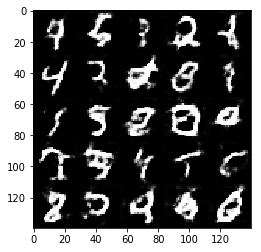

Epoch 1/2... Discriminator Loss: 1.0649... Generator Loss: 1.0679
Epoch 1/2... Discriminator Loss: 1.6424... Generator Loss: 0.3607
Epoch 1/2... Discriminator Loss: 1.1382... Generator Loss: 1.1072
Epoch 1/2... Discriminator Loss: 1.3310... Generator Loss: 0.5640
Epoch 1/2... Discriminator Loss: 1.2454... Generator Loss: 0.5695
Epoch 1/2... Discriminator Loss: 1.1818... Generator Loss: 0.6991
Epoch 1/2... Discriminator Loss: 1.4120... Generator Loss: 0.5140
Epoch 1/2... Discriminator Loss: 0.8672... Generator Loss: 1.5324
Epoch 1/2... Discriminator Loss: 1.2081... Generator Loss: 0.6393
Epoch 1/2... Discriminator Loss: 1.1325... Generator Loss: 2.1435


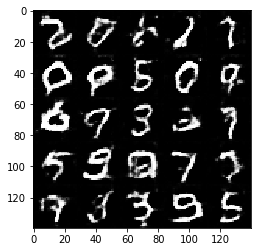

Epoch 1/2... Discriminator Loss: 1.0442... Generator Loss: 0.7615
Epoch 1/2... Discriminator Loss: 1.0708... Generator Loss: 0.7801
Epoch 1/2... Discriminator Loss: 1.5345... Generator Loss: 0.4076
Epoch 1/2... Discriminator Loss: 1.3509... Generator Loss: 0.5265
Epoch 1/2... Discriminator Loss: 0.8989... Generator Loss: 1.1488
Epoch 1/2... Discriminator Loss: 0.9715... Generator Loss: 1.7339
Epoch 1/2... Discriminator Loss: 1.0656... Generator Loss: 0.9448
Epoch 1/2... Discriminator Loss: 1.0774... Generator Loss: 0.7411
Epoch 1/2... Discriminator Loss: 1.2990... Generator Loss: 0.5645
Epoch 1/2... Discriminator Loss: 1.1367... Generator Loss: 0.7794


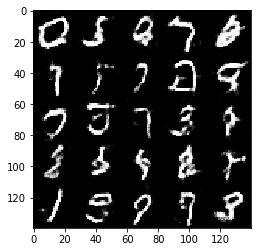

Epoch 1/2... Discriminator Loss: 1.2458... Generator Loss: 0.6420
Epoch 1/2... Discriminator Loss: 1.2053... Generator Loss: 0.6215
Epoch 1/2... Discriminator Loss: 1.1563... Generator Loss: 0.6630
Epoch 1/2... Discriminator Loss: 1.3748... Generator Loss: 0.5101
Epoch 1/2... Discriminator Loss: 1.3873... Generator Loss: 0.4991
Epoch 1/2... Discriminator Loss: 1.0028... Generator Loss: 1.2926
Epoch 1/2... Discriminator Loss: 1.1616... Generator Loss: 0.6632
Epoch 1/2... Discriminator Loss: 1.1208... Generator Loss: 0.7677
Epoch 1/2... Discriminator Loss: 0.7849... Generator Loss: 1.4553
Epoch 1/2... Discriminator Loss: 0.8945... Generator Loss: 1.0214


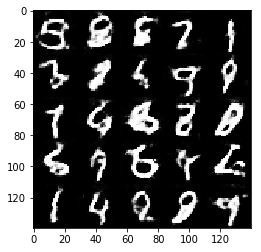

Epoch 1/2... Discriminator Loss: 1.0942... Generator Loss: 0.7467
Epoch 1/2... Discriminator Loss: 0.9427... Generator Loss: 1.1434
Epoch 1/2... Discriminator Loss: 2.2612... Generator Loss: 0.2256
Epoch 1/2... Discriminator Loss: 1.0974... Generator Loss: 0.8218
Epoch 1/2... Discriminator Loss: 1.1107... Generator Loss: 0.6908
Epoch 1/2... Discriminator Loss: 0.9361... Generator Loss: 1.0180
Epoch 1/2... Discriminator Loss: 0.9852... Generator Loss: 0.8716
Epoch 1/2... Discriminator Loss: 1.0101... Generator Loss: 1.8788
Epoch 1/2... Discriminator Loss: 0.9042... Generator Loss: 1.1061
Epoch 1/2... Discriminator Loss: 0.9130... Generator Loss: 1.2110


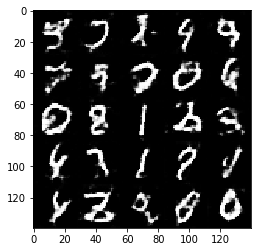

Epoch 1/2... Discriminator Loss: 1.0113... Generator Loss: 0.7947
Epoch 1/2... Discriminator Loss: 1.0713... Generator Loss: 0.7924
Epoch 1/2... Discriminator Loss: 1.0716... Generator Loss: 0.8061
Epoch 1/2... Discriminator Loss: 1.0186... Generator Loss: 1.7789
Epoch 1/2... Discriminator Loss: 1.0500... Generator Loss: 0.8650
Epoch 1/2... Discriminator Loss: 0.8083... Generator Loss: 1.5941
Epoch 1/2... Discriminator Loss: 0.8886... Generator Loss: 0.9833
Epoch 1/2... Discriminator Loss: 1.0991... Generator Loss: 1.0286
Epoch 1/2... Discriminator Loss: 0.9362... Generator Loss: 0.9820
Epoch 1/2... Discriminator Loss: 0.9614... Generator Loss: 0.9350


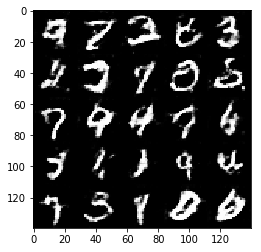

Epoch 1/2... Discriminator Loss: 1.2147... Generator Loss: 0.7065
Epoch 1/2... Discriminator Loss: 1.0383... Generator Loss: 0.7844
Epoch 1/2... Discriminator Loss: 0.8472... Generator Loss: 1.3866
Epoch 1/2... Discriminator Loss: 1.4992... Generator Loss: 0.4193
Epoch 1/2... Discriminator Loss: 1.0191... Generator Loss: 0.8506
Epoch 1/2... Discriminator Loss: 1.0482... Generator Loss: 0.9299
Epoch 1/2... Discriminator Loss: 0.8687... Generator Loss: 1.0136
Epoch 1/2... Discriminator Loss: 0.9339... Generator Loss: 1.1332
Epoch 1/2... Discriminator Loss: 0.9423... Generator Loss: 0.9558
Epoch 1/2... Discriminator Loss: 0.9922... Generator Loss: 1.0460


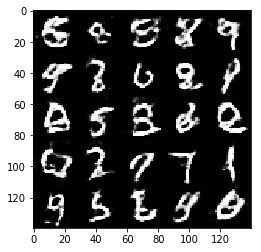

Epoch 1/2... Discriminator Loss: 1.7077... Generator Loss: 0.3857
Epoch 1/2... Discriminator Loss: 1.0494... Generator Loss: 0.8058
Epoch 1/2... Discriminator Loss: 1.0036... Generator Loss: 0.8711
Epoch 1/2... Discriminator Loss: 0.8957... Generator Loss: 1.0189
Epoch 1/2... Discriminator Loss: 0.9679... Generator Loss: 0.8859
Epoch 1/2... Discriminator Loss: 1.1109... Generator Loss: 0.7731
Epoch 1/2... Discriminator Loss: 1.8702... Generator Loss: 0.3092
Epoch 1/2... Discriminator Loss: 0.9081... Generator Loss: 1.0462
Epoch 1/2... Discriminator Loss: 1.0454... Generator Loss: 0.7672
Epoch 1/2... Discriminator Loss: 1.0877... Generator Loss: 0.7172


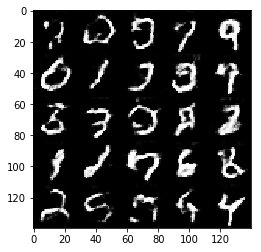

Epoch 1/2... Discriminator Loss: 1.0716... Generator Loss: 0.7892
Epoch 1/2... Discriminator Loss: 0.9605... Generator Loss: 1.2010
Epoch 1/2... Discriminator Loss: 0.9043... Generator Loss: 1.1311
Epoch 1/2... Discriminator Loss: 1.3664... Generator Loss: 0.4983
Epoch 1/2... Discriminator Loss: 0.9352... Generator Loss: 0.9277
Epoch 1/2... Discriminator Loss: 0.9288... Generator Loss: 0.9083
Epoch 1/2... Discriminator Loss: 0.9562... Generator Loss: 0.8883
Epoch 1/2... Discriminator Loss: 1.1927... Generator Loss: 0.6078
Epoch 1/2... Discriminator Loss: 1.0853... Generator Loss: 1.1550
Epoch 1/2... Discriminator Loss: 0.9019... Generator Loss: 1.0083


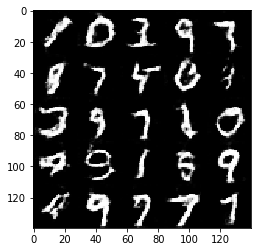

Epoch 1/2... Discriminator Loss: 1.5632... Generator Loss: 0.3842
Epoch 1/2... Discriminator Loss: 0.8606... Generator Loss: 1.1816
Epoch 1/2... Discriminator Loss: 1.5084... Generator Loss: 0.5075
Epoch 1/2... Discriminator Loss: 1.0031... Generator Loss: 0.8308
Epoch 1/2... Discriminator Loss: 1.3340... Generator Loss: 0.5691
Epoch 1/2... Discriminator Loss: 1.2696... Generator Loss: 0.5943
Epoch 1/2... Discriminator Loss: 0.8977... Generator Loss: 1.3725
Epoch 1/2... Discriminator Loss: 0.8168... Generator Loss: 1.6040
Epoch 1/2... Discriminator Loss: 0.7934... Generator Loss: 1.1493
Epoch 1/2... Discriminator Loss: 0.9863... Generator Loss: 0.8798


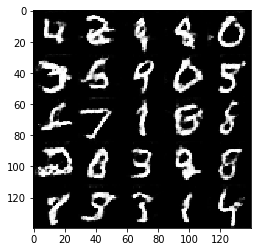

Epoch 1/2... Discriminator Loss: 2.5550... Generator Loss: 4.0151
Epoch 1/2... Discriminator Loss: 0.8593... Generator Loss: 1.5392
Epoch 1/2... Discriminator Loss: 0.9530... Generator Loss: 0.8806
Epoch 1/2... Discriminator Loss: 0.7039... Generator Loss: 1.3432
Epoch 2/2... Discriminator Loss: 0.8837... Generator Loss: 1.1293
Epoch 2/2... Discriminator Loss: 1.3225... Generator Loss: 0.5892
Epoch 2/2... Discriminator Loss: 0.9284... Generator Loss: 1.0857
Epoch 2/2... Discriminator Loss: 1.1625... Generator Loss: 0.6514
Epoch 2/2... Discriminator Loss: 1.3116... Generator Loss: 0.6013
Epoch 2/2... Discriminator Loss: 1.2419... Generator Loss: 0.6222


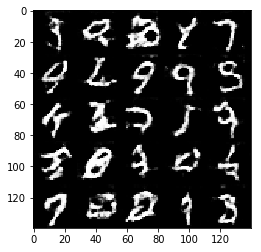

Epoch 2/2... Discriminator Loss: 1.2834... Generator Loss: 2.1006
Epoch 2/2... Discriminator Loss: 1.0849... Generator Loss: 0.7224
Epoch 2/2... Discriminator Loss: 0.9233... Generator Loss: 0.9723
Epoch 2/2... Discriminator Loss: 0.8816... Generator Loss: 1.0646
Epoch 2/2... Discriminator Loss: 0.7278... Generator Loss: 1.2096
Epoch 2/2... Discriminator Loss: 1.1435... Generator Loss: 1.2086
Epoch 2/2... Discriminator Loss: 0.8195... Generator Loss: 1.2082
Epoch 2/2... Discriminator Loss: 1.4133... Generator Loss: 0.4726
Epoch 2/2... Discriminator Loss: 1.1789... Generator Loss: 0.6714
Epoch 2/2... Discriminator Loss: 0.7590... Generator Loss: 1.5089


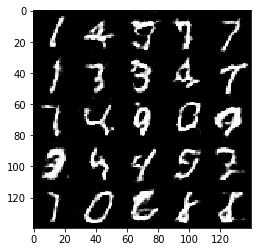

Epoch 2/2... Discriminator Loss: 0.7131... Generator Loss: 1.3764
Epoch 2/2... Discriminator Loss: 1.1905... Generator Loss: 0.6311
Epoch 2/2... Discriminator Loss: 1.0691... Generator Loss: 0.7632
Epoch 2/2... Discriminator Loss: 0.8104... Generator Loss: 1.2479
Epoch 2/2... Discriminator Loss: 1.3080... Generator Loss: 0.5615
Epoch 2/2... Discriminator Loss: 0.7914... Generator Loss: 1.1456
Epoch 2/2... Discriminator Loss: 0.8069... Generator Loss: 1.3165
Epoch 2/2... Discriminator Loss: 0.7212... Generator Loss: 1.3578
Epoch 2/2... Discriminator Loss: 1.0604... Generator Loss: 0.8437
Epoch 2/2... Discriminator Loss: 0.7298... Generator Loss: 1.3020


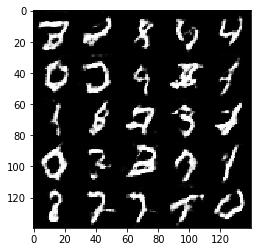

Epoch 2/2... Discriminator Loss: 0.7973... Generator Loss: 1.2872
Epoch 2/2... Discriminator Loss: 1.7762... Generator Loss: 0.3588
Epoch 2/2... Discriminator Loss: 1.0296... Generator Loss: 0.8745
Epoch 2/2... Discriminator Loss: 0.7684... Generator Loss: 1.3305
Epoch 2/2... Discriminator Loss: 0.7586... Generator Loss: 1.4978
Epoch 2/2... Discriminator Loss: 0.8849... Generator Loss: 1.0019
Epoch 2/2... Discriminator Loss: 0.7979... Generator Loss: 1.2341
Epoch 2/2... Discriminator Loss: 0.8584... Generator Loss: 1.0773
Epoch 2/2... Discriminator Loss: 0.8134... Generator Loss: 1.1949
Epoch 2/2... Discriminator Loss: 0.9281... Generator Loss: 0.8897


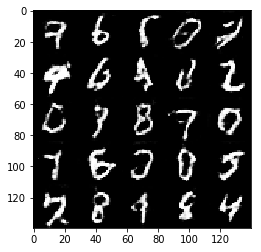

Epoch 2/2... Discriminator Loss: 0.7572... Generator Loss: 1.2381
Epoch 2/2... Discriminator Loss: 0.8860... Generator Loss: 0.9970
Epoch 2/2... Discriminator Loss: 0.7021... Generator Loss: 1.4788
Epoch 2/2... Discriminator Loss: 0.7209... Generator Loss: 1.3379
Epoch 2/2... Discriminator Loss: 1.8095... Generator Loss: 0.3636
Epoch 2/2... Discriminator Loss: 1.1452... Generator Loss: 0.7039
Epoch 2/2... Discriminator Loss: 0.8723... Generator Loss: 1.1606
Epoch 2/2... Discriminator Loss: 0.8974... Generator Loss: 0.9411
Epoch 2/2... Discriminator Loss: 0.9750... Generator Loss: 0.8506
Epoch 2/2... Discriminator Loss: 0.7299... Generator Loss: 1.3945


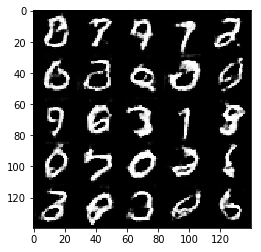

Epoch 2/2... Discriminator Loss: 0.9052... Generator Loss: 0.9655
Epoch 2/2... Discriminator Loss: 0.8019... Generator Loss: 1.2080
Epoch 2/2... Discriminator Loss: 0.8603... Generator Loss: 1.2174
Epoch 2/2... Discriminator Loss: 0.8514... Generator Loss: 1.0143
Epoch 2/2... Discriminator Loss: 0.7201... Generator Loss: 1.2873
Epoch 2/2... Discriminator Loss: 0.7864... Generator Loss: 1.6955
Epoch 2/2... Discriminator Loss: 1.4032... Generator Loss: 0.4981
Epoch 2/2... Discriminator Loss: 1.5137... Generator Loss: 2.4990
Epoch 2/2... Discriminator Loss: 1.2732... Generator Loss: 0.5760
Epoch 2/2... Discriminator Loss: 1.1383... Generator Loss: 0.6537


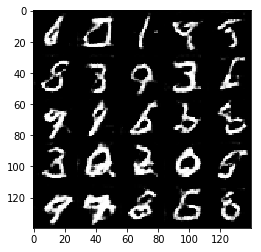

Epoch 2/2... Discriminator Loss: 0.8556... Generator Loss: 1.0891
Epoch 2/2... Discriminator Loss: 1.8624... Generator Loss: 0.3120
Epoch 2/2... Discriminator Loss: 0.9248... Generator Loss: 1.0036
Epoch 2/2... Discriminator Loss: 1.0011... Generator Loss: 0.8128
Epoch 2/2... Discriminator Loss: 0.9815... Generator Loss: 0.8900
Epoch 2/2... Discriminator Loss: 0.7320... Generator Loss: 1.7544
Epoch 2/2... Discriminator Loss: 0.6842... Generator Loss: 1.6207
Epoch 2/2... Discriminator Loss: 1.3409... Generator Loss: 0.5216
Epoch 2/2... Discriminator Loss: 0.9068... Generator Loss: 1.8766
Epoch 2/2... Discriminator Loss: 0.9282... Generator Loss: 0.9433


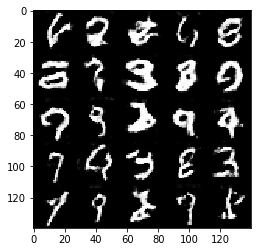

Epoch 2/2... Discriminator Loss: 0.8438... Generator Loss: 1.0547
Epoch 2/2... Discriminator Loss: 1.1386... Generator Loss: 0.7601
Epoch 2/2... Discriminator Loss: 2.6546... Generator Loss: 0.1477
Epoch 2/2... Discriminator Loss: 0.8744... Generator Loss: 1.1100
Epoch 2/2... Discriminator Loss: 1.0197... Generator Loss: 0.7959
Epoch 2/2... Discriminator Loss: 0.7636... Generator Loss: 1.3495
Epoch 2/2... Discriminator Loss: 0.9608... Generator Loss: 0.8160
Epoch 2/2... Discriminator Loss: 0.8018... Generator Loss: 1.1966
Epoch 2/2... Discriminator Loss: 0.8089... Generator Loss: 1.1410
Epoch 2/2... Discriminator Loss: 1.5204... Generator Loss: 0.4295


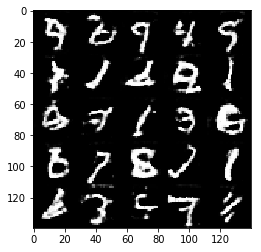

Epoch 2/2... Discriminator Loss: 1.1115... Generator Loss: 0.7079
Epoch 2/2... Discriminator Loss: 0.9009... Generator Loss: 0.9389
Epoch 2/2... Discriminator Loss: 0.7486... Generator Loss: 1.3594
Epoch 2/2... Discriminator Loss: 1.0590... Generator Loss: 0.7568
Epoch 2/2... Discriminator Loss: 0.8662... Generator Loss: 1.0957
Epoch 2/2... Discriminator Loss: 1.8855... Generator Loss: 0.2889
Epoch 2/2... Discriminator Loss: 0.7077... Generator Loss: 1.6446
Epoch 2/2... Discriminator Loss: 0.9914... Generator Loss: 0.8207
Epoch 2/2... Discriminator Loss: 0.6891... Generator Loss: 1.5735
Epoch 2/2... Discriminator Loss: 0.7557... Generator Loss: 1.2539


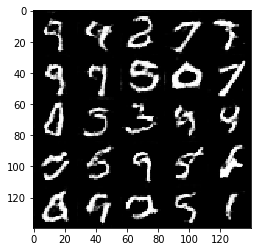

Epoch 2/2... Discriminator Loss: 0.8659... Generator Loss: 1.4928
Epoch 2/2... Discriminator Loss: 0.8581... Generator Loss: 1.0241
Epoch 2/2... Discriminator Loss: 0.7388... Generator Loss: 1.3211
Epoch 2/2... Discriminator Loss: 0.7204... Generator Loss: 1.4113
Epoch 2/2... Discriminator Loss: 1.0831... Generator Loss: 0.7236
Epoch 2/2... Discriminator Loss: 2.5662... Generator Loss: 0.2336
Epoch 2/2... Discriminator Loss: 0.8357... Generator Loss: 1.3103
Epoch 2/2... Discriminator Loss: 1.1077... Generator Loss: 0.7055
Epoch 2/2... Discriminator Loss: 0.9260... Generator Loss: 0.9106
Epoch 2/2... Discriminator Loss: 0.8886... Generator Loss: 1.0271


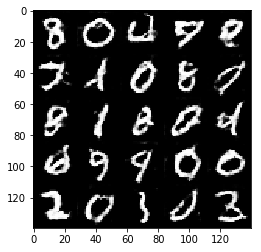

Epoch 2/2... Discriminator Loss: 1.1112... Generator Loss: 0.7440
Epoch 2/2... Discriminator Loss: 1.3979... Generator Loss: 0.4815
Epoch 2/2... Discriminator Loss: 1.4623... Generator Loss: 0.4826
Epoch 2/2... Discriminator Loss: 1.3754... Generator Loss: 0.5162
Epoch 2/2... Discriminator Loss: 0.8289... Generator Loss: 1.0646
Epoch 2/2... Discriminator Loss: 0.7054... Generator Loss: 1.3845
Epoch 2/2... Discriminator Loss: 0.8765... Generator Loss: 1.5066
Epoch 2/2... Discriminator Loss: 1.1408... Generator Loss: 0.6718
Epoch 2/2... Discriminator Loss: 0.8899... Generator Loss: 1.0198
Epoch 2/2... Discriminator Loss: 1.1262... Generator Loss: 0.7229


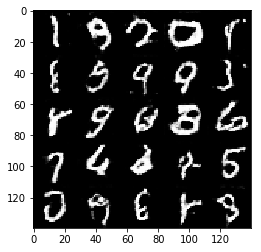

Epoch 2/2... Discriminator Loss: 0.7429... Generator Loss: 1.6829
Epoch 2/2... Discriminator Loss: 2.2826... Generator Loss: 0.2353
Epoch 2/2... Discriminator Loss: 0.7746... Generator Loss: 1.2600
Epoch 2/2... Discriminator Loss: 1.2340... Generator Loss: 0.6548
Epoch 2/2... Discriminator Loss: 0.8425... Generator Loss: 1.0545
Epoch 2/2... Discriminator Loss: 0.7979... Generator Loss: 1.1861
Epoch 2/2... Discriminator Loss: 0.7906... Generator Loss: 1.1596
Epoch 2/2... Discriminator Loss: 0.6541... Generator Loss: 1.5908
Epoch 2/2... Discriminator Loss: 0.5723... Generator Loss: 1.8284
Epoch 2/2... Discriminator Loss: 0.7744... Generator Loss: 1.1425


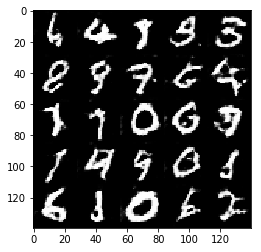

Epoch 2/2... Discriminator Loss: 0.7174... Generator Loss: 1.4752
Epoch 2/2... Discriminator Loss: 0.6966... Generator Loss: 1.7513
Epoch 2/2... Discriminator Loss: 0.7932... Generator Loss: 1.4725
Epoch 2/2... Discriminator Loss: 1.0283... Generator Loss: 0.8052
Epoch 2/2... Discriminator Loss: 0.8572... Generator Loss: 0.9871
Epoch 2/2... Discriminator Loss: 0.8841... Generator Loss: 1.0123
Epoch 2/2... Discriminator Loss: 0.8764... Generator Loss: 1.1855
Epoch 2/2... Discriminator Loss: 1.2261... Generator Loss: 0.6725
Epoch 2/2... Discriminator Loss: 3.1583... Generator Loss: 0.0939
Epoch 2/2... Discriminator Loss: 1.0473... Generator Loss: 0.8085


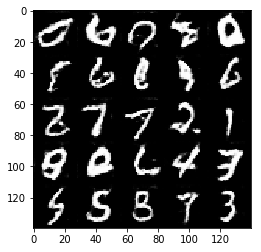

Epoch 2/2... Discriminator Loss: 1.7281... Generator Loss: 0.3870
Epoch 2/2... Discriminator Loss: 0.9132... Generator Loss: 0.9161
Epoch 2/2... Discriminator Loss: 0.8040... Generator Loss: 1.1293
Epoch 2/2... Discriminator Loss: 0.7555... Generator Loss: 1.2181
Epoch 2/2... Discriminator Loss: 0.6501... Generator Loss: 1.4515
Epoch 2/2... Discriminator Loss: 0.7738... Generator Loss: 1.1877
Epoch 2/2... Discriminator Loss: 0.7449... Generator Loss: 1.8571
Epoch 2/2... Discriminator Loss: 1.1046... Generator Loss: 0.7244
Epoch 2/2... Discriminator Loss: 0.7596... Generator Loss: 1.1725
Epoch 2/2... Discriminator Loss: 0.9601... Generator Loss: 0.9142


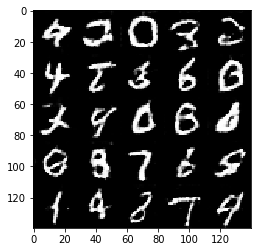

Epoch 2/2... Discriminator Loss: 0.9457... Generator Loss: 0.9243
Epoch 2/2... Discriminator Loss: 0.6649... Generator Loss: 1.3718
Epoch 2/2... Discriminator Loss: 0.8281... Generator Loss: 1.5892
Epoch 2/2... Discriminator Loss: 0.9424... Generator Loss: 2.1758
Epoch 2/2... Discriminator Loss: 0.9161... Generator Loss: 2.0507
Epoch 2/2... Discriminator Loss: 0.7834... Generator Loss: 1.2373
Epoch 2/2... Discriminator Loss: 0.6619... Generator Loss: 1.6203
Epoch 2/2... Discriminator Loss: 0.6909... Generator Loss: 1.6305
Epoch 2/2... Discriminator Loss: 1.2858... Generator Loss: 0.5990
Epoch 2/2... Discriminator Loss: 0.6224... Generator Loss: 1.5135


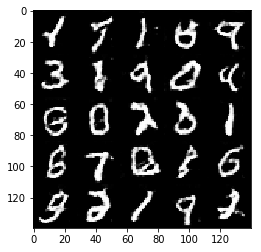

Epoch 2/2... Discriminator Loss: 0.8259... Generator Loss: 1.1316
Epoch 2/2... Discriminator Loss: 1.6014... Generator Loss: 0.4328
Epoch 2/2... Discriminator Loss: 0.7407... Generator Loss: 1.3313
Epoch 2/2... Discriminator Loss: 1.6037... Generator Loss: 0.3844
Epoch 2/2... Discriminator Loss: 0.7701... Generator Loss: 1.6457
Epoch 2/2... Discriminator Loss: 0.6628... Generator Loss: 1.4698
Epoch 2/2... Discriminator Loss: 0.6823... Generator Loss: 1.4414
Epoch 2/2... Discriminator Loss: 1.1110... Generator Loss: 0.7267
Epoch 2/2... Discriminator Loss: 0.7786... Generator Loss: 1.1348
Epoch 2/2... Discriminator Loss: 0.7529... Generator Loss: 1.2554


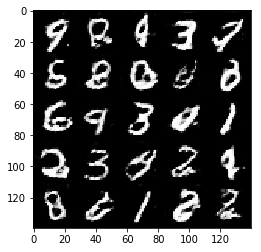

Epoch 2/2... Discriminator Loss: 0.7824... Generator Loss: 1.6562
Epoch 2/2... Discriminator Loss: 0.7919... Generator Loss: 1.1655
Epoch 2/2... Discriminator Loss: 2.5602... Generator Loss: 0.2218
Epoch 2/2... Discriminator Loss: 1.0101... Generator Loss: 0.8553
Epoch 2/2... Discriminator Loss: 0.9223... Generator Loss: 1.0573
Epoch 2/2... Discriminator Loss: 0.7652... Generator Loss: 1.2858
Epoch 2/2... Discriminator Loss: 0.7371... Generator Loss: 1.2718
Epoch 2/2... Discriminator Loss: 1.0490... Generator Loss: 0.7496
Epoch 2/2... Discriminator Loss: 0.7824... Generator Loss: 1.1861
Epoch 2/2... Discriminator Loss: 0.6293... Generator Loss: 1.5676


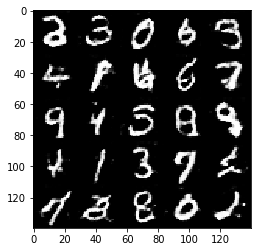

Epoch 2/2... Discriminator Loss: 0.6044... Generator Loss: 1.6081
Epoch 2/2... Discriminator Loss: 0.9904... Generator Loss: 0.8199
Epoch 2/2... Discriminator Loss: 0.8451... Generator Loss: 1.0208
Epoch 2/2... Discriminator Loss: 1.2146... Generator Loss: 3.2219
Epoch 2/2... Discriminator Loss: 1.0624... Generator Loss: 0.7750
Epoch 2/2... Discriminator Loss: 0.9389... Generator Loss: 0.9333
Epoch 2/2... Discriminator Loss: 0.7628... Generator Loss: 1.1864
Epoch 2/2... Discriminator Loss: 1.1812... Generator Loss: 0.6521
Epoch 2/2... Discriminator Loss: 0.8229... Generator Loss: 1.0872
Epoch 2/2... Discriminator Loss: 1.0836... Generator Loss: 0.7816


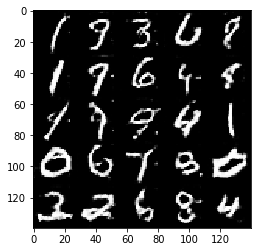

Epoch 2/2... Discriminator Loss: 0.6679... Generator Loss: 1.4337
Epoch 2/2... Discriminator Loss: 1.2131... Generator Loss: 0.6167
Epoch 2/2... Discriminator Loss: 0.7333... Generator Loss: 1.3208
Epoch 2/2... Discriminator Loss: 0.6795... Generator Loss: 1.4478
Epoch 2/2... Discriminator Loss: 0.7661... Generator Loss: 1.3538
Epoch 2/2... Discriminator Loss: 1.6156... Generator Loss: 0.4400
Epoch 2/2... Discriminator Loss: 1.0977... Generator Loss: 0.7759
Epoch 2/2... Discriminator Loss: 1.6560... Generator Loss: 0.3950
Epoch 2/2... Discriminator Loss: 1.0453... Generator Loss: 0.8567
Epoch 2/2... Discriminator Loss: 1.9229... Generator Loss: 0.2735


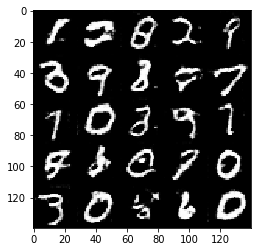

Epoch 2/2... Discriminator Loss: 1.5368... Generator Loss: 0.4200
Epoch 2/2... Discriminator Loss: 0.9084... Generator Loss: 0.9631
Epoch 2/2... Discriminator Loss: 0.9282... Generator Loss: 0.9951
Epoch 2/2... Discriminator Loss: 1.4767... Generator Loss: 0.5641
Epoch 2/2... Discriminator Loss: 0.7406... Generator Loss: 1.2773
Epoch 2/2... Discriminator Loss: 1.3436... Generator Loss: 0.5352
Epoch 2/2... Discriminator Loss: 0.6368... Generator Loss: 1.5319
Epoch 2/2... Discriminator Loss: 0.7158... Generator Loss: 1.3246
Epoch 2/2... Discriminator Loss: 0.7677... Generator Loss: 1.2049
Epoch 2/2... Discriminator Loss: 1.3708... Generator Loss: 0.5174


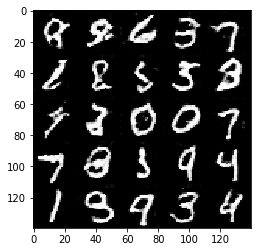

Epoch 2/2... Discriminator Loss: 0.6111... Generator Loss: 1.7078
Epoch 2/2... Discriminator Loss: 1.7927... Generator Loss: 0.3519
Epoch 2/2... Discriminator Loss: 1.2778... Generator Loss: 0.6604
Epoch 2/2... Discriminator Loss: 1.3890... Generator Loss: 0.5213
Epoch 2/2... Discriminator Loss: 0.9868... Generator Loss: 0.8591
Epoch 2/2... Discriminator Loss: 0.6364... Generator Loss: 1.5883
Epoch 2/2... Discriminator Loss: 0.5982... Generator Loss: 1.7711
Epoch 2/2... Discriminator Loss: 2.0459... Generator Loss: 0.2789
Epoch 2/2... Discriminator Loss: 0.9707... Generator Loss: 0.9667
Epoch 2/2... Discriminator Loss: 1.2077... Generator Loss: 0.6272


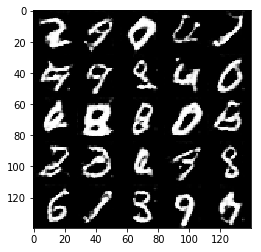

In [ ]:
batch_size = 28
z_dim = 128
learning_rate = 0.0001
beta1 = 0.3


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

(?, 28, 28, 3)
Epoch 1/1... Discriminator Loss: 6.9648... Generator Loss: 0.0021
Epoch 1/1... Discriminator Loss: 5.7706... Generator Loss: 0.0064
Epoch 1/1... Discriminator Loss: 3.6357... Generator Loss: 0.0548
Epoch 1/1... Discriminator Loss: 1.1899... Generator Loss: 1.4436
Epoch 1/1... Discriminator Loss: 1.9639... Generator Loss: 0.3333
Epoch 1/1... Discriminator Loss: 2.3697... Generator Loss: 0.2041
Epoch 1/1... Discriminator Loss: 1.6900... Generator Loss: 0.4718
Epoch 1/1... Discriminator Loss: 1.7373... Generator Loss: 0.5582
Epoch 1/1... Discriminator Loss: 1.5996... Generator Loss: 0.9663
Epoch 1/1... Discriminator Loss: 1.2239... Generator Loss: 0.8684


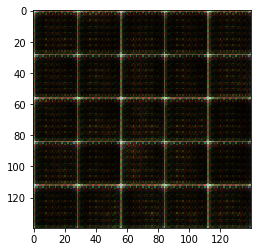

Epoch 1/1... Discriminator Loss: 1.8495... Generator Loss: 0.4807
Epoch 1/1... Discriminator Loss: 2.6585... Generator Loss: 0.1263
Epoch 1/1... Discriminator Loss: 2.3009... Generator Loss: 0.1933
Epoch 1/1... Discriminator Loss: 1.9063... Generator Loss: 0.3259
Epoch 1/1... Discriminator Loss: 1.9982... Generator Loss: 0.2500
Epoch 1/1... Discriminator Loss: 1.6843... Generator Loss: 0.8509
Epoch 1/1... Discriminator Loss: 1.6723... Generator Loss: 0.8342
Epoch 1/1... Discriminator Loss: 1.6085... Generator Loss: 0.8952
Epoch 1/1... Discriminator Loss: 2.5534... Generator Loss: 0.1361
Epoch 1/1... Discriminator Loss: 1.4584... Generator Loss: 0.9809


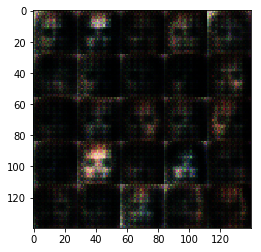

Epoch 1/1... Discriminator Loss: 1.3986... Generator Loss: 1.0691
Epoch 1/1... Discriminator Loss: 2.1320... Generator Loss: 0.2921
Epoch 1/1... Discriminator Loss: 1.8859... Generator Loss: 0.2674
Epoch 1/1... Discriminator Loss: 1.4691... Generator Loss: 0.4693
Epoch 1/1... Discriminator Loss: 2.0647... Generator Loss: 0.2767
Epoch 1/1... Discriminator Loss: 1.5715... Generator Loss: 0.5554
Epoch 1/1... Discriminator Loss: 2.0457... Generator Loss: 0.2531
Epoch 1/1... Discriminator Loss: 1.5730... Generator Loss: 1.0498
Epoch 1/1... Discriminator Loss: 2.1411... Generator Loss: 0.2698
Epoch 1/1... Discriminator Loss: 1.6515... Generator Loss: 0.8999


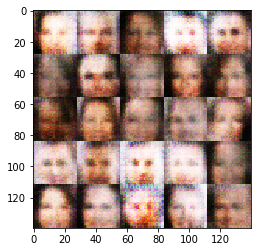

Epoch 1/1... Discriminator Loss: 1.9445... Generator Loss: 0.3268
Epoch 1/1... Discriminator Loss: 1.7000... Generator Loss: 0.3698
Epoch 1/1... Discriminator Loss: 1.6293... Generator Loss: 0.4072
Epoch 1/1... Discriminator Loss: 1.7721... Generator Loss: 0.3613
Epoch 1/1... Discriminator Loss: 1.5593... Generator Loss: 0.4190
Epoch 1/1... Discriminator Loss: 1.6236... Generator Loss: 1.4583
Epoch 1/1... Discriminator Loss: 1.3108... Generator Loss: 0.9224
Epoch 1/1... Discriminator Loss: 1.6328... Generator Loss: 0.6236
Epoch 1/1... Discriminator Loss: 1.5571... Generator Loss: 0.4345
Epoch 1/1... Discriminator Loss: 1.6404... Generator Loss: 0.4604


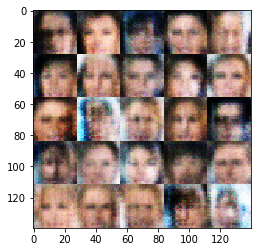

Epoch 1/1... Discriminator Loss: 1.5419... Generator Loss: 0.7519
Epoch 1/1... Discriminator Loss: 1.6557... Generator Loss: 0.4450
Epoch 1/1... Discriminator Loss: 1.4842... Generator Loss: 0.4974
Epoch 1/1... Discriminator Loss: 1.5353... Generator Loss: 0.7272
Epoch 1/1... Discriminator Loss: 1.6361... Generator Loss: 0.9035
Epoch 1/1... Discriminator Loss: 1.7404... Generator Loss: 0.3480
Epoch 1/1... Discriminator Loss: 1.4854... Generator Loss: 0.5406
Epoch 1/1... Discriminator Loss: 1.3910... Generator Loss: 0.5594
Epoch 1/1... Discriminator Loss: 1.5418... Generator Loss: 0.7667
Epoch 1/1... Discriminator Loss: 1.4735... Generator Loss: 0.7962


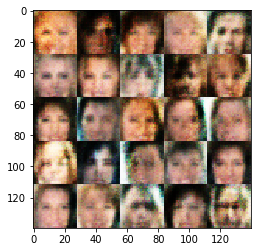

Epoch 1/1... Discriminator Loss: 1.4582... Generator Loss: 1.0397
Epoch 1/1... Discriminator Loss: 1.3090... Generator Loss: 0.8024
Epoch 1/1... Discriminator Loss: 1.3059... Generator Loss: 0.9712
Epoch 1/1... Discriminator Loss: 1.4780... Generator Loss: 1.0381
Epoch 1/1... Discriminator Loss: 1.4170... Generator Loss: 1.1913
Epoch 1/1... Discriminator Loss: 1.4749... Generator Loss: 0.8022
Epoch 1/1... Discriminator Loss: 1.1691... Generator Loss: 0.9766
Epoch 1/1... Discriminator Loss: 1.3300... Generator Loss: 0.6969
Epoch 1/1... Discriminator Loss: 1.3365... Generator Loss: 0.8547
Epoch 1/1... Discriminator Loss: 1.3552... Generator Loss: 0.6948


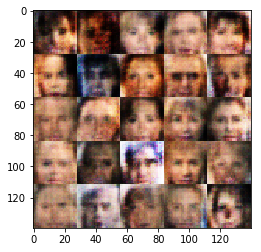

Epoch 1/1... Discriminator Loss: 1.1993... Generator Loss: 0.8203
Epoch 1/1... Discriminator Loss: 1.5076... Generator Loss: 0.7152
Epoch 1/1... Discriminator Loss: 1.4376... Generator Loss: 0.6738
Epoch 1/1... Discriminator Loss: 1.3006... Generator Loss: 1.0051
Epoch 1/1... Discriminator Loss: 1.3945... Generator Loss: 0.8689
Epoch 1/1... Discriminator Loss: 1.3774... Generator Loss: 0.6482
Epoch 1/1... Discriminator Loss: 1.5395... Generator Loss: 0.6659
Epoch 1/1... Discriminator Loss: 1.3687... Generator Loss: 0.5927
Epoch 1/1... Discriminator Loss: 1.5639... Generator Loss: 0.5204
Epoch 1/1... Discriminator Loss: 1.5547... Generator Loss: 0.6999


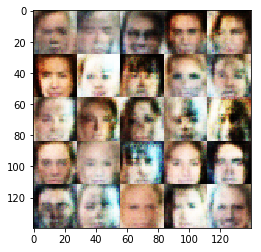

Epoch 1/1... Discriminator Loss: 1.3553... Generator Loss: 0.8721
Epoch 1/1... Discriminator Loss: 1.3098... Generator Loss: 0.9293
Epoch 1/1... Discriminator Loss: 1.3746... Generator Loss: 0.5847
Epoch 1/1... Discriminator Loss: 1.2954... Generator Loss: 0.8398
Epoch 1/1... Discriminator Loss: 1.5900... Generator Loss: 0.4098
Epoch 1/1... Discriminator Loss: 1.4716... Generator Loss: 1.4201
Epoch 1/1... Discriminator Loss: 1.5203... Generator Loss: 0.4740
Epoch 1/1... Discriminator Loss: 1.7086... Generator Loss: 0.3430
Epoch 1/1... Discriminator Loss: 1.4740... Generator Loss: 0.5122
Epoch 1/1... Discriminator Loss: 1.3946... Generator Loss: 0.5861


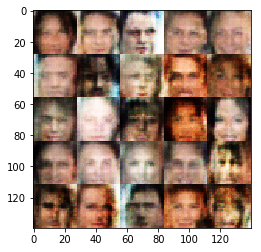

Epoch 1/1... Discriminator Loss: 1.6357... Generator Loss: 0.3710
Epoch 1/1... Discriminator Loss: 1.4117... Generator Loss: 0.6065
Epoch 1/1... Discriminator Loss: 1.5028... Generator Loss: 0.5324
Epoch 1/1... Discriminator Loss: 1.3890... Generator Loss: 0.9628
Epoch 1/1... Discriminator Loss: 1.4022... Generator Loss: 0.6178
Epoch 1/1... Discriminator Loss: 1.3545... Generator Loss: 1.1488
Epoch 1/1... Discriminator Loss: 1.4616... Generator Loss: 0.5568
Epoch 1/1... Discriminator Loss: 1.6054... Generator Loss: 0.4963
Epoch 1/1... Discriminator Loss: 1.2661... Generator Loss: 1.1135
Epoch 1/1... Discriminator Loss: 1.3704... Generator Loss: 0.7321


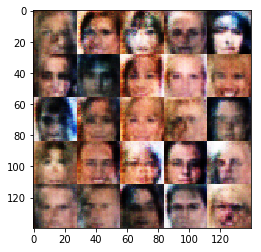

Epoch 1/1... Discriminator Loss: 1.4024... Generator Loss: 0.6904
Epoch 1/1... Discriminator Loss: 1.4042... Generator Loss: 0.8885
Epoch 1/1... Discriminator Loss: 1.2670... Generator Loss: 0.7591
Epoch 1/1... Discriminator Loss: 1.2603... Generator Loss: 0.8854
Epoch 1/1... Discriminator Loss: 1.1916... Generator Loss: 0.9948
Epoch 1/1... Discriminator Loss: 1.3088... Generator Loss: 0.9068
Epoch 1/1... Discriminator Loss: 1.4245... Generator Loss: 0.9518
Epoch 1/1... Discriminator Loss: 1.1348... Generator Loss: 0.9307
Epoch 1/1... Discriminator Loss: 1.3122... Generator Loss: 1.1421
Epoch 1/1... Discriminator Loss: 1.2031... Generator Loss: 0.7785


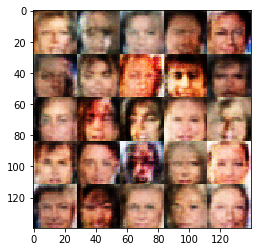

Epoch 1/1... Discriminator Loss: 1.4424... Generator Loss: 0.5654
Epoch 1/1... Discriminator Loss: 1.3169... Generator Loss: 0.6202
Epoch 1/1... Discriminator Loss: 1.2812... Generator Loss: 0.8812
Epoch 1/1... Discriminator Loss: 1.4437... Generator Loss: 0.6021
Epoch 1/1... Discriminator Loss: 1.3855... Generator Loss: 0.6298
Epoch 1/1... Discriminator Loss: 1.3904... Generator Loss: 0.6145
Epoch 1/1... Discriminator Loss: 1.3675... Generator Loss: 0.6680
Epoch 1/1... Discriminator Loss: 1.3040... Generator Loss: 1.8068
Epoch 1/1... Discriminator Loss: 1.3276... Generator Loss: 0.5722
Epoch 1/1... Discriminator Loss: 1.3858... Generator Loss: 0.9645


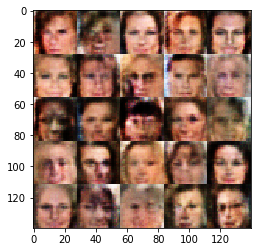

Epoch 1/1... Discriminator Loss: 1.3684... Generator Loss: 0.5701
Epoch 1/1... Discriminator Loss: 1.1081... Generator Loss: 1.1419
Epoch 1/1... Discriminator Loss: 1.2267... Generator Loss: 0.8757
Epoch 1/1... Discriminator Loss: 1.5504... Generator Loss: 0.4261
Epoch 1/1... Discriminator Loss: 1.5365... Generator Loss: 1.8994
Epoch 1/1... Discriminator Loss: 1.3324... Generator Loss: 0.6035
Epoch 1/1... Discriminator Loss: 1.4370... Generator Loss: 0.5101
Epoch 1/1... Discriminator Loss: 1.3110... Generator Loss: 0.6353
Epoch 1/1... Discriminator Loss: 1.3870... Generator Loss: 1.0519
Epoch 1/1... Discriminator Loss: 1.1875... Generator Loss: 1.1576


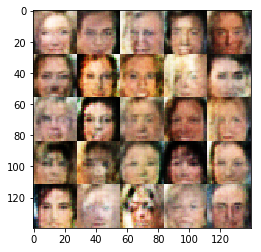

Epoch 1/1... Discriminator Loss: 1.4551... Generator Loss: 0.4491
Epoch 1/1... Discriminator Loss: 1.2559... Generator Loss: 1.1254
Epoch 1/1... Discriminator Loss: 1.3827... Generator Loss: 0.5847
Epoch 1/1... Discriminator Loss: 1.9015... Generator Loss: 0.2553
Epoch 1/1... Discriminator Loss: 1.9671... Generator Loss: 0.2312
Epoch 1/1... Discriminator Loss: 1.1850... Generator Loss: 1.0549
Epoch 1/1... Discriminator Loss: 1.5985... Generator Loss: 0.3951
Epoch 1/1... Discriminator Loss: 1.3600... Generator Loss: 1.0004
Epoch 1/1... Discriminator Loss: 1.1261... Generator Loss: 0.7363
Epoch 1/1... Discriminator Loss: 1.5683... Generator Loss: 1.5268


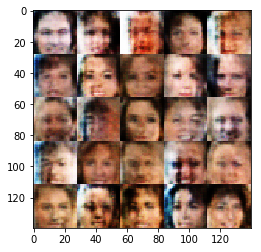

Epoch 1/1... Discriminator Loss: 1.5575... Generator Loss: 0.4096
Epoch 1/1... Discriminator Loss: 1.3643... Generator Loss: 0.7810
Epoch 1/1... Discriminator Loss: 1.5209... Generator Loss: 0.4894
Epoch 1/1... Discriminator Loss: 1.0755... Generator Loss: 1.0461
Epoch 1/1... Discriminator Loss: 1.4316... Generator Loss: 0.5530
Epoch 1/1... Discriminator Loss: 1.4216... Generator Loss: 0.5005
Epoch 1/1... Discriminator Loss: 1.0336... Generator Loss: 0.9488
Epoch 1/1... Discriminator Loss: 1.6687... Generator Loss: 0.5422
Epoch 1/1... Discriminator Loss: 1.4806... Generator Loss: 2.1920
Epoch 1/1... Discriminator Loss: 1.3638... Generator Loss: 0.6433


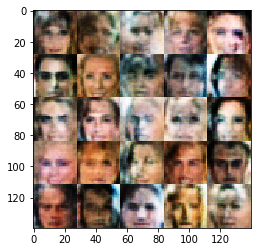

Epoch 1/1... Discriminator Loss: 1.2106... Generator Loss: 0.6706
Epoch 1/1... Discriminator Loss: 1.2144... Generator Loss: 1.1888
Epoch 1/1... Discriminator Loss: 1.4793... Generator Loss: 0.7077
Epoch 1/1... Discriminator Loss: 1.2300... Generator Loss: 0.7560
Epoch 1/1... Discriminator Loss: 1.2450... Generator Loss: 0.6458
Epoch 1/1... Discriminator Loss: 1.0856... Generator Loss: 0.8045
Epoch 1/1... Discriminator Loss: 1.9188... Generator Loss: 0.2705
Epoch 1/1... Discriminator Loss: 1.5654... Generator Loss: 0.4098
Epoch 1/1... Discriminator Loss: 1.4935... Generator Loss: 0.4957
Epoch 1/1... Discriminator Loss: 1.0533... Generator Loss: 1.1116


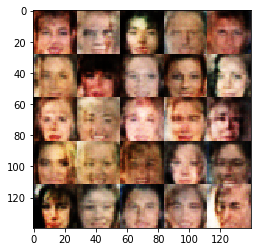

Epoch 1/1... Discriminator Loss: 1.4337... Generator Loss: 1.0155
Epoch 1/1... Discriminator Loss: 1.2602... Generator Loss: 0.6013
Epoch 1/1... Discriminator Loss: 0.9293... Generator Loss: 1.0538
Epoch 1/1... Discriminator Loss: 1.1864... Generator Loss: 0.7669
Epoch 1/1... Discriminator Loss: 1.4640... Generator Loss: 0.4363
Epoch 1/1... Discriminator Loss: 1.6056... Generator Loss: 0.3886
Epoch 1/1... Discriminator Loss: 1.2121... Generator Loss: 0.6339
Epoch 1/1... Discriminator Loss: 1.5952... Generator Loss: 0.4637
Epoch 1/1... Discriminator Loss: 1.3300... Generator Loss: 0.9215
Epoch 1/1... Discriminator Loss: 1.2920... Generator Loss: 0.6050


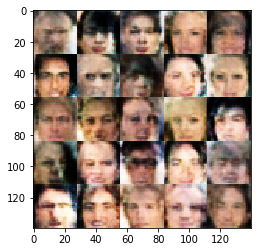

Epoch 1/1... Discriminator Loss: 1.8249... Generator Loss: 0.8160
Epoch 1/1... Discriminator Loss: 0.8717... Generator Loss: 1.5445
Epoch 1/1... Discriminator Loss: 0.8467... Generator Loss: 1.2135
Epoch 1/1... Discriminator Loss: 1.4019... Generator Loss: 1.0672
Epoch 1/1... Discriminator Loss: 1.3117... Generator Loss: 0.5425
Epoch 1/1... Discriminator Loss: 1.3400... Generator Loss: 0.5559
Epoch 1/1... Discriminator Loss: 0.9828... Generator Loss: 1.0815
Epoch 1/1... Discriminator Loss: 1.8784... Generator Loss: 0.2503
Epoch 1/1... Discriminator Loss: 0.9263... Generator Loss: 1.5801
Epoch 1/1... Discriminator Loss: 0.9091... Generator Loss: 1.3046


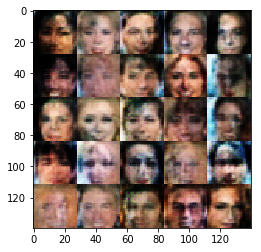

Epoch 1/1... Discriminator Loss: 1.1591... Generator Loss: 0.7099
Epoch 1/1... Discriminator Loss: 2.0326... Generator Loss: 0.2264
Epoch 1/1... Discriminator Loss: 1.4782... Generator Loss: 0.8048
Epoch 1/1... Discriminator Loss: 0.8372... Generator Loss: 1.2280
Epoch 1/1... Discriminator Loss: 2.0028... Generator Loss: 0.5858
Epoch 1/1... Discriminator Loss: 1.6846... Generator Loss: 1.3753
Epoch 1/1... Discriminator Loss: 0.8774... Generator Loss: 1.9698
Epoch 1/1... Discriminator Loss: 1.4934... Generator Loss: 0.4165
Epoch 1/1... Discriminator Loss: 1.2972... Generator Loss: 0.7881
Epoch 1/1... Discriminator Loss: 1.2435... Generator Loss: 0.5933


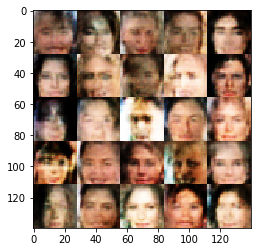

Epoch 1/1... Discriminator Loss: 0.7346... Generator Loss: 1.3995
Epoch 1/1... Discriminator Loss: 0.9617... Generator Loss: 1.5649
Epoch 1/1... Discriminator Loss: 1.0108... Generator Loss: 1.2178
Epoch 1/1... Discriminator Loss: 1.4084... Generator Loss: 1.6100
Epoch 1/1... Discriminator Loss: 1.0872... Generator Loss: 0.7731
Epoch 1/1... Discriminator Loss: 1.4701... Generator Loss: 1.9928
Epoch 1/1... Discriminator Loss: 0.9166... Generator Loss: 2.0451
Epoch 1/1... Discriminator Loss: 0.6259... Generator Loss: 1.8416
Epoch 1/1... Discriminator Loss: 1.4058... Generator Loss: 0.7154
Epoch 1/1... Discriminator Loss: 1.3208... Generator Loss: 0.5405


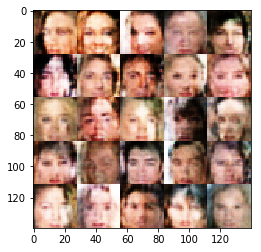

Epoch 1/1... Discriminator Loss: 0.5471... Generator Loss: 2.1550
Epoch 1/1... Discriminator Loss: 0.8860... Generator Loss: 2.6336
Epoch 1/1... Discriminator Loss: 0.8630... Generator Loss: 1.0182
Epoch 1/1... Discriminator Loss: 0.5205... Generator Loss: 3.2794
Epoch 1/1... Discriminator Loss: 0.4885... Generator Loss: 3.0519
Epoch 1/1... Discriminator Loss: 0.9990... Generator Loss: 1.5718
Epoch 1/1... Discriminator Loss: 0.8179... Generator Loss: 2.7725
Epoch 1/1... Discriminator Loss: 0.7683... Generator Loss: 1.1588
Epoch 1/1... Discriminator Loss: 1.1631... Generator Loss: 0.6084
Epoch 1/1... Discriminator Loss: 0.5386... Generator Loss: 2.7808


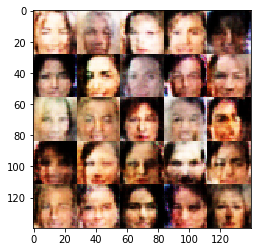

Epoch 1/1... Discriminator Loss: 0.4037... Generator Loss: 3.0371
Epoch 1/1... Discriminator Loss: 0.5373... Generator Loss: 1.8409
Epoch 1/1... Discriminator Loss: 2.0358... Generator Loss: 0.2475
Epoch 1/1... Discriminator Loss: 0.5203... Generator Loss: 3.4029
Epoch 1/1... Discriminator Loss: 0.5878... Generator Loss: 1.6423
Epoch 1/1... Discriminator Loss: 1.6957... Generator Loss: 0.3127
Epoch 1/1... Discriminator Loss: 0.5437... Generator Loss: 1.9218
Epoch 1/1... Discriminator Loss: 0.9529... Generator Loss: 3.2237
Epoch 1/1... Discriminator Loss: 0.7187... Generator Loss: 1.2778
Epoch 1/1... Discriminator Loss: 0.6330... Generator Loss: 1.4586


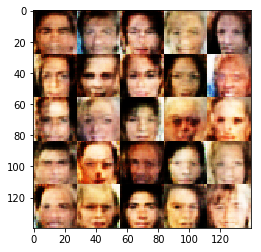

Epoch 1/1... Discriminator Loss: 1.0611... Generator Loss: 0.8259
Epoch 1/1... Discriminator Loss: 1.5485... Generator Loss: 0.3826
Epoch 1/1... Discriminator Loss: 0.5502... Generator Loss: 1.7576
Epoch 1/1... Discriminator Loss: 0.4618... Generator Loss: 4.4442
Epoch 1/1... Discriminator Loss: 0.7339... Generator Loss: 4.6403
Epoch 1/1... Discriminator Loss: 0.4528... Generator Loss: 4.1120
Epoch 1/1... Discriminator Loss: 0.4845... Generator Loss: 3.7260
Epoch 1/1... Discriminator Loss: 1.3151... Generator Loss: 0.4991
Epoch 1/1... Discriminator Loss: 0.5488... Generator Loss: 2.1915
Epoch 1/1... Discriminator Loss: 0.8324... Generator Loss: 1.0901


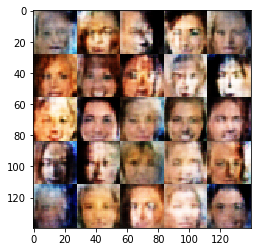

Epoch 1/1... Discriminator Loss: 1.2987... Generator Loss: 0.6872
Epoch 1/1... Discriminator Loss: 0.5709... Generator Loss: 1.7207
Epoch 1/1... Discriminator Loss: 2.0766... Generator Loss: 0.2185
Epoch 1/1... Discriminator Loss: 0.7288... Generator Loss: 1.2654
Epoch 1/1... Discriminator Loss: 1.0295... Generator Loss: 0.7684
Epoch 1/1... Discriminator Loss: 0.4138... Generator Loss: 2.9575
Epoch 1/1... Discriminator Loss: 0.7696... Generator Loss: 1.2059
Epoch 1/1... Discriminator Loss: 0.4538... Generator Loss: 2.6319
Epoch 1/1... Discriminator Loss: 0.4168... Generator Loss: 2.7523
Epoch 1/1... Discriminator Loss: 0.7176... Generator Loss: 4.3524


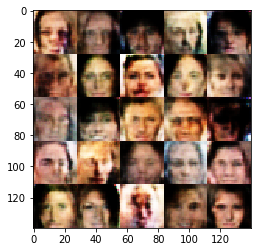

Epoch 1/1... Discriminator Loss: 0.4047... Generator Loss: 2.9264
Epoch 1/1... Discriminator Loss: 0.3834... Generator Loss: 3.4373
Epoch 1/1... Discriminator Loss: 2.2301... Generator Loss: 4.0580
Epoch 1/1... Discriminator Loss: 0.6353... Generator Loss: 1.5655
Epoch 1/1... Discriminator Loss: 0.5283... Generator Loss: 1.9041
Epoch 1/1... Discriminator Loss: 0.7807... Generator Loss: 1.1146
Epoch 1/1... Discriminator Loss: 0.4371... Generator Loss: 2.8283
Epoch 1/1... Discriminator Loss: 0.6040... Generator Loss: 2.3487
Epoch 1/1... Discriminator Loss: 1.7749... Generator Loss: 2.8876
Epoch 1/1... Discriminator Loss: 1.1191... Generator Loss: 0.6736


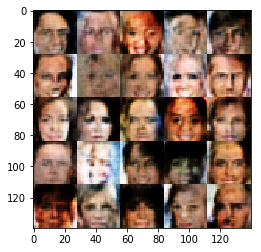

Epoch 1/1... Discriminator Loss: 0.5681... Generator Loss: 1.6758
Epoch 1/1... Discriminator Loss: 0.7029... Generator Loss: 2.1658
Epoch 1/1... Discriminator Loss: 0.8603... Generator Loss: 0.9428
Epoch 1/1... Discriminator Loss: 0.4766... Generator Loss: 2.1891
Epoch 1/1... Discriminator Loss: 0.6131... Generator Loss: 4.3183
Epoch 1/1... Discriminator Loss: 0.4945... Generator Loss: 2.0560
Epoch 1/1... Discriminator Loss: 0.7037... Generator Loss: 1.4519
Epoch 1/1... Discriminator Loss: 0.6441... Generator Loss: 1.5500
Epoch 1/1... Discriminator Loss: 0.4370... Generator Loss: 3.2118
Epoch 1/1... Discriminator Loss: 0.4408... Generator Loss: 2.7200


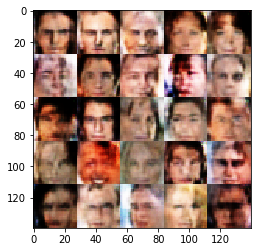

Epoch 1/1... Discriminator Loss: 0.9920... Generator Loss: 0.9060
Epoch 1/1... Discriminator Loss: 0.4376... Generator Loss: 2.5004
Epoch 1/1... Discriminator Loss: 0.5870... Generator Loss: 2.3988
Epoch 1/1... Discriminator Loss: 0.8375... Generator Loss: 0.9729
Epoch 1/1... Discriminator Loss: 0.7715... Generator Loss: 1.1790
Epoch 1/1... Discriminator Loss: 1.1220... Generator Loss: 2.3252
Epoch 1/1... Discriminator Loss: 0.4442... Generator Loss: 2.7271
Epoch 1/1... Discriminator Loss: 0.4023... Generator Loss: 3.7380
Epoch 1/1... Discriminator Loss: 1.5443... Generator Loss: 1.8463
Epoch 1/1... Discriminator Loss: 0.9569... Generator Loss: 0.8474


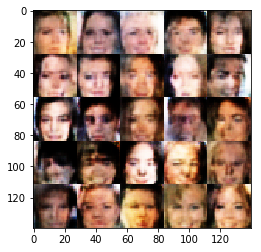

Epoch 1/1... Discriminator Loss: 0.5724... Generator Loss: 1.7061
Epoch 1/1... Discriminator Loss: 1.3908... Generator Loss: 3.7517
Epoch 1/1... Discriminator Loss: 0.6241... Generator Loss: 1.4939
Epoch 1/1... Discriminator Loss: 0.4880... Generator Loss: 2.2031
Epoch 1/1... Discriminator Loss: 1.2473... Generator Loss: 3.5280
Epoch 1/1... Discriminator Loss: 0.4869... Generator Loss: 2.2428
Epoch 1/1... Discriminator Loss: 0.3880... Generator Loss: 3.0593
Epoch 1/1... Discriminator Loss: 0.4640... Generator Loss: 3.4193
Epoch 1/1... Discriminator Loss: 0.3701... Generator Loss: 3.7131
Epoch 1/1... Discriminator Loss: 0.4316... Generator Loss: 2.8271


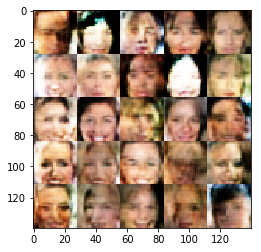

Epoch 1/1... Discriminator Loss: 0.4958... Generator Loss: 3.7523
Epoch 1/1... Discriminator Loss: 0.6177... Generator Loss: 3.7562
Epoch 1/1... Discriminator Loss: 0.6859... Generator Loss: 3.7565
Epoch 1/1... Discriminator Loss: 0.3710... Generator Loss: 4.6430
Epoch 1/1... Discriminator Loss: 0.3992... Generator Loss: 3.4269
Epoch 1/1... Discriminator Loss: 0.4367... Generator Loss: 3.9315
Epoch 1/1... Discriminator Loss: 0.4834... Generator Loss: 3.1432
Epoch 1/1... Discriminator Loss: 2.2931... Generator Loss: 3.5613
Epoch 1/1... Discriminator Loss: 0.5094... Generator Loss: 2.3369
Epoch 1/1... Discriminator Loss: 0.6631... Generator Loss: 1.3892


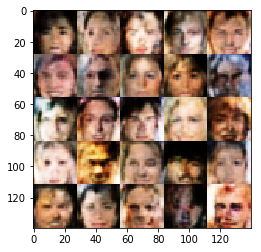

Epoch 1/1... Discriminator Loss: 0.3789... Generator Loss: 3.5838
Epoch 1/1... Discriminator Loss: 0.5375... Generator Loss: 2.1025
Epoch 1/1... Discriminator Loss: 0.4268... Generator Loss: 2.6817
Epoch 1/1... Discriminator Loss: 0.6452... Generator Loss: 3.4568
Epoch 1/1... Discriminator Loss: 0.4625... Generator Loss: 3.5817
Epoch 1/1... Discriminator Loss: 0.5635... Generator Loss: 4.4173
Epoch 1/1... Discriminator Loss: 0.3940... Generator Loss: 3.0988
Epoch 1/1... Discriminator Loss: 0.7986... Generator Loss: 1.1526
Epoch 1/1... Discriminator Loss: 0.3761... Generator Loss: 3.4384
Epoch 1/1... Discriminator Loss: 0.3777... Generator Loss: 3.7962


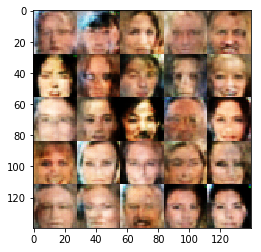

Epoch 1/1... Discriminator Loss: 3.3343... Generator Loss: 0.0696
Epoch 1/1... Discriminator Loss: 0.4870... Generator Loss: 3.2890
Epoch 1/1... Discriminator Loss: 1.9646... Generator Loss: 0.2818
Epoch 1/1... Discriminator Loss: 0.4864... Generator Loss: 2.3545
Epoch 1/1... Discriminator Loss: 0.5646... Generator Loss: 3.5854
Epoch 1/1... Discriminator Loss: 0.5585... Generator Loss: 2.4166
Epoch 1/1... Discriminator Loss: 0.6583... Generator Loss: 4.6405
Epoch 1/1... Discriminator Loss: 0.9453... Generator Loss: 0.9110
Epoch 1/1... Discriminator Loss: 0.4621... Generator Loss: 2.4008
Epoch 1/1... Discriminator Loss: 0.4583... Generator Loss: 2.3640


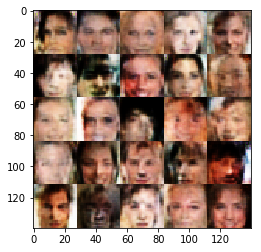

Epoch 1/1... Discriminator Loss: 0.5949... Generator Loss: 1.7687
Epoch 1/1... Discriminator Loss: 0.5615... Generator Loss: 4.7923
Epoch 1/1... Discriminator Loss: 0.4911... Generator Loss: 2.2243
Epoch 1/1... Discriminator Loss: 0.8616... Generator Loss: 1.0880
Epoch 1/1... Discriminator Loss: 0.7081... Generator Loss: 1.3253
Epoch 1/1... Discriminator Loss: 0.7219... Generator Loss: 1.3674
Epoch 1/1... Discriminator Loss: 0.3565... Generator Loss: 4.3510
Epoch 1/1... Discriminator Loss: 0.4811... Generator Loss: 2.2689
Epoch 1/1... Discriminator Loss: 0.4699... Generator Loss: 2.6593
Epoch 1/1... Discriminator Loss: 0.5944... Generator Loss: 1.6497


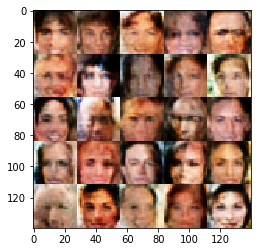

Epoch 1/1... Discriminator Loss: 0.4224... Generator Loss: 2.7527
Epoch 1/1... Discriminator Loss: 0.4831... Generator Loss: 2.2880
Epoch 1/1... Discriminator Loss: 0.5508... Generator Loss: 2.6108
Epoch 1/1... Discriminator Loss: 0.4842... Generator Loss: 2.5366
Epoch 1/1... Discriminator Loss: 0.4028... Generator Loss: 3.3316
Epoch 1/1... Discriminator Loss: 0.7725... Generator Loss: 1.2916
Epoch 1/1... Discriminator Loss: 1.1072... Generator Loss: 4.5223
Epoch 1/1... Discriminator Loss: 0.4960... Generator Loss: 2.3656
Epoch 1/1... Discriminator Loss: 0.4592... Generator Loss: 2.2845
Epoch 1/1... Discriminator Loss: 0.5489... Generator Loss: 1.9488


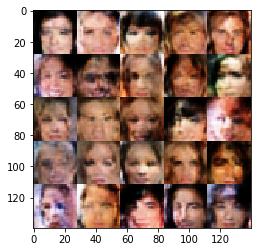

Epoch 1/1... Discriminator Loss: 0.4915... Generator Loss: 3.9289
Epoch 1/1... Discriminator Loss: 0.9335... Generator Loss: 3.1652
Epoch 1/1... Discriminator Loss: 0.4768... Generator Loss: 2.4689
Epoch 1/1... Discriminator Loss: 0.4384... Generator Loss: 2.9756
Epoch 1/1... Discriminator Loss: 0.4779... Generator Loss: 2.1510
Epoch 1/1... Discriminator Loss: 0.3789... Generator Loss: 3.4332
Epoch 1/1... Discriminator Loss: 0.4255... Generator Loss: 3.1469
Epoch 1/1... Discriminator Loss: 0.6253... Generator Loss: 1.8275
Epoch 1/1... Discriminator Loss: 0.4589... Generator Loss: 2.7352
Epoch 1/1... Discriminator Loss: 0.4018... Generator Loss: 3.2333


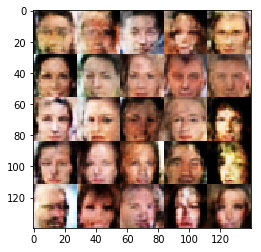

Epoch 1/1... Discriminator Loss: 0.4959... Generator Loss: 4.4833
Epoch 1/1... Discriminator Loss: 0.3837... Generator Loss: 3.3625
Epoch 1/1... Discriminator Loss: 0.9223... Generator Loss: 5.2431
Epoch 1/1... Discriminator Loss: 0.7760... Generator Loss: 1.2306
Epoch 1/1... Discriminator Loss: 0.3480... Generator Loss: 4.9232
Epoch 1/1... Discriminator Loss: 0.4105... Generator Loss: 3.0684
Epoch 1/1... Discriminator Loss: 0.4122... Generator Loss: 2.9635
Epoch 1/1... Discriminator Loss: 0.4388... Generator Loss: 4.6297
Epoch 1/1... Discriminator Loss: 0.8065... Generator Loss: 1.1413
Epoch 1/1... Discriminator Loss: 0.4089... Generator Loss: 3.1677


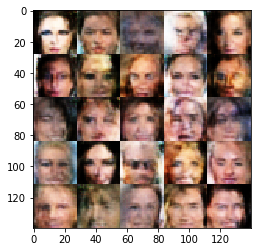

Epoch 1/1... Discriminator Loss: 0.3941... Generator Loss: 3.0415
Epoch 1/1... Discriminator Loss: 1.4427... Generator Loss: 0.5129
Epoch 1/1... Discriminator Loss: 0.3741... Generator Loss: 4.2742
Epoch 1/1... Discriminator Loss: 0.5449... Generator Loss: 1.7284
Epoch 1/1... Discriminator Loss: 0.3997... Generator Loss: 3.0432
Epoch 1/1... Discriminator Loss: 0.4908... Generator Loss: 2.4484
Epoch 1/1... Discriminator Loss: 1.2552... Generator Loss: 0.7047
Epoch 1/1... Discriminator Loss: 0.4297... Generator Loss: 3.1249
Epoch 1/1... Discriminator Loss: 0.4696... Generator Loss: 3.3106
Epoch 1/1... Discriminator Loss: 0.4043... Generator Loss: 2.9911


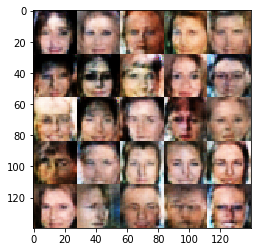

Epoch 1/1... Discriminator Loss: 0.3621... Generator Loss: 4.2235
Epoch 1/1... Discriminator Loss: 0.5043... Generator Loss: 2.3266
Epoch 1/1... Discriminator Loss: 0.3962... Generator Loss: 3.0201
Epoch 1/1... Discriminator Loss: 0.4536... Generator Loss: 3.1354
Epoch 1/1... Discriminator Loss: 0.4476... Generator Loss: 2.4906
Epoch 1/1... Discriminator Loss: 0.3603... Generator Loss: 3.8533
Epoch 1/1... Discriminator Loss: 0.5985... Generator Loss: 3.9467
Epoch 1/1... Discriminator Loss: 0.3841... Generator Loss: 3.5792
Epoch 1/1... Discriminator Loss: 0.8547... Generator Loss: 3.5672
Epoch 1/1... Discriminator Loss: 0.3704... Generator Loss: 4.1906


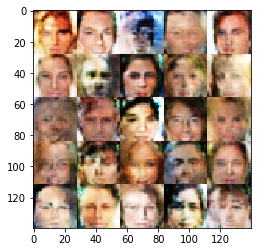

Epoch 1/1... Discriminator Loss: 0.3612... Generator Loss: 3.7428
Epoch 1/1... Discriminator Loss: 0.3690... Generator Loss: 4.2202
Epoch 1/1... Discriminator Loss: 0.3621... Generator Loss: 3.7152
Epoch 1/1... Discriminator Loss: 0.4489... Generator Loss: 2.7953
Epoch 1/1... Discriminator Loss: 0.3905... Generator Loss: 3.9462
Epoch 1/1... Discriminator Loss: 1.0186... Generator Loss: 2.5910
Epoch 1/1... Discriminator Loss: 0.5995... Generator Loss: 3.4333
Epoch 1/1... Discriminator Loss: 0.4360... Generator Loss: 2.8533
Epoch 1/1... Discriminator Loss: 1.8202... Generator Loss: 0.3143
Epoch 1/1... Discriminator Loss: 0.7272... Generator Loss: 1.3739


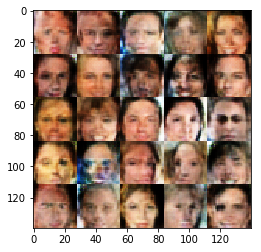

Epoch 1/1... Discriminator Loss: 0.7048... Generator Loss: 1.3334
Epoch 1/1... Discriminator Loss: 0.4532... Generator Loss: 2.4703
Epoch 1/1... Discriminator Loss: 0.4209... Generator Loss: 2.7102
Epoch 1/1... Discriminator Loss: 0.5715... Generator Loss: 1.6676
Epoch 1/1... Discriminator Loss: 0.5010... Generator Loss: 2.4519
Epoch 1/1... Discriminator Loss: 0.3727... Generator Loss: 3.6147
Epoch 1/1... Discriminator Loss: 0.4284... Generator Loss: 2.5516
Epoch 1/1... Discriminator Loss: 0.3465... Generator Loss: 4.6210
Epoch 1/1... Discriminator Loss: 0.7469... Generator Loss: 3.1907
Epoch 1/1... Discriminator Loss: 0.3517... Generator Loss: 4.9599


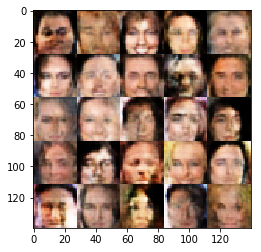

Epoch 1/1... Discriminator Loss: 0.5361... Generator Loss: 1.8107
Epoch 1/1... Discriminator Loss: 0.4903... Generator Loss: 3.9985
Epoch 1/1... Discriminator Loss: 0.3881... Generator Loss: 3.3249
Epoch 1/1... Discriminator Loss: 1.2225... Generator Loss: 0.7129
Epoch 1/1... Discriminator Loss: 0.5991... Generator Loss: 3.7267
Epoch 1/1... Discriminator Loss: 1.2021... Generator Loss: 0.7035
Epoch 1/1... Discriminator Loss: 1.0244... Generator Loss: 0.8779
Epoch 1/1... Discriminator Loss: 0.5909... Generator Loss: 1.7037
Epoch 1/1... Discriminator Loss: 0.6831... Generator Loss: 1.4308
Epoch 1/1... Discriminator Loss: 0.7240... Generator Loss: 2.9756


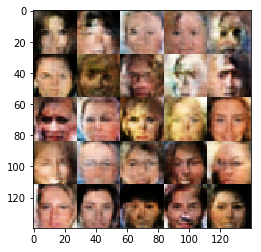

Epoch 1/1... Discriminator Loss: 0.4974... Generator Loss: 2.1061
Epoch 1/1... Discriminator Loss: 0.4086... Generator Loss: 4.2279
Epoch 1/1... Discriminator Loss: 0.4444... Generator Loss: 2.4384
Epoch 1/1... Discriminator Loss: 0.5613... Generator Loss: 1.8765
Epoch 1/1... Discriminator Loss: 0.4197... Generator Loss: 3.0016
Epoch 1/1... Discriminator Loss: 0.5984... Generator Loss: 1.7092
Epoch 1/1... Discriminator Loss: 0.4928... Generator Loss: 2.3218
Epoch 1/1... Discriminator Loss: 0.5409... Generator Loss: 3.4253
Epoch 1/1... Discriminator Loss: 0.4183... Generator Loss: 4.6256
Epoch 1/1... Discriminator Loss: 0.3835... Generator Loss: 4.3040


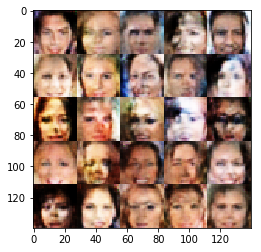

Epoch 1/1... Discriminator Loss: 1.1740... Generator Loss: 4.6347
Epoch 1/1... Discriminator Loss: 0.3984... Generator Loss: 2.9843
Epoch 1/1... Discriminator Loss: 0.4061... Generator Loss: 3.4197
Epoch 1/1... Discriminator Loss: 0.5592... Generator Loss: 3.4097
Epoch 1/1... Discriminator Loss: 0.4311... Generator Loss: 2.6118
Epoch 1/1... Discriminator Loss: 0.4218... Generator Loss: 4.6610
Epoch 1/1... Discriminator Loss: 0.4754... Generator Loss: 2.9009
Epoch 1/1... Discriminator Loss: 0.4298... Generator Loss: 3.0029
Epoch 1/1... Discriminator Loss: 0.3657... Generator Loss: 3.8029
Epoch 1/1... Discriminator Loss: 0.4234... Generator Loss: 3.2565


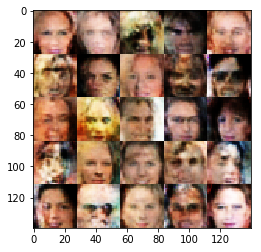

Epoch 1/1... Discriminator Loss: 0.3978... Generator Loss: 3.6538
Epoch 1/1... Discriminator Loss: 0.4407... Generator Loss: 3.2628
Epoch 1/1... Discriminator Loss: 0.7459... Generator Loss: 1.2439
Epoch 1/1... Discriminator Loss: 0.4595... Generator Loss: 2.4702
Epoch 1/1... Discriminator Loss: 0.6252... Generator Loss: 3.3371
Epoch 1/1... Discriminator Loss: 0.5139... Generator Loss: 3.4788
Epoch 1/1... Discriminator Loss: 0.4536... Generator Loss: 3.6756
Epoch 1/1... Discriminator Loss: 0.4202... Generator Loss: 3.4178
Epoch 1/1... Discriminator Loss: 0.3852... Generator Loss: 3.3522
Epoch 1/1... Discriminator Loss: 0.5024... Generator Loss: 1.9824


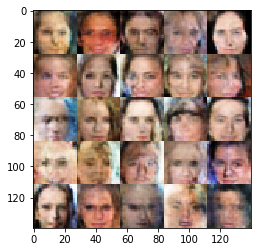

Epoch 1/1... Discriminator Loss: 0.4203... Generator Loss: 3.7592
Epoch 1/1... Discriminator Loss: 1.0805... Generator Loss: 2.2102
Epoch 1/1... Discriminator Loss: 0.4079... Generator Loss: 2.9318
Epoch 1/1... Discriminator Loss: 0.4939... Generator Loss: 2.5274
Epoch 1/1... Discriminator Loss: 0.3954... Generator Loss: 3.0727
Epoch 1/1... Discriminator Loss: 0.9450... Generator Loss: 1.0363
Epoch 1/1... Discriminator Loss: 0.6713... Generator Loss: 4.0058
Epoch 1/1... Discriminator Loss: 0.4357... Generator Loss: 2.6683
Epoch 1/1... Discriminator Loss: 0.4094... Generator Loss: 2.8357
Epoch 1/1... Discriminator Loss: 1.0731... Generator Loss: 3.8268


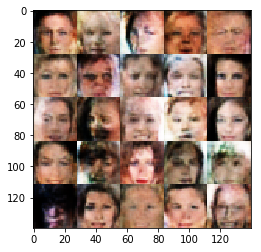

Epoch 1/1... Discriminator Loss: 0.4082... Generator Loss: 2.9925
Epoch 1/1... Discriminator Loss: 0.4927... Generator Loss: 2.1767
Epoch 1/1... Discriminator Loss: 0.4161... Generator Loss: 2.7509
Epoch 1/1... Discriminator Loss: 0.4431... Generator Loss: 2.4550
Epoch 1/1... Discriminator Loss: 0.3793... Generator Loss: 3.2145
Epoch 1/1... Discriminator Loss: 1.6056... Generator Loss: 0.3881
Epoch 1/1... Discriminator Loss: 0.4648... Generator Loss: 2.7280
Epoch 1/1... Discriminator Loss: 0.4188... Generator Loss: 3.3123
Epoch 1/1... Discriminator Loss: 0.4746... Generator Loss: 2.4867
Epoch 1/1... Discriminator Loss: 0.4286... Generator Loss: 3.0552


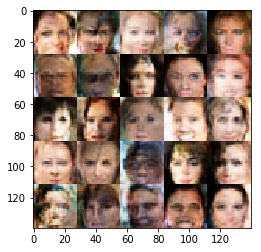

Epoch 1/1... Discriminator Loss: 0.3998... Generator Loss: 3.6487
Epoch 1/1... Discriminator Loss: 0.3654... Generator Loss: 4.3897
Epoch 1/1... Discriminator Loss: 1.5304... Generator Loss: 2.9198
Epoch 1/1... Discriminator Loss: 0.5773... Generator Loss: 1.7964
Epoch 1/1... Discriminator Loss: 0.3937... Generator Loss: 3.1450
Epoch 1/1... Discriminator Loss: 0.4142... Generator Loss: 3.7944
Epoch 1/1... Discriminator Loss: 0.4092... Generator Loss: 2.9808
Epoch 1/1... Discriminator Loss: 0.6836... Generator Loss: 5.8738
Epoch 1/1... Discriminator Loss: 0.4162... Generator Loss: 2.8419
Epoch 1/1... Discriminator Loss: 1.1458... Generator Loss: 0.7726


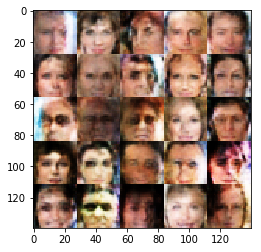

Epoch 1/1... Discriminator Loss: 0.4299... Generator Loss: 2.8202
Epoch 1/1... Discriminator Loss: 0.4459... Generator Loss: 2.6916
Epoch 1/1... Discriminator Loss: 0.9982... Generator Loss: 0.8995
Epoch 1/1... Discriminator Loss: 0.3621... Generator Loss: 3.5808
Epoch 1/1... Discriminator Loss: 0.3603... Generator Loss: 4.5212
Epoch 1/1... Discriminator Loss: 0.5028... Generator Loss: 2.4764
Epoch 1/1... Discriminator Loss: 0.4076... Generator Loss: 3.1307
Epoch 1/1... Discriminator Loss: 0.4778... Generator Loss: 2.9257
Epoch 1/1... Discriminator Loss: 0.3744... Generator Loss: 3.3118
Epoch 1/1... Discriminator Loss: 0.5623... Generator Loss: 1.7470


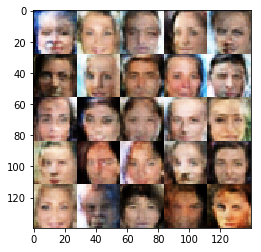

Epoch 1/1... Discriminator Loss: 1.4928... Generator Loss: 5.5082
Epoch 1/1... Discriminator Loss: 0.5042... Generator Loss: 2.0806
Epoch 1/1... Discriminator Loss: 0.9436... Generator Loss: 3.3601
Epoch 1/1... Discriminator Loss: 0.5512... Generator Loss: 4.2995
Epoch 1/1... Discriminator Loss: 0.3512... Generator Loss: 4.4946
Epoch 1/1... Discriminator Loss: 0.3915... Generator Loss: 5.2308
Epoch 1/1... Discriminator Loss: 0.4847... Generator Loss: 3.0540
Epoch 1/1... Discriminator Loss: 0.8100... Generator Loss: 4.3745
Epoch 1/1... Discriminator Loss: 0.5274... Generator Loss: 1.9151
Epoch 1/1... Discriminator Loss: 0.3908... Generator Loss: 3.1853


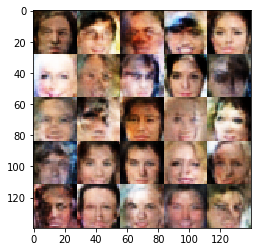

Epoch 1/1... Discriminator Loss: 0.7453... Generator Loss: 1.4673
Epoch 1/1... Discriminator Loss: 0.5604... Generator Loss: 1.9644
Epoch 1/1... Discriminator Loss: 0.6441... Generator Loss: 1.5346
Epoch 1/1... Discriminator Loss: 0.3982... Generator Loss: 3.0153
Epoch 1/1... Discriminator Loss: 0.4643... Generator Loss: 2.3439
Epoch 1/1... Discriminator Loss: 0.4350... Generator Loss: 3.9953
Epoch 1/1... Discriminator Loss: 0.4719... Generator Loss: 4.9319
Epoch 1/1... Discriminator Loss: 1.9462... Generator Loss: 4.5099
Epoch 1/1... Discriminator Loss: 0.4383... Generator Loss: 3.1569
Epoch 1/1... Discriminator Loss: 0.4293... Generator Loss: 2.5806


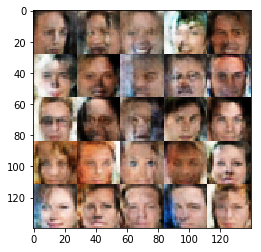

Epoch 1/1... Discriminator Loss: 0.4388... Generator Loss: 2.5373
Epoch 1/1... Discriminator Loss: 0.3824... Generator Loss: 3.4688
Epoch 1/1... Discriminator Loss: 0.6660... Generator Loss: 1.5354
Epoch 1/1... Discriminator Loss: 0.4964... Generator Loss: 2.1758
Epoch 1/1... Discriminator Loss: 0.4046... Generator Loss: 3.3005
Epoch 1/1... Discriminator Loss: 0.6337... Generator Loss: 1.4787
Epoch 1/1... Discriminator Loss: 1.4392... Generator Loss: 0.5786
Epoch 1/1... Discriminator Loss: 0.4538... Generator Loss: 3.3400
Epoch 1/1... Discriminator Loss: 0.4324... Generator Loss: 2.5848
Epoch 1/1... Discriminator Loss: 0.5626... Generator Loss: 2.6196


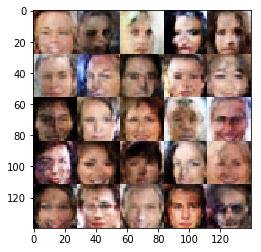

Epoch 1/1... Discriminator Loss: 0.4143... Generator Loss: 2.9061
Epoch 1/1... Discriminator Loss: 0.3916... Generator Loss: 3.3309
Epoch 1/1... Discriminator Loss: 0.4046... Generator Loss: 3.0811
Epoch 1/1... Discriminator Loss: 0.5513... Generator Loss: 1.8107
Epoch 1/1... Discriminator Loss: 1.2623... Generator Loss: 4.8194
Epoch 1/1... Discriminator Loss: 0.5909... Generator Loss: 1.6853
Epoch 1/1... Discriminator Loss: 0.4520... Generator Loss: 2.3915
Epoch 1/1... Discriminator Loss: 0.4149... Generator Loss: 2.9021
Epoch 1/1... Discriminator Loss: 0.3937... Generator Loss: 3.1716
Epoch 1/1... Discriminator Loss: 0.8057... Generator Loss: 1.1192


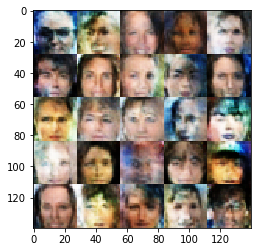

Epoch 1/1... Discriminator Loss: 0.5378... Generator Loss: 3.3589
Epoch 1/1... Discriminator Loss: 0.4249... Generator Loss: 3.0265
Epoch 1/1... Discriminator Loss: 0.4111... Generator Loss: 3.6941
Epoch 1/1... Discriminator Loss: 0.9342... Generator Loss: 5.0759
Epoch 1/1... Discriminator Loss: 0.3815... Generator Loss: 3.6236
Epoch 1/1... Discriminator Loss: 0.4274... Generator Loss: 4.5462
Epoch 1/1... Discriminator Loss: 0.5805... Generator Loss: 5.1875
Epoch 1/1... Discriminator Loss: 0.3757... Generator Loss: 5.4295
Epoch 1/1... Discriminator Loss: 0.4343... Generator Loss: 2.5637
Epoch 1/1... Discriminator Loss: 0.3558... Generator Loss: 3.9481


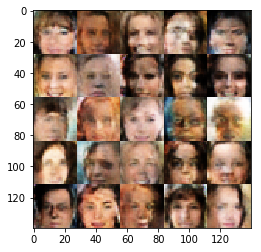

Epoch 1/1... Discriminator Loss: 1.0861... Generator Loss: 6.4009
Epoch 1/1... Discriminator Loss: 0.3885... Generator Loss: 3.0840
Epoch 1/1... Discriminator Loss: 1.9702... Generator Loss: 0.2973
Epoch 1/1... Discriminator Loss: 0.3947... Generator Loss: 3.1500
Epoch 1/1... Discriminator Loss: 0.5670... Generator Loss: 2.1633
Epoch 1/1... Discriminator Loss: 0.4386... Generator Loss: 2.6815
Epoch 1/1... Discriminator Loss: 0.6845... Generator Loss: 1.3104
Epoch 1/1... Discriminator Loss: 0.8745... Generator Loss: 1.2134
Epoch 1/1... Discriminator Loss: 0.5124... Generator Loss: 2.7626
Epoch 1/1... Discriminator Loss: 0.3804... Generator Loss: 5.4362


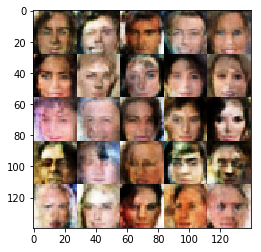

Epoch 1/1... Discriminator Loss: 0.6037... Generator Loss: 5.0345
Epoch 1/1... Discriminator Loss: 0.6131... Generator Loss: 1.7154
Epoch 1/1... Discriminator Loss: 0.3517... Generator Loss: 4.5363
Epoch 1/1... Discriminator Loss: 0.3825... Generator Loss: 4.4543
Epoch 1/1... Discriminator Loss: 0.6174... Generator Loss: 1.5924
Epoch 1/1... Discriminator Loss: 0.3584... Generator Loss: 4.2203
Epoch 1/1... Discriminator Loss: 0.3810... Generator Loss: 3.4418
Epoch 1/1... Discriminator Loss: 0.3876... Generator Loss: 3.0723
Epoch 1/1... Discriminator Loss: 0.3623... Generator Loss: 4.1926
Epoch 1/1... Discriminator Loss: 0.4941... Generator Loss: 3.7226


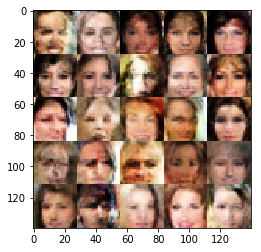

Epoch 1/1... Discriminator Loss: 0.3870... Generator Loss: 3.8371
Epoch 1/1... Discriminator Loss: 0.3648... Generator Loss: 3.8376
Epoch 1/1... Discriminator Loss: 0.5249... Generator Loss: 2.7777
Epoch 1/1... Discriminator Loss: 0.4158... Generator Loss: 3.2754
Epoch 1/1... Discriminator Loss: 2.3269... Generator Loss: 4.2094
Epoch 1/1... Discriminator Loss: 0.7860... Generator Loss: 1.2238
Epoch 1/1... Discriminator Loss: 0.3813... Generator Loss: 3.4374
Epoch 1/1... Discriminator Loss: 0.6028... Generator Loss: 1.6508
Epoch 1/1... Discriminator Loss: 0.8596... Generator Loss: 1.1657
Epoch 1/1... Discriminator Loss: 0.8957... Generator Loss: 1.0651


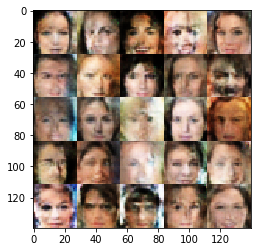

Epoch 1/1... Discriminator Loss: 0.4807... Generator Loss: 2.3113
Epoch 1/1... Discriminator Loss: 0.7298... Generator Loss: 3.7388
Epoch 1/1... Discriminator Loss: 0.5535... Generator Loss: 1.8091
Epoch 1/1... Discriminator Loss: 0.6180... Generator Loss: 2.6008
Epoch 1/1... Discriminator Loss: 0.4298... Generator Loss: 2.8112
Epoch 1/1... Discriminator Loss: 0.3894... Generator Loss: 3.4375
Epoch 1/1... Discriminator Loss: 0.4012... Generator Loss: 3.0382
Epoch 1/1... Discriminator Loss: 0.5108... Generator Loss: 2.5048
Epoch 1/1... Discriminator Loss: 0.4391... Generator Loss: 3.5683
Epoch 1/1... Discriminator Loss: 1.0833... Generator Loss: 0.9702


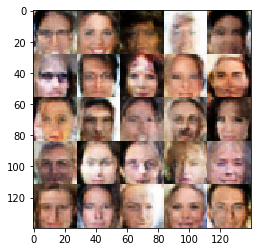

Epoch 1/1... Discriminator Loss: 0.4320... Generator Loss: 2.6274
Epoch 1/1... Discriminator Loss: 0.4145... Generator Loss: 5.0896
Epoch 1/1... Discriminator Loss: 0.4135... Generator Loss: 3.2986
Epoch 1/1... Discriminator Loss: 1.9099... Generator Loss: 0.3204
Epoch 1/1... Discriminator Loss: 0.5685... Generator Loss: 3.1008
Epoch 1/1... Discriminator Loss: 0.7552... Generator Loss: 3.6558
Epoch 1/1... Discriminator Loss: 0.7423... Generator Loss: 4.5333
Epoch 1/1... Discriminator Loss: 0.5554... Generator Loss: 1.8342
Epoch 1/1... Discriminator Loss: 0.4089... Generator Loss: 4.1125
Epoch 1/1... Discriminator Loss: 0.5622... Generator Loss: 2.3644


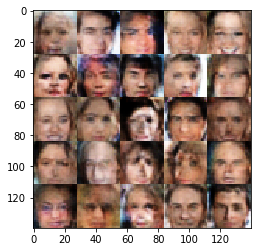

Epoch 1/1... Discriminator Loss: 1.6640... Generator Loss: 3.2939
Epoch 1/1... Discriminator Loss: 0.4245... Generator Loss: 4.1072
Epoch 1/1... Discriminator Loss: 0.4207... Generator Loss: 2.9571
Epoch 1/1... Discriminator Loss: 0.4173... Generator Loss: 2.6387
Epoch 1/1... Discriminator Loss: 3.2004... Generator Loss: 0.0913
Epoch 1/1... Discriminator Loss: 1.5033... Generator Loss: 0.4929
Epoch 1/1... Discriminator Loss: 0.7570... Generator Loss: 1.1631
Epoch 1/1... Discriminator Loss: 0.7360... Generator Loss: 1.2155
Epoch 1/1... Discriminator Loss: 0.5614... Generator Loss: 4.1259
Epoch 1/1... Discriminator Loss: 1.0712... Generator Loss: 0.8440


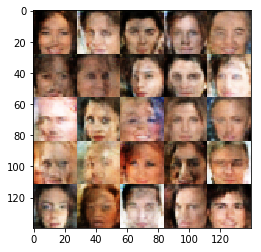

Epoch 1/1... Discriminator Loss: 0.6186... Generator Loss: 1.5877
Epoch 1/1... Discriminator Loss: 0.3978... Generator Loss: 3.1306
Epoch 1/1... Discriminator Loss: 0.3922... Generator Loss: 3.4731
Epoch 1/1... Discriminator Loss: 0.7603... Generator Loss: 1.2691
Epoch 1/1... Discriminator Loss: 0.4812... Generator Loss: 2.3369
Epoch 1/1... Discriminator Loss: 0.8435... Generator Loss: 3.7649
Epoch 1/1... Discriminator Loss: 0.4228... Generator Loss: 3.1334
Epoch 1/1... Discriminator Loss: 0.4561... Generator Loss: 4.5125
Epoch 1/1... Discriminator Loss: 0.3808... Generator Loss: 3.5553
Epoch 1/1... Discriminator Loss: 0.4019... Generator Loss: 3.1049


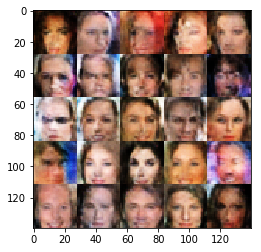

Epoch 1/1... Discriminator Loss: 0.4124... Generator Loss: 2.8227
Epoch 1/1... Discriminator Loss: 0.4728... Generator Loss: 5.2295
Epoch 1/1... Discriminator Loss: 0.7784... Generator Loss: 1.2452
Epoch 1/1... Discriminator Loss: 0.3838... Generator Loss: 3.6079
Epoch 1/1... Discriminator Loss: 0.3998... Generator Loss: 3.5580
Epoch 1/1... Discriminator Loss: 0.5521... Generator Loss: 1.8208
Epoch 1/1... Discriminator Loss: 0.6086... Generator Loss: 1.7315
Epoch 1/1... Discriminator Loss: 0.3695... Generator Loss: 4.5225
Epoch 1/1... Discriminator Loss: 0.4156... Generator Loss: 3.5701
Epoch 1/1... Discriminator Loss: 0.5497... Generator Loss: 1.9063


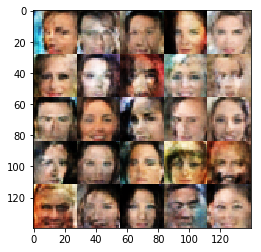

Epoch 1/1... Discriminator Loss: 1.5934... Generator Loss: 0.5196
Epoch 1/1... Discriminator Loss: 0.4785... Generator Loss: 2.6227
Epoch 1/1... Discriminator Loss: 0.3903... Generator Loss: 3.2590
Epoch 1/1... Discriminator Loss: 1.2072... Generator Loss: 4.1928
Epoch 1/1... Discriminator Loss: 0.3615... Generator Loss: 4.0414
Epoch 1/1... Discriminator Loss: 0.4320... Generator Loss: 3.7621
Epoch 1/1... Discriminator Loss: 0.4573... Generator Loss: 2.7027
Epoch 1/1... Discriminator Loss: 0.4533... Generator Loss: 3.0025
Epoch 1/1... Discriminator Loss: 0.3714... Generator Loss: 4.5327
Epoch 1/1... Discriminator Loss: 0.4126... Generator Loss: 3.2286


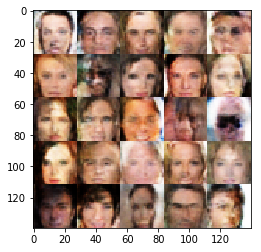

Epoch 1/1... Discriminator Loss: 1.3577... Generator Loss: 0.6567
Epoch 1/1... Discriminator Loss: 0.4895... Generator Loss: 4.0849
Epoch 1/1... Discriminator Loss: 0.5533... Generator Loss: 2.5449
Epoch 1/1... Discriminator Loss: 0.5705... Generator Loss: 4.1291
Epoch 1/1... Discriminator Loss: 0.4397... Generator Loss: 2.4892
Epoch 1/1... Discriminator Loss: 0.3720... Generator Loss: 3.9272
Epoch 1/1... Discriminator Loss: 0.7363... Generator Loss: 1.3600
Epoch 1/1... Discriminator Loss: 0.5283... Generator Loss: 3.3801
Epoch 1/1... Discriminator Loss: 0.4711... Generator Loss: 4.2006
Epoch 1/1... Discriminator Loss: 0.4262... Generator Loss: 3.2728


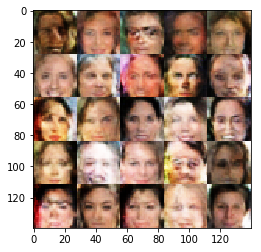

Epoch 1/1... Discriminator Loss: 0.4713... Generator Loss: 3.8914
Epoch 1/1... Discriminator Loss: 0.3670... Generator Loss: 3.6667
Epoch 1/1... Discriminator Loss: 0.4050... Generator Loss: 3.8194
Epoch 1/1... Discriminator Loss: 0.6997... Generator Loss: 5.5736
Epoch 1/1... Discriminator Loss: 0.9591... Generator Loss: 1.1305
Epoch 1/1... Discriminator Loss: 0.5380... Generator Loss: 1.9974
Epoch 1/1... Discriminator Loss: 0.3790... Generator Loss: 3.8553
Epoch 1/1... Discriminator Loss: 0.5803... Generator Loss: 2.7737
Epoch 1/1... Discriminator Loss: 0.8184... Generator Loss: 1.2067
Epoch 1/1... Discriminator Loss: 0.4879... Generator Loss: 2.2121


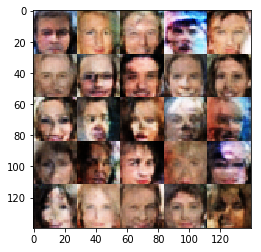

Epoch 1/1... Discriminator Loss: 0.4009... Generator Loss: 2.9701
Epoch 1/1... Discriminator Loss: 0.3560... Generator Loss: 4.6406
Epoch 1/1... Discriminator Loss: 0.9204... Generator Loss: 1.1200
Epoch 1/1... Discriminator Loss: 0.5408... Generator Loss: 2.0669
Epoch 1/1... Discriminator Loss: 0.6803... Generator Loss: 1.5622
Epoch 1/1... Discriminator Loss: 0.7568... Generator Loss: 1.4485
Epoch 1/1... Discriminator Loss: 0.4234... Generator Loss: 2.5178
Epoch 1/1... Discriminator Loss: 0.6872... Generator Loss: 1.7748
Epoch 1/1... Discriminator Loss: 0.3584... Generator Loss: 4.0960
Epoch 1/1... Discriminator Loss: 0.6033... Generator Loss: 1.9205


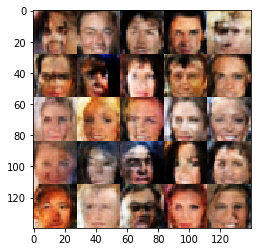

Epoch 1/1... Discriminator Loss: 0.5572... Generator Loss: 3.6175
Epoch 1/1... Discriminator Loss: 0.4265... Generator Loss: 2.8830
Epoch 1/1... Discriminator Loss: 0.4435... Generator Loss: 2.7141
Epoch 1/1... Discriminator Loss: 0.4362... Generator Loss: 3.9621
Epoch 1/1... Discriminator Loss: 0.3883... Generator Loss: 3.6524
Epoch 1/1... Discriminator Loss: 0.3732... Generator Loss: 3.8400
Epoch 1/1... Discriminator Loss: 2.2798... Generator Loss: 4.3058
Epoch 1/1... Discriminator Loss: 2.1375... Generator Loss: 3.9568
Epoch 1/1... Discriminator Loss: 0.4777... Generator Loss: 2.8189
Epoch 1/1... Discriminator Loss: 0.7651... Generator Loss: 1.2681


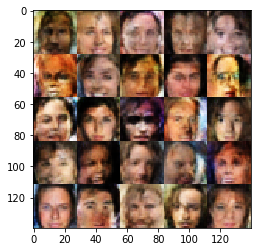

Epoch 1/1... Discriminator Loss: 1.6469... Generator Loss: 0.3884
Epoch 1/1... Discriminator Loss: 0.4070... Generator Loss: 3.3010
Epoch 1/1... Discriminator Loss: 0.3661... Generator Loss: 3.7687
Epoch 1/1... Discriminator Loss: 0.5066... Generator Loss: 2.0392
Epoch 1/1... Discriminator Loss: 0.4658... Generator Loss: 2.5982
Epoch 1/1... Discriminator Loss: 0.4438... Generator Loss: 3.5540
Epoch 1/1... Discriminator Loss: 0.3948... Generator Loss: 3.0764
Epoch 1/1... Discriminator Loss: 0.6058... Generator Loss: 1.6112
Epoch 1/1... Discriminator Loss: 0.4746... Generator Loss: 2.4830
Epoch 1/1... Discriminator Loss: 0.4715... Generator Loss: 2.2709


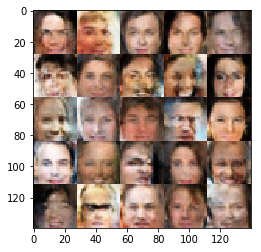

Epoch 1/1... Discriminator Loss: 0.3729... Generator Loss: 4.2091
Epoch 1/1... Discriminator Loss: 0.9405... Generator Loss: 3.8121
Epoch 1/1... Discriminator Loss: 0.3734... Generator Loss: 4.3824
Epoch 1/1... Discriminator Loss: 0.3788... Generator Loss: 3.5451
Epoch 1/1... Discriminator Loss: 0.6259... Generator Loss: 1.8948
Epoch 1/1... Discriminator Loss: 0.3691... Generator Loss: 3.7883
Epoch 1/1... Discriminator Loss: 0.7189... Generator Loss: 1.8625
Epoch 1/1... Discriminator Loss: 0.4342... Generator Loss: 2.9816
Epoch 1/1... Discriminator Loss: 0.3981... Generator Loss: 4.0531
Epoch 1/1... Discriminator Loss: 0.4039... Generator Loss: 2.8840


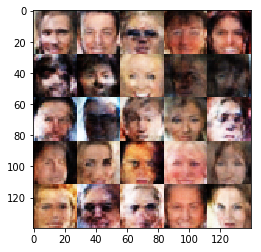

Epoch 1/1... Discriminator Loss: 0.8080... Generator Loss: 1.1735
Epoch 1/1... Discriminator Loss: 0.4555... Generator Loss: 2.4373
Epoch 1/1... Discriminator Loss: 0.3703... Generator Loss: 4.5236
Epoch 1/1... Discriminator Loss: 0.5423... Generator Loss: 2.1165
Epoch 1/1... Discriminator Loss: 0.3821... Generator Loss: 5.8058
Epoch 1/1... Discriminator Loss: 0.3865... Generator Loss: 4.4437
Epoch 1/1... Discriminator Loss: 0.3724... Generator Loss: 3.5579
Epoch 1/1... Discriminator Loss: 2.6289... Generator Loss: 0.1756
Epoch 1/1... Discriminator Loss: 0.4133... Generator Loss: 2.9861
Epoch 1/1... Discriminator Loss: 0.5834... Generator Loss: 3.9184


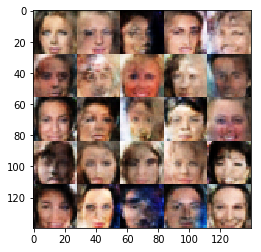

Epoch 1/1... Discriminator Loss: 0.4406... Generator Loss: 2.6333
Epoch 1/1... Discriminator Loss: 0.3757... Generator Loss: 3.7784
Epoch 1/1... Discriminator Loss: 0.4111... Generator Loss: 3.2301
Epoch 1/1... Discriminator Loss: 0.5298... Generator Loss: 2.2623
Epoch 1/1... Discriminator Loss: 1.9782... Generator Loss: 0.4202
Epoch 1/1... Discriminator Loss: 0.4814... Generator Loss: 2.2438
Epoch 1/1... Discriminator Loss: 0.4740... Generator Loss: 2.4866
Epoch 1/1... Discriminator Loss: 0.6799... Generator Loss: 2.7269
Epoch 1/1... Discriminator Loss: 0.5659... Generator Loss: 1.9925
Epoch 1/1... Discriminator Loss: 0.3968... Generator Loss: 3.0838


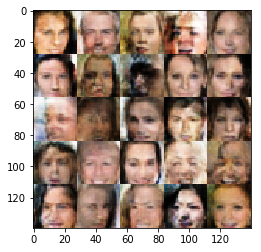

Epoch 1/1... Discriminator Loss: 0.5510... Generator Loss: 2.1404
Epoch 1/1... Discriminator Loss: 0.3964... Generator Loss: 2.9275
Epoch 1/1... Discriminator Loss: 0.4023... Generator Loss: 3.2151
Epoch 1/1... Discriminator Loss: 0.4473... Generator Loss: 2.4629
Epoch 1/1... Discriminator Loss: 0.3670... Generator Loss: 4.6771
Epoch 1/1... Discriminator Loss: 0.4001... Generator Loss: 3.2709
Epoch 1/1... Discriminator Loss: 0.7220... Generator Loss: 1.6842
Epoch 1/1... Discriminator Loss: 0.3666... Generator Loss: 3.6987
Epoch 1/1... Discriminator Loss: 0.4612... Generator Loss: 2.2161
Epoch 1/1... Discriminator Loss: 2.8883... Generator Loss: 0.1335


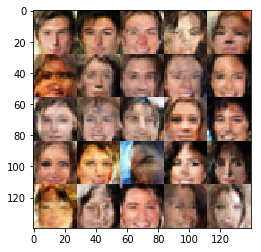

Epoch 1/1... Discriminator Loss: 0.4699... Generator Loss: 2.6283
Epoch 1/1... Discriminator Loss: 0.3748... Generator Loss: 4.0419
Epoch 1/1... Discriminator Loss: 0.3761... Generator Loss: 3.7605
Epoch 1/1... Discriminator Loss: 0.4990... Generator Loss: 2.1590
Epoch 1/1... Discriminator Loss: 0.5026... Generator Loss: 4.1953
Epoch 1/1... Discriminator Loss: 0.6968... Generator Loss: 4.2216
Epoch 1/1... Discriminator Loss: 0.4561... Generator Loss: 2.8035
Epoch 1/1... Discriminator Loss: 0.3648... Generator Loss: 3.9226
Epoch 1/1... Discriminator Loss: 0.6675... Generator Loss: 1.4647
Epoch 1/1... Discriminator Loss: 0.4069... Generator Loss: 2.8525


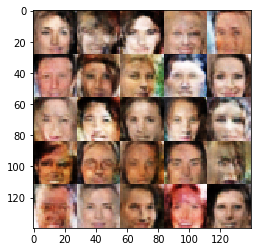

Epoch 1/1... Discriminator Loss: 0.4244... Generator Loss: 2.8594
Epoch 1/1... Discriminator Loss: 0.4191... Generator Loss: 2.6899
Epoch 1/1... Discriminator Loss: 0.3626... Generator Loss: 4.4010
Epoch 1/1... Discriminator Loss: 0.6257... Generator Loss: 1.8961
Epoch 1/1... Discriminator Loss: 0.6142... Generator Loss: 5.8516
Epoch 1/1... Discriminator Loss: 0.3783... Generator Loss: 3.9597
Epoch 1/1... Discriminator Loss: 0.3941... Generator Loss: 3.0231
Epoch 1/1... Discriminator Loss: 0.3537... Generator Loss: 4.3765
Epoch 1/1... Discriminator Loss: 0.3624... Generator Loss: 4.3971
Epoch 1/1... Discriminator Loss: 0.3955... Generator Loss: 3.3634


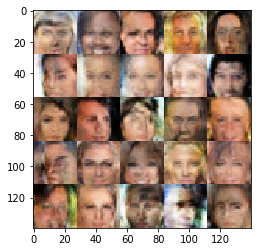

Epoch 1/1... Discriminator Loss: 0.4651... Generator Loss: 2.6216
Epoch 1/1... Discriminator Loss: 0.4268... Generator Loss: 2.8488
Epoch 1/1... Discriminator Loss: 0.4240... Generator Loss: 3.6449
Epoch 1/1... Discriminator Loss: 0.4181... Generator Loss: 2.9049
Epoch 1/1... Discriminator Loss: 0.8558... Generator Loss: 1.8817
Epoch 1/1... Discriminator Loss: 1.4221... Generator Loss: 0.4979
Epoch 1/1... Discriminator Loss: 0.4109... Generator Loss: 3.0903
Epoch 1/1... Discriminator Loss: 0.5979... Generator Loss: 1.7035
Epoch 1/1... Discriminator Loss: 1.2743... Generator Loss: 5.1553
Epoch 1/1... Discriminator Loss: 0.4652... Generator Loss: 2.5438


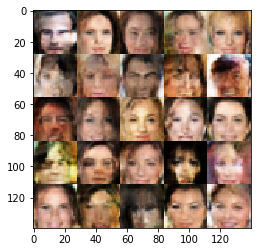

Epoch 1/1... Discriminator Loss: 1.0033... Generator Loss: 0.9036
Epoch 1/1... Discriminator Loss: 0.4075... Generator Loss: 3.1408
Epoch 1/1... Discriminator Loss: 0.4357... Generator Loss: 2.5919
Epoch 1/1... Discriminator Loss: 0.4729... Generator Loss: 2.2456
Epoch 1/1... Discriminator Loss: 0.4014... Generator Loss: 3.0313
Epoch 1/1... Discriminator Loss: 0.4334... Generator Loss: 3.8082
Epoch 1/1... Discriminator Loss: 0.3590... Generator Loss: 4.7207
Epoch 1/1... Discriminator Loss: 0.5762... Generator Loss: 1.9788
Epoch 1/1... Discriminator Loss: 0.3543... Generator Loss: 4.4717
Epoch 1/1... Discriminator Loss: 0.3837... Generator Loss: 3.3644


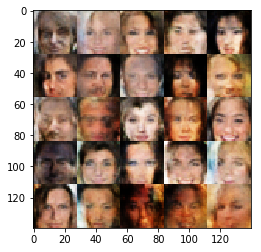

Epoch 1/1... Discriminator Loss: 0.6437... Generator Loss: 5.5830
Epoch 1/1... Discriminator Loss: 0.3849... Generator Loss: 3.1778
Epoch 1/1... Discriminator Loss: 0.4393... Generator Loss: 2.5193
Epoch 1/1... Discriminator Loss: 0.3767... Generator Loss: 3.3352
Epoch 1/1... Discriminator Loss: 0.4861... Generator Loss: 3.4926
Epoch 1/1... Discriminator Loss: 0.4245... Generator Loss: 3.0664
Epoch 1/1... Discriminator Loss: 0.3729... Generator Loss: 3.8455
Epoch 1/1... Discriminator Loss: 1.1482... Generator Loss: 5.5802
Epoch 1/1... Discriminator Loss: 0.3447... Generator Loss: 5.0247
Epoch 1/1... Discriminator Loss: 0.3643... Generator Loss: 4.2226


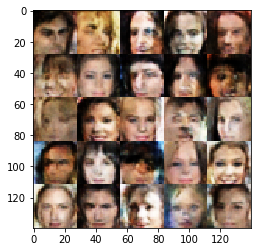

Epoch 1/1... Discriminator Loss: 0.3813... Generator Loss: 4.8742
Epoch 1/1... Discriminator Loss: 0.5070... Generator Loss: 2.0402
Epoch 1/1... Discriminator Loss: 0.3518... Generator Loss: 4.3245
Epoch 1/1... Discriminator Loss: 0.4830... Generator Loss: 2.4596
Epoch 1/1... Discriminator Loss: 0.3781... Generator Loss: 4.7456
Epoch 1/1... Discriminator Loss: 0.3778... Generator Loss: 4.2731
Epoch 1/1... Discriminator Loss: 2.5156... Generator Loss: 3.8127
Epoch 1/1... Discriminator Loss: 0.5099... Generator Loss: 2.0413
Epoch 1/1... Discriminator Loss: 0.4420... Generator Loss: 2.6476
Epoch 1/1... Discriminator Loss: 0.3694... Generator Loss: 3.8028


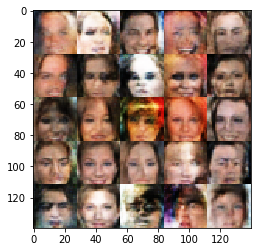

Epoch 1/1... Discriminator Loss: 0.3937... Generator Loss: 4.4257
Epoch 1/1... Discriminator Loss: 0.4643... Generator Loss: 2.4783
Epoch 1/1... Discriminator Loss: 0.3910... Generator Loss: 3.6472
Epoch 1/1... Discriminator Loss: 0.3901... Generator Loss: 3.9339
Epoch 1/1... Discriminator Loss: 0.8380... Generator Loss: 4.8171
Epoch 1/1... Discriminator Loss: 0.4505... Generator Loss: 2.6514
Epoch 1/1... Discriminator Loss: 0.4381... Generator Loss: 2.8825
Epoch 1/1... Discriminator Loss: 0.3686... Generator Loss: 3.8271
Epoch 1/1... Discriminator Loss: 0.5646... Generator Loss: 3.9554
Epoch 1/1... Discriminator Loss: 0.3991... Generator Loss: 3.1261


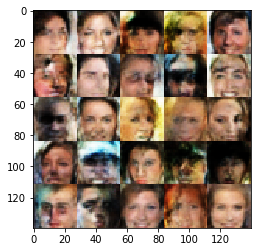

Epoch 1/1... Discriminator Loss: 1.0534... Generator Loss: 1.0107
Epoch 1/1... Discriminator Loss: 0.5015... Generator Loss: 2.2037
Epoch 1/1... Discriminator Loss: 0.9510... Generator Loss: 1.1240
Epoch 1/1... Discriminator Loss: 0.7358... Generator Loss: 1.3432
Epoch 1/1... Discriminator Loss: 0.9449... Generator Loss: 1.0688
Epoch 1/1... Discriminator Loss: 0.5494... Generator Loss: 1.9314
Epoch 1/1... Discriminator Loss: 0.8761... Generator Loss: 3.6483
Epoch 1/1... Discriminator Loss: 0.4748... Generator Loss: 2.3481
Epoch 1/1... Discriminator Loss: 0.6022... Generator Loss: 1.6956
Epoch 1/1... Discriminator Loss: 0.6144... Generator Loss: 1.5941


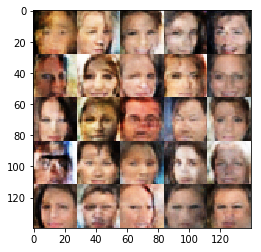

Epoch 1/1... Discriminator Loss: 0.5917... Generator Loss: 3.7724
Epoch 1/1... Discriminator Loss: 0.4221... Generator Loss: 2.8628
Epoch 1/1... Discriminator Loss: 0.4719... Generator Loss: 2.2905
Epoch 1/1... Discriminator Loss: 0.3927... Generator Loss: 3.4868
Epoch 1/1... Discriminator Loss: 0.8241... Generator Loss: 2.5932
Epoch 1/1... Discriminator Loss: 0.3764... Generator Loss: 3.7294
Epoch 1/1... Discriminator Loss: 0.4578... Generator Loss: 2.9069
Epoch 1/1... Discriminator Loss: 0.3749... Generator Loss: 3.7259
Epoch 1/1... Discriminator Loss: 0.4172... Generator Loss: 2.7597
Epoch 1/1... Discriminator Loss: 0.3569... Generator Loss: 6.1316


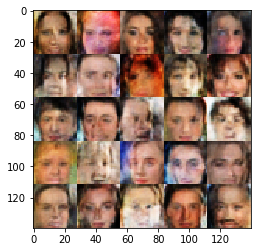

Epoch 1/1... Discriminator Loss: 0.3828... Generator Loss: 4.0178
Epoch 1/1... Discriminator Loss: 0.8928... Generator Loss: 1.2234
Epoch 1/1... Discriminator Loss: 0.3653... Generator Loss: 4.3995
Epoch 1/1... Discriminator Loss: 0.5281... Generator Loss: 2.1160
Epoch 1/1... Discriminator Loss: 0.4501... Generator Loss: 3.2113
Epoch 1/1... Discriminator Loss: 1.0846... Generator Loss: 0.7720
Epoch 1/1... Discriminator Loss: 0.5451... Generator Loss: 1.7935
Epoch 1/1... Discriminator Loss: 0.3913... Generator Loss: 3.3272
Epoch 1/1... Discriminator Loss: 0.4614... Generator Loss: 2.8680
Epoch 1/1... Discriminator Loss: 0.4141... Generator Loss: 3.2347


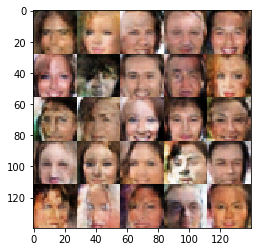

Epoch 1/1... Discriminator Loss: 0.3602... Generator Loss: 4.9246
Epoch 1/1... Discriminator Loss: 0.7888... Generator Loss: 1.2007
Epoch 1/1... Discriminator Loss: 0.8312... Generator Loss: 1.3776
Epoch 1/1... Discriminator Loss: 0.4726... Generator Loss: 3.2319
Epoch 1/1... Discriminator Loss: 0.3779... Generator Loss: 3.6093
Epoch 1/1... Discriminator Loss: 0.5714... Generator Loss: 1.7177
Epoch 1/1... Discriminator Loss: 0.4136... Generator Loss: 3.1357
Epoch 1/1... Discriminator Loss: 0.4704... Generator Loss: 2.3255
Epoch 1/1... Discriminator Loss: 0.4531... Generator Loss: 2.3331
Epoch 1/1... Discriminator Loss: 0.4079... Generator Loss: 2.7350


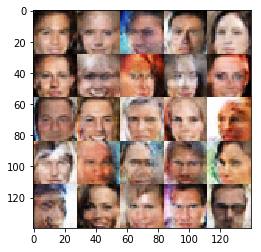

Epoch 1/1... Discriminator Loss: 0.4185... Generator Loss: 2.7071
Epoch 1/1... Discriminator Loss: 1.2198... Generator Loss: 3.1481
Epoch 1/1... Discriminator Loss: 0.3913... Generator Loss: 3.4493
Epoch 1/1... Discriminator Loss: 0.6183... Generator Loss: 1.7879
Epoch 1/1... Discriminator Loss: 0.3491... Generator Loss: 4.7097
Epoch 1/1... Discriminator Loss: 0.3906... Generator Loss: 4.1379
Epoch 1/1... Discriminator Loss: 0.4556... Generator Loss: 2.7168
Epoch 1/1... Discriminator Loss: 0.4970... Generator Loss: 4.0155
Epoch 1/1... Discriminator Loss: 0.3946... Generator Loss: 3.5371
Epoch 1/1... Discriminator Loss: 0.4332... Generator Loss: 3.0022


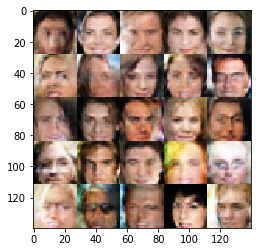

Epoch 1/1... Discriminator Loss: 0.4797... Generator Loss: 2.4457
Epoch 1/1... Discriminator Loss: 0.5438... Generator Loss: 1.8127
Epoch 1/1... Discriminator Loss: 0.3595... Generator Loss: 5.6235
Epoch 1/1... Discriminator Loss: 0.3808... Generator Loss: 3.7388
Epoch 1/1... Discriminator Loss: 0.6697... Generator Loss: 6.2057
Epoch 1/1... Discriminator Loss: 0.3651... Generator Loss: 4.5236
Epoch 1/1... Discriminator Loss: 0.7040... Generator Loss: 6.7650
Epoch 1/1... Discriminator Loss: 0.9224... Generator Loss: 4.2752
Epoch 1/1... Discriminator Loss: 0.3720... Generator Loss: 4.1949
Epoch 1/1... Discriminator Loss: 0.6621... Generator Loss: 4.7878


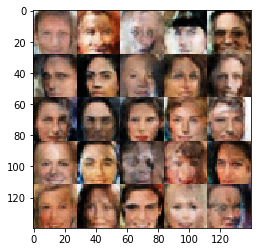

Epoch 1/1... Discriminator Loss: 0.5270... Generator Loss: 2.6914
Epoch 1/1... Discriminator Loss: 0.5188... Generator Loss: 4.2187
Epoch 1/1... Discriminator Loss: 0.4417... Generator Loss: 2.6108
Epoch 1/1... Discriminator Loss: 0.9633... Generator Loss: 0.8916
Epoch 1/1... Discriminator Loss: 0.4569... Generator Loss: 2.4749
Epoch 1/1... Discriminator Loss: 0.4326... Generator Loss: 3.3020
Epoch 1/1... Discriminator Loss: 0.4676... Generator Loss: 3.4938
Epoch 1/1... Discriminator Loss: 0.3651... Generator Loss: 4.0446
Epoch 1/1... Discriminator Loss: 0.3694... Generator Loss: 4.4476
Epoch 1/1... Discriminator Loss: 0.4889... Generator Loss: 2.0913


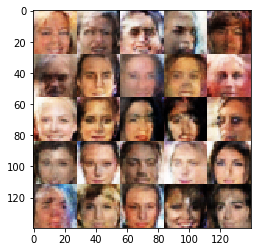

Epoch 1/1... Discriminator Loss: 0.3777... Generator Loss: 3.4278
Epoch 1/1... Discriminator Loss: 0.4664... Generator Loss: 2.4458
Epoch 1/1... Discriminator Loss: 0.4344... Generator Loss: 3.4642
Epoch 1/1... Discriminator Loss: 0.4498... Generator Loss: 3.3515
Epoch 1/1... Discriminator Loss: 0.3650... Generator Loss: 3.6469
Epoch 1/1... Discriminator Loss: 0.3677... Generator Loss: 3.6302
Epoch 1/1... Discriminator Loss: 0.6663... Generator Loss: 1.3880
Epoch 1/1... Discriminator Loss: 0.4061... Generator Loss: 3.2390
Epoch 1/1... Discriminator Loss: 0.4398... Generator Loss: 2.4756
Epoch 1/1... Discriminator Loss: 0.3920... Generator Loss: 4.8528


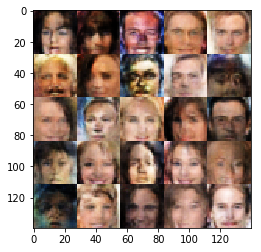

Epoch 1/1... Discriminator Loss: 0.3869... Generator Loss: 3.3639
Epoch 1/1... Discriminator Loss: 0.3635... Generator Loss: 3.8092
Epoch 1/1... Discriminator Loss: 0.3487... Generator Loss: 4.2995
Epoch 1/1... Discriminator Loss: 0.4229... Generator Loss: 3.5709
Epoch 1/1... Discriminator Loss: 0.4484... Generator Loss: 2.4678
Epoch 1/1... Discriminator Loss: 0.3502... Generator Loss: 4.8575
Epoch 1/1... Discriminator Loss: 0.5132... Generator Loss: 2.9236
Epoch 1/1... Discriminator Loss: 0.4079... Generator Loss: 3.8213
Epoch 1/1... Discriminator Loss: 0.7019... Generator Loss: 5.5064
Epoch 1/1... Discriminator Loss: 0.9721... Generator Loss: 4.4699


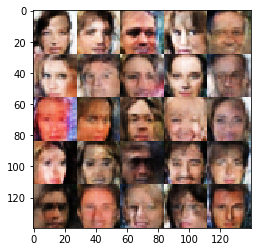

Epoch 1/1... Discriminator Loss: 0.3649... Generator Loss: 4.2931
Epoch 1/1... Discriminator Loss: 0.4184... Generator Loss: 3.4583
Epoch 1/1... Discriminator Loss: 0.5456... Generator Loss: 2.6370
Epoch 1/1... Discriminator Loss: 0.5899... Generator Loss: 1.8991
Epoch 1/1... Discriminator Loss: 0.3699... Generator Loss: 4.0019
Epoch 1/1... Discriminator Loss: 2.6033... Generator Loss: 4.8024
Epoch 1/1... Discriminator Loss: 0.4184... Generator Loss: 2.8755
Epoch 1/1... Discriminator Loss: 1.2131... Generator Loss: 0.8105
Epoch 1/1... Discriminator Loss: 0.3955... Generator Loss: 3.4279
Epoch 1/1... Discriminator Loss: 0.4581... Generator Loss: 2.4027


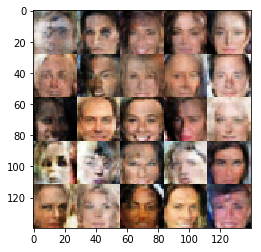

Epoch 1/1... Discriminator Loss: 0.4402... Generator Loss: 2.7894
Epoch 1/1... Discriminator Loss: 0.3907... Generator Loss: 3.3051
Epoch 1/1... Discriminator Loss: 1.8876... Generator Loss: 0.3366
Epoch 1/1... Discriminator Loss: 0.4307... Generator Loss: 2.7146
Epoch 1/1... Discriminator Loss: 0.3872... Generator Loss: 3.1487
Epoch 1/1... Discriminator Loss: 0.6091... Generator Loss: 1.7684
Epoch 1/1... Discriminator Loss: 0.5296... Generator Loss: 1.9719
Epoch 1/1... Discriminator Loss: 0.4622... Generator Loss: 2.3095
Epoch 1/1... Discriminator Loss: 0.5384... Generator Loss: 2.0623
Epoch 1/1... Discriminator Loss: 0.6653... Generator Loss: 1.7518


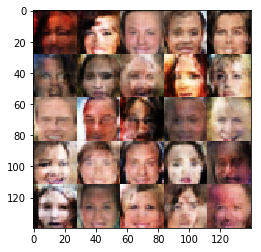

Epoch 1/1... Discriminator Loss: 0.5321... Generator Loss: 2.8334
Epoch 1/1... Discriminator Loss: 0.6305... Generator Loss: 1.7165
Epoch 1/1... Discriminator Loss: 0.3516... Generator Loss: 4.5732
Epoch 1/1... Discriminator Loss: 0.3582... Generator Loss: 4.3642
Epoch 1/1... Discriminator Loss: 0.4014... Generator Loss: 3.5271
Epoch 1/1... Discriminator Loss: 0.4025... Generator Loss: 3.1704
Epoch 1/1... Discriminator Loss: 0.3642... Generator Loss: 3.9046
Epoch 1/1... Discriminator Loss: 1.0171... Generator Loss: 0.8945
Epoch 1/1... Discriminator Loss: 0.6120... Generator Loss: 1.7559
Epoch 1/1... Discriminator Loss: 0.3646... Generator Loss: 4.7711


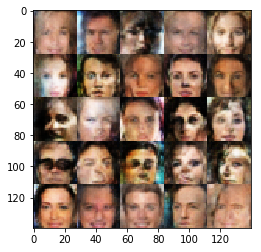

Epoch 1/1... Discriminator Loss: 0.3809... Generator Loss: 4.2722
Epoch 1/1... Discriminator Loss: 3.0796... Generator Loss: 0.1201
Epoch 1/1... Discriminator Loss: 0.3897... Generator Loss: 3.5998
Epoch 1/1... Discriminator Loss: 0.4029... Generator Loss: 3.1687
Epoch 1/1... Discriminator Loss: 0.3797... Generator Loss: 4.4901
Epoch 1/1... Discriminator Loss: 0.4170... Generator Loss: 3.3986
Epoch 1/1... Discriminator Loss: 0.5911... Generator Loss: 4.6407
Epoch 1/1... Discriminator Loss: 0.3663... Generator Loss: 4.1193
Epoch 1/1... Discriminator Loss: 0.4060... Generator Loss: 3.0260
Epoch 1/1... Discriminator Loss: 0.5716... Generator Loss: 1.7709


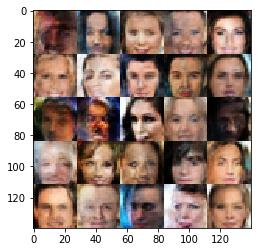

Epoch 1/1... Discriminator Loss: 0.4335... Generator Loss: 2.6138
Epoch 1/1... Discriminator Loss: 0.4004... Generator Loss: 3.5513
Epoch 1/1... Discriminator Loss: 0.4114... Generator Loss: 3.1024
Epoch 1/1... Discriminator Loss: 0.4954... Generator Loss: 2.8404
Epoch 1/1... Discriminator Loss: 0.4380... Generator Loss: 3.2871
Epoch 1/1... Discriminator Loss: 0.4657... Generator Loss: 2.9939
Epoch 1/1... Discriminator Loss: 0.4061... Generator Loss: 3.3253
Epoch 1/1... Discriminator Loss: 0.4479... Generator Loss: 2.6487
Epoch 1/1... Discriminator Loss: 0.5424... Generator Loss: 1.8750
Epoch 1/1... Discriminator Loss: 0.3586... Generator Loss: 4.5793


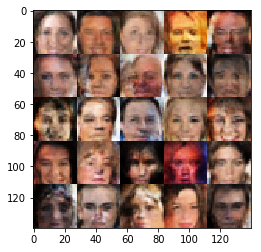

Epoch 1/1... Discriminator Loss: 0.4512... Generator Loss: 3.3635
Epoch 1/1... Discriminator Loss: 0.3923... Generator Loss: 3.2515
Epoch 1/1... Discriminator Loss: 0.4782... Generator Loss: 4.4537
Epoch 1/1... Discriminator Loss: 0.3899... Generator Loss: 3.2782
Epoch 1/1... Discriminator Loss: 0.3453... Generator Loss: 4.6603
Epoch 1/1... Discriminator Loss: 1.1968... Generator Loss: 4.8863
Epoch 1/1... Discriminator Loss: 1.1037... Generator Loss: 0.8364
Epoch 1/1... Discriminator Loss: 0.4297... Generator Loss: 2.8263
Epoch 1/1... Discriminator Loss: 0.5966... Generator Loss: 1.8257
Epoch 1/1... Discriminator Loss: 0.4681... Generator Loss: 2.5087


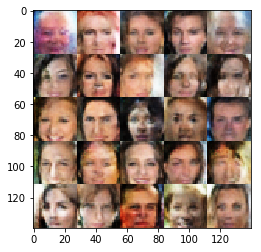

Epoch 1/1... Discriminator Loss: 1.1656... Generator Loss: 0.7406
Epoch 1/1... Discriminator Loss: 0.3706... Generator Loss: 3.7559
Epoch 1/1... Discriminator Loss: 0.5669... Generator Loss: 3.0959
Epoch 1/1... Discriminator Loss: 0.7492... Generator Loss: 1.4935
Epoch 1/1... Discriminator Loss: 0.8516... Generator Loss: 5.3164
Epoch 1/1... Discriminator Loss: 0.5503... Generator Loss: 2.2147
Epoch 1/1... Discriminator Loss: 0.4299... Generator Loss: 3.0431
Epoch 1/1... Discriminator Loss: 0.3982... Generator Loss: 4.2775
Epoch 1/1... Discriminator Loss: 0.4483... Generator Loss: 2.7725
Epoch 1/1... Discriminator Loss: 0.3696... Generator Loss: 5.2463


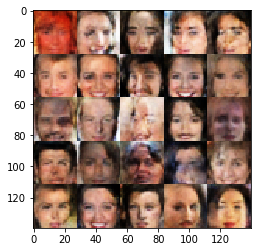

Epoch 1/1... Discriminator Loss: 0.3664... Generator Loss: 4.6410
Epoch 1/1... Discriminator Loss: 0.3710... Generator Loss: 3.7362
Epoch 1/1... Discriminator Loss: 0.4424... Generator Loss: 4.5863
Epoch 1/1... Discriminator Loss: 0.4040... Generator Loss: 4.6050
Epoch 1/1... Discriminator Loss: 0.3720... Generator Loss: 3.6558
Epoch 1/1... Discriminator Loss: 2.0015... Generator Loss: 0.3372
Epoch 1/1... Discriminator Loss: 1.6758... Generator Loss: 0.3325
Epoch 1/1... Discriminator Loss: 0.8953... Generator Loss: 3.7456
Epoch 1/1... Discriminator Loss: 0.3906... Generator Loss: 3.5515
Epoch 1/1... Discriminator Loss: 0.4448... Generator Loss: 2.4839


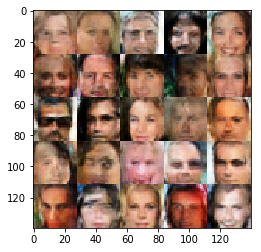

Epoch 1/1... Discriminator Loss: 0.4865... Generator Loss: 2.1415
Epoch 1/1... Discriminator Loss: 2.0088... Generator Loss: 0.2910
Epoch 1/1... Discriminator Loss: 0.3589... Generator Loss: 4.2568
Epoch 1/1... Discriminator Loss: 0.3562... Generator Loss: 4.0057
Epoch 1/1... Discriminator Loss: 0.4139... Generator Loss: 6.0818
Epoch 1/1... Discriminator Loss: 0.3909... Generator Loss: 3.3979
Epoch 1/1... Discriminator Loss: 0.3979... Generator Loss: 3.7372
Epoch 1/1... Discriminator Loss: 1.2026... Generator Loss: 0.8513
Epoch 1/1... Discriminator Loss: 0.4096... Generator Loss: 3.3035
Epoch 1/1... Discriminator Loss: 0.3566... Generator Loss: 4.7631


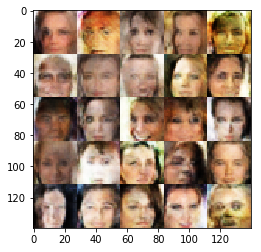

Epoch 1/1... Discriminator Loss: 0.3745... Generator Loss: 3.8760
Epoch 1/1... Discriminator Loss: 0.4068... Generator Loss: 3.4078
Epoch 1/1... Discriminator Loss: 0.9626... Generator Loss: 1.0247
Epoch 1/1... Discriminator Loss: 0.3698... Generator Loss: 3.7905
Epoch 1/1... Discriminator Loss: 0.3652... Generator Loss: 4.0848
Epoch 1/1... Discriminator Loss: 0.3685... Generator Loss: 4.7593
Epoch 1/1... Discriminator Loss: 0.4062... Generator Loss: 2.8344
Epoch 1/1... Discriminator Loss: 0.3405... Generator Loss: 4.7551
Epoch 1/1... Discriminator Loss: 0.3717... Generator Loss: 3.4091
Epoch 1/1... Discriminator Loss: 0.4542... Generator Loss: 2.6948


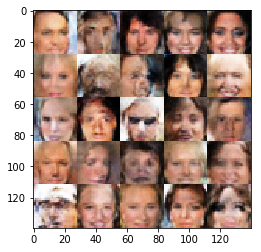

Epoch 1/1... Discriminator Loss: 0.3641... Generator Loss: 3.9196
Epoch 1/1... Discriminator Loss: 0.3637... Generator Loss: 4.2177
Epoch 1/1... Discriminator Loss: 0.3728... Generator Loss: 3.7975
Epoch 1/1... Discriminator Loss: 0.4280... Generator Loss: 5.2364
Epoch 1/1... Discriminator Loss: 0.4437... Generator Loss: 2.6833
Epoch 1/1... Discriminator Loss: 0.9051... Generator Loss: 1.2560
Epoch 1/1... Discriminator Loss: 0.6880... Generator Loss: 2.0157
Epoch 1/1... Discriminator Loss: 0.4198... Generator Loss: 4.6960
Epoch 1/1... Discriminator Loss: 0.3705... Generator Loss: 5.2694
Epoch 1/1... Discriminator Loss: 0.3616... Generator Loss: 4.2044


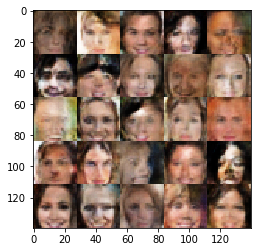

Epoch 1/1... Discriminator Loss: 0.5488... Generator Loss: 1.9189
Epoch 1/1... Discriminator Loss: 0.6017... Generator Loss: 1.7802
Epoch 1/1... Discriminator Loss: 0.3581... Generator Loss: 4.7234
Epoch 1/1... Discriminator Loss: 0.4522... Generator Loss: 5.0150
Epoch 1/1... Discriminator Loss: 1.6860... Generator Loss: 0.5508
Epoch 1/1... Discriminator Loss: 0.7893... Generator Loss: 2.8520
Epoch 1/1... Discriminator Loss: 0.4210... Generator Loss: 3.0885
Epoch 1/1... Discriminator Loss: 0.5371... Generator Loss: 2.0229
Epoch 1/1... Discriminator Loss: 1.7248... Generator Loss: 0.4035
Epoch 1/1... Discriminator Loss: 0.4978... Generator Loss: 2.3047


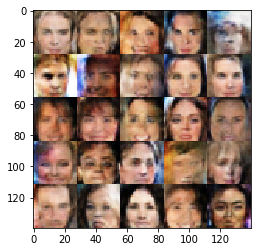

Epoch 1/1... Discriminator Loss: 0.4423... Generator Loss: 2.5205
Epoch 1/1... Discriminator Loss: 0.4366... Generator Loss: 2.9623
Epoch 1/1... Discriminator Loss: 0.4005... Generator Loss: 4.1348
Epoch 1/1... Discriminator Loss: 0.3828... Generator Loss: 4.7346
Epoch 1/1... Discriminator Loss: 1.0589... Generator Loss: 0.7595
Epoch 1/1... Discriminator Loss: 0.3630... Generator Loss: 3.6959
Epoch 1/1... Discriminator Loss: 0.4547... Generator Loss: 2.6974
Epoch 1/1... Discriminator Loss: 0.3702... Generator Loss: 5.0264
Epoch 1/1... Discriminator Loss: 0.5082... Generator Loss: 2.4087
Epoch 1/1... Discriminator Loss: 0.3940... Generator Loss: 3.8706


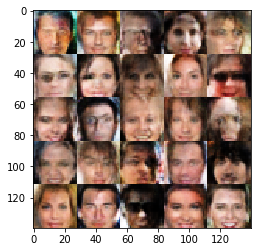

Epoch 1/1... Discriminator Loss: 0.4646... Generator Loss: 2.6923
Epoch 1/1... Discriminator Loss: 0.8348... Generator Loss: 5.4755
Epoch 1/1... Discriminator Loss: 0.3841... Generator Loss: 3.8538
Epoch 1/1... Discriminator Loss: 0.5092... Generator Loss: 2.7112
Epoch 1/1... Discriminator Loss: 0.3617... Generator Loss: 4.2196
Epoch 1/1... Discriminator Loss: 0.4417... Generator Loss: 4.1593
Epoch 1/1... Discriminator Loss: 1.5957... Generator Loss: 3.7036
Epoch 1/1... Discriminator Loss: 0.6801... Generator Loss: 1.4985
Epoch 1/1... Discriminator Loss: 0.7364... Generator Loss: 5.4572
Epoch 1/1... Discriminator Loss: 1.8604... Generator Loss: 4.7699


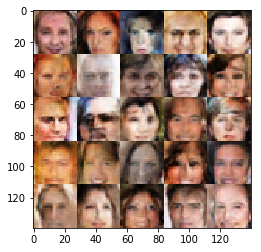

Epoch 1/1... Discriminator Loss: 0.4156... Generator Loss: 4.6885
Epoch 1/1... Discriminator Loss: 0.4540... Generator Loss: 2.6815
Epoch 1/1... Discriminator Loss: 0.3859... Generator Loss: 4.3907
Epoch 1/1... Discriminator Loss: 0.4809... Generator Loss: 2.8463
Epoch 1/1... Discriminator Loss: 0.3518... Generator Loss: 4.2746
Epoch 1/1... Discriminator Loss: 0.6266... Generator Loss: 2.3279
Epoch 1/1... Discriminator Loss: 0.3758... Generator Loss: 3.5958
Epoch 1/1... Discriminator Loss: 1.0016... Generator Loss: 1.0230
Epoch 1/1... Discriminator Loss: 0.4463... Generator Loss: 2.8394
Epoch 1/1... Discriminator Loss: 0.4559... Generator Loss: 2.5707


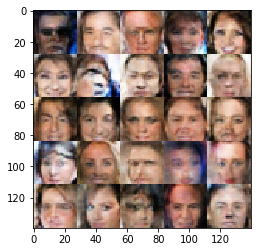

Epoch 1/1... Discriminator Loss: 0.3815... Generator Loss: 3.3643
Epoch 1/1... Discriminator Loss: 0.4792... Generator Loss: 4.8978
Epoch 1/1... Discriminator Loss: 0.4873... Generator Loss: 3.1458
Epoch 1/1... Discriminator Loss: 0.4509... Generator Loss: 2.8917
Epoch 1/1... Discriminator Loss: 0.4804... Generator Loss: 2.2262
Epoch 1/1... Discriminator Loss: 0.4695... Generator Loss: 5.2768
Epoch 1/1... Discriminator Loss: 0.5966... Generator Loss: 1.8594
Epoch 1/1... Discriminator Loss: 0.6336... Generator Loss: 5.5247
Epoch 1/1... Discriminator Loss: 0.4018... Generator Loss: 3.2321
Epoch 1/1... Discriminator Loss: 0.3524... Generator Loss: 4.0762


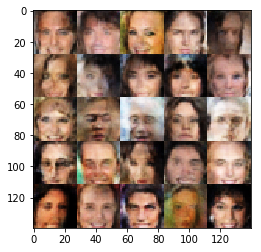

Epoch 1/1... Discriminator Loss: 0.3494... Generator Loss: 5.3828
Epoch 1/1... Discriminator Loss: 0.4417... Generator Loss: 2.5601


In [13]:
batch_size = 20
z_dim = 100
learning_rate = 0.0002
beta1 = 0.2

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

(?, 28, 28, 3)
Epoch 1/1... Discriminator Loss: 3.5389... Generator Loss: 0.0560
Epoch 1/1... Discriminator Loss: 2.6869... Generator Loss: 0.1261
Epoch 1/1... Discriminator Loss: 2.1916... Generator Loss: 0.2101
Epoch 1/1... Discriminator Loss: 2.0145... Generator Loss: 0.2486
Epoch 1/1... Discriminator Loss: 0.8422... Generator Loss: 1.7645
Epoch 1/1... Discriminator Loss: 0.6589... Generator Loss: 1.6742
Epoch 1/1... Discriminator Loss: 2.3024... Generator Loss: 0.2058
Epoch 1/1... Discriminator Loss: 1.1690... Generator Loss: 1.0509
Epoch 1/1... Discriminator Loss: 1.4198... Generator Loss: 0.5554
Epoch 1/1... Discriminator Loss: 1.4058... Generator Loss: 0.5781


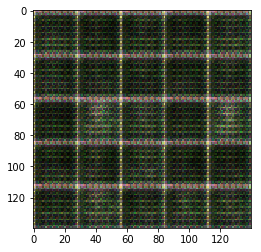

Epoch 1/1... Discriminator Loss: 1.5434... Generator Loss: 1.7977
Epoch 1/1... Discriminator Loss: 1.6409... Generator Loss: 0.4308
Epoch 1/1... Discriminator Loss: 1.7127... Generator Loss: 0.3570
Epoch 1/1... Discriminator Loss: 1.5946... Generator Loss: 0.4310
Epoch 1/1... Discriminator Loss: 1.3634... Generator Loss: 0.6342
Epoch 1/1... Discriminator Loss: 1.2026... Generator Loss: 0.8967
Epoch 1/1... Discriminator Loss: 1.4608... Generator Loss: 0.9038
Epoch 1/1... Discriminator Loss: 1.5297... Generator Loss: 1.7718
Epoch 1/1... Discriminator Loss: 1.4770... Generator Loss: 0.7414
Epoch 1/1... Discriminator Loss: 1.3659... Generator Loss: 1.1394


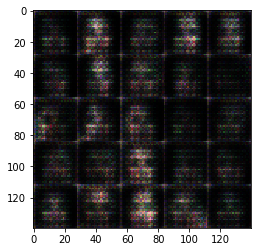

Epoch 1/1... Discriminator Loss: 1.1953... Generator Loss: 1.0696
Epoch 1/1... Discriminator Loss: 1.8758... Generator Loss: 0.3250
Epoch 1/1... Discriminator Loss: 1.5643... Generator Loss: 0.8846
Epoch 1/1... Discriminator Loss: 1.7265... Generator Loss: 0.3219
Epoch 1/1... Discriminator Loss: 1.2650... Generator Loss: 1.1246
Epoch 1/1... Discriminator Loss: 1.1178... Generator Loss: 1.1828
Epoch 1/1... Discriminator Loss: 1.1145... Generator Loss: 0.9060
Epoch 1/1... Discriminator Loss: 1.4993... Generator Loss: 0.6184
Epoch 1/1... Discriminator Loss: 2.0260... Generator Loss: 0.2993
Epoch 1/1... Discriminator Loss: 1.5117... Generator Loss: 0.5906


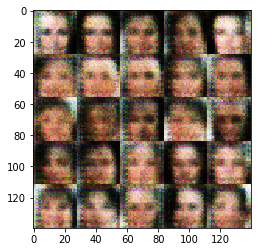

Epoch 1/1... Discriminator Loss: 1.4065... Generator Loss: 0.6624
Epoch 1/1... Discriminator Loss: 1.3311... Generator Loss: 0.8601
Epoch 1/1... Discriminator Loss: 1.3005... Generator Loss: 0.6065
Epoch 1/1... Discriminator Loss: 1.6988... Generator Loss: 0.3956
Epoch 1/1... Discriminator Loss: 1.5267... Generator Loss: 1.1141
Epoch 1/1... Discriminator Loss: 1.2539... Generator Loss: 0.8845
Epoch 1/1... Discriminator Loss: 1.3138... Generator Loss: 0.8681
Epoch 1/1... Discriminator Loss: 1.3863... Generator Loss: 0.5593
Epoch 1/1... Discriminator Loss: 1.4845... Generator Loss: 0.4893
Epoch 1/1... Discriminator Loss: 1.4553... Generator Loss: 0.4400


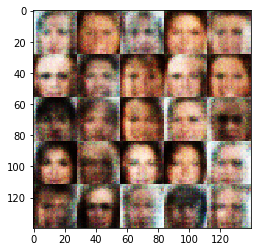

Epoch 1/1... Discriminator Loss: 1.1031... Generator Loss: 0.8867
Epoch 1/1... Discriminator Loss: 1.4250... Generator Loss: 0.5339
Epoch 1/1... Discriminator Loss: 1.5132... Generator Loss: 0.3962
Epoch 1/1... Discriminator Loss: 1.3990... Generator Loss: 1.2869
Epoch 1/1... Discriminator Loss: 1.2335... Generator Loss: 0.8228
Epoch 1/1... Discriminator Loss: 1.0087... Generator Loss: 0.8589
Epoch 1/1... Discriminator Loss: 1.5892... Generator Loss: 0.8819
Epoch 1/1... Discriminator Loss: 1.2465... Generator Loss: 1.0114
Epoch 1/1... Discriminator Loss: 1.2279... Generator Loss: 0.7373
Epoch 1/1... Discriminator Loss: 1.4467... Generator Loss: 0.5732


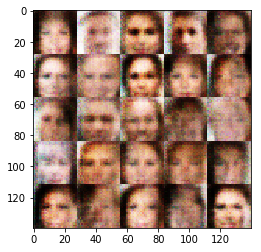

Epoch 1/1... Discriminator Loss: 1.4991... Generator Loss: 0.5886
Epoch 1/1... Discriminator Loss: 1.5103... Generator Loss: 0.6798
Epoch 1/1... Discriminator Loss: 1.5137... Generator Loss: 1.3705
Epoch 1/1... Discriminator Loss: 1.7312... Generator Loss: 0.3777
Epoch 1/1... Discriminator Loss: 1.4161... Generator Loss: 0.5607
Epoch 1/1... Discriminator Loss: 1.6974... Generator Loss: 0.3457
Epoch 1/1... Discriminator Loss: 1.4571... Generator Loss: 0.5228
Epoch 1/1... Discriminator Loss: 1.5600... Generator Loss: 0.4749
Epoch 1/1... Discriminator Loss: 1.3563... Generator Loss: 0.6879
Epoch 1/1... Discriminator Loss: 1.4175... Generator Loss: 0.5565


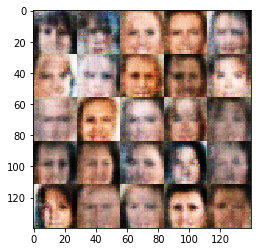

Epoch 1/1... Discriminator Loss: 1.4495... Generator Loss: 0.4738
Epoch 1/1... Discriminator Loss: 1.5217... Generator Loss: 0.4843
Epoch 1/1... Discriminator Loss: 1.4412... Generator Loss: 0.4902
Epoch 1/1... Discriminator Loss: 1.3586... Generator Loss: 0.6295
Epoch 1/1... Discriminator Loss: 1.3673... Generator Loss: 0.6557
Epoch 1/1... Discriminator Loss: 1.5021... Generator Loss: 0.5551
Epoch 1/1... Discriminator Loss: 1.4431... Generator Loss: 0.5879
Epoch 1/1... Discriminator Loss: 1.4775... Generator Loss: 0.5095
Epoch 1/1... Discriminator Loss: 1.4023... Generator Loss: 0.7152
Epoch 1/1... Discriminator Loss: 1.4424... Generator Loss: 0.6952


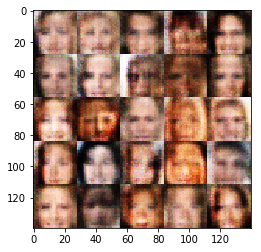

Epoch 1/1... Discriminator Loss: 1.3612... Generator Loss: 0.6194
Epoch 1/1... Discriminator Loss: 1.3781... Generator Loss: 0.6144
Epoch 1/1... Discriminator Loss: 1.3827... Generator Loss: 0.5906
Epoch 1/1... Discriminator Loss: 1.4683... Generator Loss: 0.5515
Epoch 1/1... Discriminator Loss: 1.4012... Generator Loss: 0.5383
Epoch 1/1... Discriminator Loss: 1.3764... Generator Loss: 1.0292
Epoch 1/1... Discriminator Loss: 1.4246... Generator Loss: 0.5894
Epoch 1/1... Discriminator Loss: 1.3969... Generator Loss: 0.9424
Epoch 1/1... Discriminator Loss: 1.4247... Generator Loss: 0.5730
Epoch 1/1... Discriminator Loss: 1.3954... Generator Loss: 0.6828


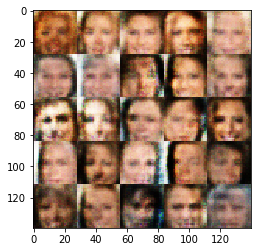

Epoch 1/1... Discriminator Loss: 1.3652... Generator Loss: 0.8716
Epoch 1/1... Discriminator Loss: 1.4104... Generator Loss: 0.5863
Epoch 1/1... Discriminator Loss: 1.3384... Generator Loss: 0.6770
Epoch 1/1... Discriminator Loss: 1.4220... Generator Loss: 0.9906
Epoch 1/1... Discriminator Loss: 1.3548... Generator Loss: 1.2148
Epoch 1/1... Discriminator Loss: 1.3326... Generator Loss: 0.7195
Epoch 1/1... Discriminator Loss: 1.3574... Generator Loss: 0.5928
Epoch 1/1... Discriminator Loss: 1.5230... Generator Loss: 0.7058
Epoch 1/1... Discriminator Loss: 1.3498... Generator Loss: 0.6516
Epoch 1/1... Discriminator Loss: 1.5011... Generator Loss: 0.4821


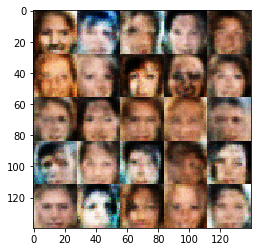

Epoch 1/1... Discriminator Loss: 1.2683... Generator Loss: 0.8801
Epoch 1/1... Discriminator Loss: 1.2860... Generator Loss: 0.7706
Epoch 1/1... Discriminator Loss: 1.4662... Generator Loss: 0.6382
Epoch 1/1... Discriminator Loss: 1.3726... Generator Loss: 0.7071
Epoch 1/1... Discriminator Loss: 1.3846... Generator Loss: 0.7612
Epoch 1/1... Discriminator Loss: 1.3856... Generator Loss: 0.6079
Epoch 1/1... Discriminator Loss: 1.4987... Generator Loss: 0.5092
Epoch 1/1... Discriminator Loss: 1.3838... Generator Loss: 0.5593
Epoch 1/1... Discriminator Loss: 1.2812... Generator Loss: 0.6939
Epoch 1/1... Discriminator Loss: 1.2522... Generator Loss: 0.7969


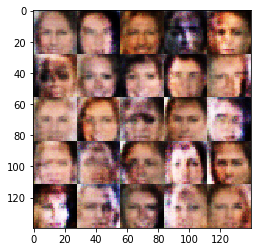

Epoch 1/1... Discriminator Loss: 1.1683... Generator Loss: 1.0143
Epoch 1/1... Discriminator Loss: 1.2228... Generator Loss: 0.9301
Epoch 1/1... Discriminator Loss: 1.4248... Generator Loss: 0.6445
Epoch 1/1... Discriminator Loss: 1.2977... Generator Loss: 0.8001
Epoch 1/1... Discriminator Loss: 1.3144... Generator Loss: 0.7376
Epoch 1/1... Discriminator Loss: 1.3420... Generator Loss: 1.0301
Epoch 1/1... Discriminator Loss: 1.2587... Generator Loss: 1.0089
Epoch 1/1... Discriminator Loss: 1.3420... Generator Loss: 1.1353
Epoch 1/1... Discriminator Loss: 1.2965... Generator Loss: 0.7334
Epoch 1/1... Discriminator Loss: 1.2236... Generator Loss: 0.7491


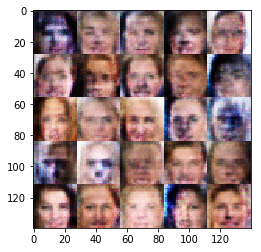

Epoch 1/1... Discriminator Loss: 1.1790... Generator Loss: 1.1187
Epoch 1/1... Discriminator Loss: 1.3816... Generator Loss: 0.9205
Epoch 1/1... Discriminator Loss: 1.2501... Generator Loss: 1.3139
Epoch 1/1... Discriminator Loss: 1.3518... Generator Loss: 1.0165
Epoch 1/1... Discriminator Loss: 1.5342... Generator Loss: 1.4789
Epoch 1/1... Discriminator Loss: 1.3011... Generator Loss: 0.8258
Epoch 1/1... Discriminator Loss: 1.3192... Generator Loss: 0.6567
Epoch 1/1... Discriminator Loss: 1.1473... Generator Loss: 1.0069
Epoch 1/1... Discriminator Loss: 1.2853... Generator Loss: 0.8382
Epoch 1/1... Discriminator Loss: 1.2455... Generator Loss: 1.2989


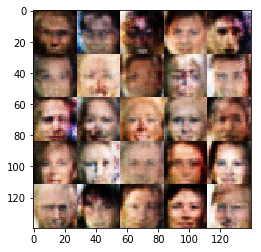

Epoch 1/1... Discriminator Loss: 1.3876... Generator Loss: 0.6914
Epoch 1/1... Discriminator Loss: 1.4068... Generator Loss: 0.5156
Epoch 1/1... Discriminator Loss: 1.2978... Generator Loss: 1.4627
Epoch 1/1... Discriminator Loss: 1.4088... Generator Loss: 0.8648
Epoch 1/1... Discriminator Loss: 1.3273... Generator Loss: 0.6185
Epoch 1/1... Discriminator Loss: 1.3435... Generator Loss: 0.5837
Epoch 1/1... Discriminator Loss: 1.2541... Generator Loss: 1.0955
Epoch 1/1... Discriminator Loss: 1.3999... Generator Loss: 0.5906
Epoch 1/1... Discriminator Loss: 1.3773... Generator Loss: 0.7085
Epoch 1/1... Discriminator Loss: 1.2977... Generator Loss: 0.6929


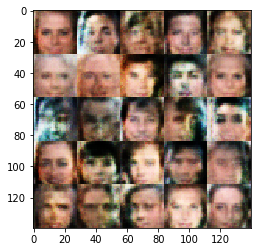

Epoch 1/1... Discriminator Loss: 1.2974... Generator Loss: 0.8768
Epoch 1/1... Discriminator Loss: 1.2650... Generator Loss: 0.6603
Epoch 1/1... Discriminator Loss: 1.3102... Generator Loss: 1.1515
Epoch 1/1... Discriminator Loss: 1.3468... Generator Loss: 0.7470
Epoch 1/1... Discriminator Loss: 1.3430... Generator Loss: 0.7220
Epoch 1/1... Discriminator Loss: 1.2518... Generator Loss: 1.2691
Epoch 1/1... Discriminator Loss: 1.3295... Generator Loss: 0.8861
Epoch 1/1... Discriminator Loss: 1.2920... Generator Loss: 0.6845
Epoch 1/1... Discriminator Loss: 1.3321... Generator Loss: 0.7450
Epoch 1/1... Discriminator Loss: 1.2152... Generator Loss: 0.8747


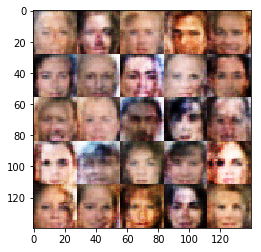

Epoch 1/1... Discriminator Loss: 1.2817... Generator Loss: 0.7770
Epoch 1/1... Discriminator Loss: 1.3883... Generator Loss: 0.6712
Epoch 1/1... Discriminator Loss: 1.2847... Generator Loss: 1.0204
Epoch 1/1... Discriminator Loss: 1.3617... Generator Loss: 0.6205
Epoch 1/1... Discriminator Loss: 1.2953... Generator Loss: 0.6631
Epoch 1/1... Discriminator Loss: 1.4354... Generator Loss: 0.5523
Epoch 1/1... Discriminator Loss: 1.3405... Generator Loss: 0.7189
Epoch 1/1... Discriminator Loss: 1.0699... Generator Loss: 1.0098
Epoch 1/1... Discriminator Loss: 1.3142... Generator Loss: 1.0524
Epoch 1/1... Discriminator Loss: 1.2347... Generator Loss: 1.0032


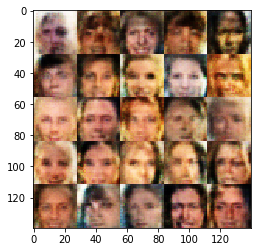

Epoch 1/1... Discriminator Loss: 1.4246... Generator Loss: 0.9176
Epoch 1/1... Discriminator Loss: 1.3052... Generator Loss: 0.7568
Epoch 1/1... Discriminator Loss: 1.2431... Generator Loss: 0.6918
Epoch 1/1... Discriminator Loss: 1.4323... Generator Loss: 0.5127
Epoch 1/1... Discriminator Loss: 1.3551... Generator Loss: 1.0013
Epoch 1/1... Discriminator Loss: 1.3776... Generator Loss: 1.0327
Epoch 1/1... Discriminator Loss: 1.3571... Generator Loss: 0.6004
Epoch 1/1... Discriminator Loss: 1.3746... Generator Loss: 1.1562
Epoch 1/1... Discriminator Loss: 1.4176... Generator Loss: 0.5706
Epoch 1/1... Discriminator Loss: 1.3052... Generator Loss: 0.7136


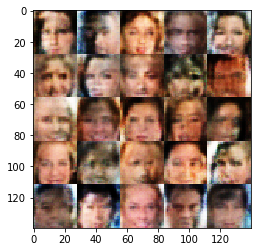

Epoch 1/1... Discriminator Loss: 1.2870... Generator Loss: 0.9548
Epoch 1/1... Discriminator Loss: 1.4719... Generator Loss: 0.4704
Epoch 1/1... Discriminator Loss: 1.3790... Generator Loss: 0.6938
Epoch 1/1... Discriminator Loss: 1.3957... Generator Loss: 0.5624
Epoch 1/1... Discriminator Loss: 1.4759... Generator Loss: 0.5151
Epoch 1/1... Discriminator Loss: 1.2409... Generator Loss: 0.8174
Epoch 1/1... Discriminator Loss: 1.3193... Generator Loss: 0.9608
Epoch 1/1... Discriminator Loss: 1.3905... Generator Loss: 0.7702
Epoch 1/1... Discriminator Loss: 1.2138... Generator Loss: 0.8814
Epoch 1/1... Discriminator Loss: 1.1643... Generator Loss: 0.8873


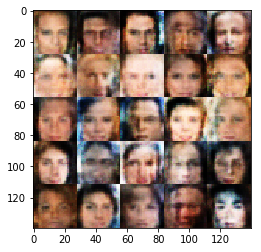

Epoch 1/1... Discriminator Loss: 1.3775... Generator Loss: 1.1233
Epoch 1/1... Discriminator Loss: 1.3685... Generator Loss: 0.8285
Epoch 1/1... Discriminator Loss: 1.3251... Generator Loss: 0.7720
Epoch 1/1... Discriminator Loss: 1.1903... Generator Loss: 0.8135
Epoch 1/1... Discriminator Loss: 1.5802... Generator Loss: 0.4565
Epoch 1/1... Discriminator Loss: 1.3562... Generator Loss: 0.7821
Epoch 1/1... Discriminator Loss: 1.2158... Generator Loss: 0.8448
Epoch 1/1... Discriminator Loss: 1.4524... Generator Loss: 0.4523
Epoch 1/1... Discriminator Loss: 1.4466... Generator Loss: 0.6981
Epoch 1/1... Discriminator Loss: 1.5281... Generator Loss: 0.3958


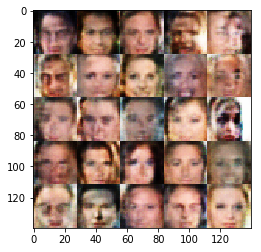

Epoch 1/1... Discriminator Loss: 1.3373... Generator Loss: 0.7500
Epoch 1/1... Discriminator Loss: 1.3594... Generator Loss: 0.7687
Epoch 1/1... Discriminator Loss: 1.2250... Generator Loss: 1.0637
Epoch 1/1... Discriminator Loss: 1.3645... Generator Loss: 0.6412
Epoch 1/1... Discriminator Loss: 1.3016... Generator Loss: 1.0333
Epoch 1/1... Discriminator Loss: 1.3035... Generator Loss: 0.7357
Epoch 1/1... Discriminator Loss: 1.2431... Generator Loss: 0.8748
Epoch 1/1... Discriminator Loss: 1.3586... Generator Loss: 0.6719
Epoch 1/1... Discriminator Loss: 1.2357... Generator Loss: 0.8356
Epoch 1/1... Discriminator Loss: 1.3936... Generator Loss: 0.5475


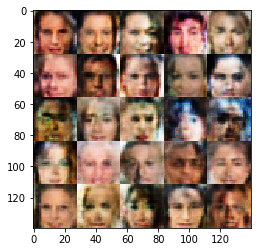

Epoch 1/1... Discriminator Loss: 1.1845... Generator Loss: 0.7881
Epoch 1/1... Discriminator Loss: 1.2478... Generator Loss: 0.7620
Epoch 1/1... Discriminator Loss: 1.3416... Generator Loss: 1.0932
Epoch 1/1... Discriminator Loss: 1.3117... Generator Loss: 0.6478
Epoch 1/1... Discriminator Loss: 1.3268... Generator Loss: 0.7145
Epoch 1/1... Discriminator Loss: 1.2991... Generator Loss: 0.9155
Epoch 1/1... Discriminator Loss: 1.2245... Generator Loss: 0.7797
Epoch 1/1... Discriminator Loss: 1.3571... Generator Loss: 0.8585
Epoch 1/1... Discriminator Loss: 1.4589... Generator Loss: 0.5489
Epoch 1/1... Discriminator Loss: 1.4054... Generator Loss: 0.6203


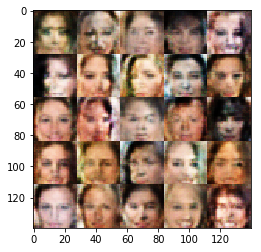

Epoch 1/1... Discriminator Loss: 1.3397... Generator Loss: 0.6770
Epoch 1/1... Discriminator Loss: 1.4994... Generator Loss: 0.5096
Epoch 1/1... Discriminator Loss: 1.2728... Generator Loss: 0.6943
Epoch 1/1... Discriminator Loss: 1.3864... Generator Loss: 0.7044
Epoch 1/1... Discriminator Loss: 1.4740... Generator Loss: 0.6149
Epoch 1/1... Discriminator Loss: 1.3739... Generator Loss: 0.7790
Epoch 1/1... Discriminator Loss: 1.1884... Generator Loss: 0.9541
Epoch 1/1... Discriminator Loss: 1.3804... Generator Loss: 1.1822
Epoch 1/1... Discriminator Loss: 1.2827... Generator Loss: 0.8885
Epoch 1/1... Discriminator Loss: 1.3832... Generator Loss: 0.6787


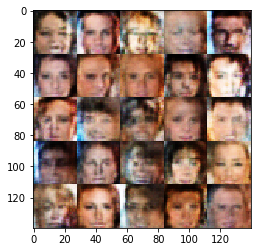

Epoch 1/1... Discriminator Loss: 1.3719... Generator Loss: 0.7579
Epoch 1/1... Discriminator Loss: 1.3488... Generator Loss: 0.8308
Epoch 1/1... Discriminator Loss: 1.4489... Generator Loss: 0.8727
Epoch 1/1... Discriminator Loss: 1.3703... Generator Loss: 0.6520
Epoch 1/1... Discriminator Loss: 1.3564... Generator Loss: 1.2281
Epoch 1/1... Discriminator Loss: 1.3354... Generator Loss: 0.8810
Epoch 1/1... Discriminator Loss: 1.3906... Generator Loss: 0.5559
Epoch 1/1... Discriminator Loss: 1.3506... Generator Loss: 0.6000
Epoch 1/1... Discriminator Loss: 1.3473... Generator Loss: 0.9617
Epoch 1/1... Discriminator Loss: 1.1745... Generator Loss: 1.1293


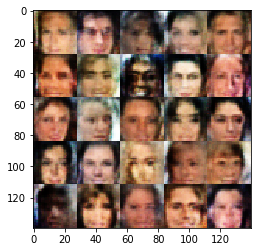

Epoch 1/1... Discriminator Loss: 1.2845... Generator Loss: 0.6725
Epoch 1/1... Discriminator Loss: 1.4269... Generator Loss: 0.5748
Epoch 1/1... Discriminator Loss: 1.5022... Generator Loss: 0.4827
Epoch 1/1... Discriminator Loss: 1.5282... Generator Loss: 0.4555
Epoch 1/1... Discriminator Loss: 1.1165... Generator Loss: 1.0242
Epoch 1/1... Discriminator Loss: 1.3791... Generator Loss: 1.2244
Epoch 1/1... Discriminator Loss: 1.5067... Generator Loss: 0.4835
Epoch 1/1... Discriminator Loss: 1.3633... Generator Loss: 0.5557
Epoch 1/1... Discriminator Loss: 1.5035... Generator Loss: 0.4564
Epoch 1/1... Discriminator Loss: 1.1691... Generator Loss: 0.7453


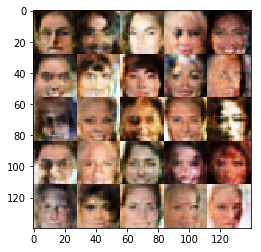

Epoch 1/1... Discriminator Loss: 1.4046... Generator Loss: 0.5765
Epoch 1/1... Discriminator Loss: 1.4741... Generator Loss: 0.5935
Epoch 1/1... Discriminator Loss: 1.4364... Generator Loss: 1.0394
Epoch 1/1... Discriminator Loss: 1.3759... Generator Loss: 0.5936
Epoch 1/1... Discriminator Loss: 1.3778... Generator Loss: 0.6502
Epoch 1/1... Discriminator Loss: 1.3471... Generator Loss: 1.2041
Epoch 1/1... Discriminator Loss: 1.2727... Generator Loss: 0.6662
Epoch 1/1... Discriminator Loss: 1.2246... Generator Loss: 0.7789
Epoch 1/1... Discriminator Loss: 1.2396... Generator Loss: 0.7518
Epoch 1/1... Discriminator Loss: 1.6412... Generator Loss: 1.5304


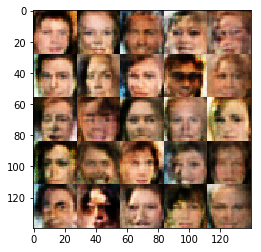

Epoch 1/1... Discriminator Loss: 1.0985... Generator Loss: 0.9306
Epoch 1/1... Discriminator Loss: 1.3520... Generator Loss: 0.8127
Epoch 1/1... Discriminator Loss: 1.2454... Generator Loss: 0.9796
Epoch 1/1... Discriminator Loss: 1.3933... Generator Loss: 0.6639
Epoch 1/1... Discriminator Loss: 1.2357... Generator Loss: 1.0212
Epoch 1/1... Discriminator Loss: 1.1077... Generator Loss: 1.1426
Epoch 1/1... Discriminator Loss: 1.2831... Generator Loss: 0.9516
Epoch 1/1... Discriminator Loss: 1.0658... Generator Loss: 1.2108
Epoch 1/1... Discriminator Loss: 1.0182... Generator Loss: 1.4164
Epoch 1/1... Discriminator Loss: 1.2704... Generator Loss: 0.9068


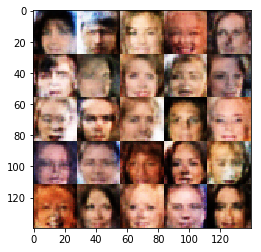

Epoch 1/1... Discriminator Loss: 1.2368... Generator Loss: 0.9959
Epoch 1/1... Discriminator Loss: 1.2978... Generator Loss: 0.5640
Epoch 1/1... Discriminator Loss: 1.0610... Generator Loss: 0.8667
Epoch 1/1... Discriminator Loss: 1.3705... Generator Loss: 0.8046
Epoch 1/1... Discriminator Loss: 1.3518... Generator Loss: 0.6250
Epoch 1/1... Discriminator Loss: 1.2969... Generator Loss: 0.6951
Epoch 1/1... Discriminator Loss: 1.1615... Generator Loss: 0.8406
Epoch 1/1... Discriminator Loss: 1.4170... Generator Loss: 0.6209
Epoch 1/1... Discriminator Loss: 1.2641... Generator Loss: 0.7752
Epoch 1/1... Discriminator Loss: 1.4299... Generator Loss: 0.4909


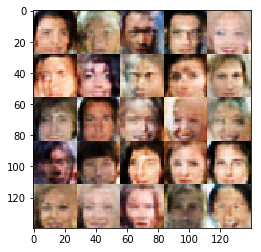

Epoch 1/1... Discriminator Loss: 1.3481... Generator Loss: 0.5144
Epoch 1/1... Discriminator Loss: 1.1881... Generator Loss: 0.9293
Epoch 1/1... Discriminator Loss: 1.2739... Generator Loss: 0.9285
Epoch 1/1... Discriminator Loss: 1.4785... Generator Loss: 0.4779
Epoch 1/1... Discriminator Loss: 1.3091... Generator Loss: 0.8462
Epoch 1/1... Discriminator Loss: 1.2622... Generator Loss: 0.6302
Epoch 1/1... Discriminator Loss: 1.6999... Generator Loss: 0.3310
Epoch 1/1... Discriminator Loss: 1.2278... Generator Loss: 1.1027
Epoch 1/1... Discriminator Loss: 1.1708... Generator Loss: 0.8977
Epoch 1/1... Discriminator Loss: 1.3424... Generator Loss: 0.5232


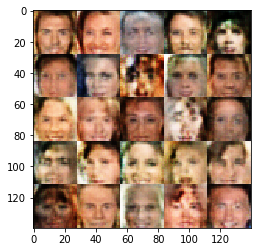

Epoch 1/1... Discriminator Loss: 1.3236... Generator Loss: 0.6068
Epoch 1/1... Discriminator Loss: 1.2672... Generator Loss: 0.9414
Epoch 1/1... Discriminator Loss: 1.0313... Generator Loss: 1.2275
Epoch 1/1... Discriminator Loss: 1.2305... Generator Loss: 1.3354
Epoch 1/1... Discriminator Loss: 1.4411... Generator Loss: 1.1489
Epoch 1/1... Discriminator Loss: 1.2048... Generator Loss: 0.9262
Epoch 1/1... Discriminator Loss: 1.4227... Generator Loss: 1.2004
Epoch 1/1... Discriminator Loss: 1.8723... Generator Loss: 0.2754
Epoch 1/1... Discriminator Loss: 1.3063... Generator Loss: 0.5926
Epoch 1/1... Discriminator Loss: 1.4014... Generator Loss: 0.5153


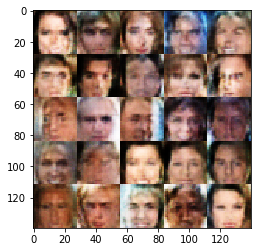

Epoch 1/1... Discriminator Loss: 1.1423... Generator Loss: 0.8405
Epoch 1/1... Discriminator Loss: 1.3888... Generator Loss: 1.1524
Epoch 1/1... Discriminator Loss: 1.3833... Generator Loss: 1.0187
Epoch 1/1... Discriminator Loss: 1.3460... Generator Loss: 0.5692
Epoch 1/1... Discriminator Loss: 1.3810... Generator Loss: 0.5068
Epoch 1/1... Discriminator Loss: 1.2553... Generator Loss: 0.6244
Epoch 1/1... Discriminator Loss: 1.5996... Generator Loss: 0.3902
Epoch 1/1... Discriminator Loss: 1.3158... Generator Loss: 0.6075
Epoch 1/1... Discriminator Loss: 1.3391... Generator Loss: 0.5715
Epoch 1/1... Discriminator Loss: 1.0831... Generator Loss: 0.9848


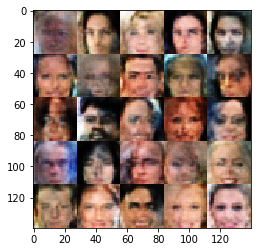

Epoch 1/1... Discriminator Loss: 1.2916... Generator Loss: 1.5374
Epoch 1/1... Discriminator Loss: 1.1100... Generator Loss: 0.7784
Epoch 1/1... Discriminator Loss: 1.4444... Generator Loss: 0.6545
Epoch 1/1... Discriminator Loss: 1.3921... Generator Loss: 0.4762
Epoch 1/1... Discriminator Loss: 1.0421... Generator Loss: 0.9793
Epoch 1/1... Discriminator Loss: 1.2252... Generator Loss: 0.6950
Epoch 1/1... Discriminator Loss: 1.2669... Generator Loss: 0.9245
Epoch 1/1... Discriminator Loss: 1.5239... Generator Loss: 0.4273
Epoch 1/1... Discriminator Loss: 1.1226... Generator Loss: 1.0226
Epoch 1/1... Discriminator Loss: 1.4942... Generator Loss: 0.4755


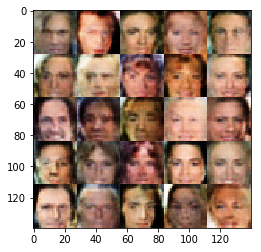

Epoch 1/1... Discriminator Loss: 1.4298... Generator Loss: 0.5078
Epoch 1/1... Discriminator Loss: 1.6576... Generator Loss: 0.3409
Epoch 1/1... Discriminator Loss: 1.1191... Generator Loss: 0.7743
Epoch 1/1... Discriminator Loss: 1.6302... Generator Loss: 0.3626
Epoch 1/1... Discriminator Loss: 1.2149... Generator Loss: 1.1793
Epoch 1/1... Discriminator Loss: 1.9392... Generator Loss: 0.2522
Epoch 1/1... Discriminator Loss: 1.2799... Generator Loss: 0.6578
Epoch 1/1... Discriminator Loss: 1.1991... Generator Loss: 0.7530
Epoch 1/1... Discriminator Loss: 1.1344... Generator Loss: 0.9959
Epoch 1/1... Discriminator Loss: 1.0357... Generator Loss: 0.9898


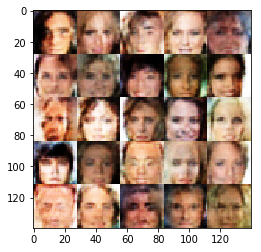

Epoch 1/1... Discriminator Loss: 1.0593... Generator Loss: 1.1349
Epoch 1/1... Discriminator Loss: 1.0402... Generator Loss: 1.5105
Epoch 1/1... Discriminator Loss: 1.1380... Generator Loss: 1.1046
Epoch 1/1... Discriminator Loss: 1.1224... Generator Loss: 0.9566
Epoch 1/1... Discriminator Loss: 1.1915... Generator Loss: 1.0529
Epoch 1/1... Discriminator Loss: 1.5419... Generator Loss: 2.0589
Epoch 1/1... Discriminator Loss: 0.9728... Generator Loss: 1.1473
Epoch 1/1... Discriminator Loss: 1.2162... Generator Loss: 0.6848
Epoch 1/1... Discriminator Loss: 1.0941... Generator Loss: 1.0046
Epoch 1/1... Discriminator Loss: 2.1084... Generator Loss: 0.1983


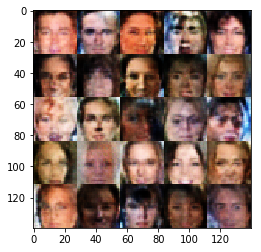

Epoch 1/1... Discriminator Loss: 1.3083... Generator Loss: 0.5617
Epoch 1/1... Discriminator Loss: 1.2630... Generator Loss: 1.4173
Epoch 1/1... Discriminator Loss: 0.9560... Generator Loss: 1.0242
Epoch 1/1... Discriminator Loss: 1.1627... Generator Loss: 0.9175
Epoch 1/1... Discriminator Loss: 1.6238... Generator Loss: 0.3632
Epoch 1/1... Discriminator Loss: 1.2145... Generator Loss: 1.2875
Epoch 1/1... Discriminator Loss: 1.2023... Generator Loss: 0.7163
Epoch 1/1... Discriminator Loss: 1.6020... Generator Loss: 1.3623
Epoch 1/1... Discriminator Loss: 1.2141... Generator Loss: 0.8135
Epoch 1/1... Discriminator Loss: 1.0911... Generator Loss: 0.8759


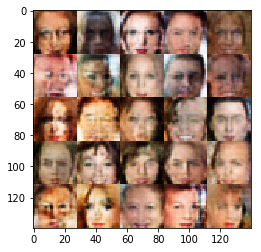

Epoch 1/1... Discriminator Loss: 1.2913... Generator Loss: 0.9245
Epoch 1/1... Discriminator Loss: 1.0993... Generator Loss: 0.9302
Epoch 1/1... Discriminator Loss: 1.2861... Generator Loss: 0.5978
Epoch 1/1... Discriminator Loss: 1.2185... Generator Loss: 0.7927
Epoch 1/1... Discriminator Loss: 1.3680... Generator Loss: 0.5302
Epoch 1/1... Discriminator Loss: 1.1566... Generator Loss: 0.7383
Epoch 1/1... Discriminator Loss: 1.1516... Generator Loss: 0.9047
Epoch 1/1... Discriminator Loss: 0.9752... Generator Loss: 1.1922
Epoch 1/1... Discriminator Loss: 1.2542... Generator Loss: 0.6713
Epoch 1/1... Discriminator Loss: 1.0403... Generator Loss: 0.9223


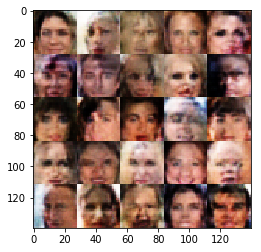

Epoch 1/1... Discriminator Loss: 1.0083... Generator Loss: 0.9548
Epoch 1/1... Discriminator Loss: 1.2374... Generator Loss: 0.6111
Epoch 1/1... Discriminator Loss: 1.2352... Generator Loss: 0.8755
Epoch 1/1... Discriminator Loss: 1.7335... Generator Loss: 0.3439
Epoch 1/1... Discriminator Loss: 1.1219... Generator Loss: 1.1105
Epoch 1/1... Discriminator Loss: 1.3972... Generator Loss: 0.6795
Epoch 1/1... Discriminator Loss: 0.8403... Generator Loss: 1.6605
Epoch 1/1... Discriminator Loss: 1.3373... Generator Loss: 0.5171
Epoch 1/1... Discriminator Loss: 2.1112... Generator Loss: 0.8669
Epoch 1/1... Discriminator Loss: 1.3968... Generator Loss: 0.5442


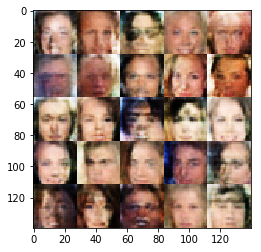

Epoch 1/1... Discriminator Loss: 1.7892... Generator Loss: 0.3117
Epoch 1/1... Discriminator Loss: 1.1859... Generator Loss: 0.7242
Epoch 1/1... Discriminator Loss: 0.8741... Generator Loss: 1.3757
Epoch 1/1... Discriminator Loss: 1.7061... Generator Loss: 0.3553
Epoch 1/1... Discriminator Loss: 1.4583... Generator Loss: 0.8917
Epoch 1/1... Discriminator Loss: 1.4266... Generator Loss: 0.4817
Epoch 1/1... Discriminator Loss: 1.2746... Generator Loss: 0.7255
Epoch 1/1... Discriminator Loss: 1.6946... Generator Loss: 0.3558
Epoch 1/1... Discriminator Loss: 1.0901... Generator Loss: 1.3394
Epoch 1/1... Discriminator Loss: 0.9927... Generator Loss: 0.9176


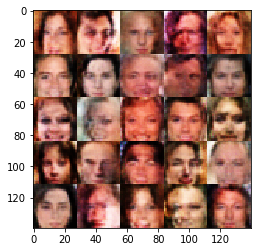

Epoch 1/1... Discriminator Loss: 1.0936... Generator Loss: 0.7606
Epoch 1/1... Discriminator Loss: 1.5804... Generator Loss: 0.6143
Epoch 1/1... Discriminator Loss: 2.3818... Generator Loss: 0.1526
Epoch 1/1... Discriminator Loss: 1.5776... Generator Loss: 0.4219
Epoch 1/1... Discriminator Loss: 1.4572... Generator Loss: 0.4338
Epoch 1/1... Discriminator Loss: 1.4847... Generator Loss: 0.5050
Epoch 1/1... Discriminator Loss: 1.3141... Generator Loss: 0.5971
Epoch 1/1... Discriminator Loss: 1.0155... Generator Loss: 1.1156
Epoch 1/1... Discriminator Loss: 1.3169... Generator Loss: 0.5913
Epoch 1/1... Discriminator Loss: 1.2813... Generator Loss: 2.0963


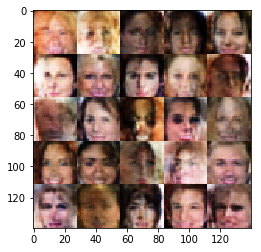

Epoch 1/1... Discriminator Loss: 1.5855... Generator Loss: 0.4061
Epoch 1/1... Discriminator Loss: 1.0540... Generator Loss: 0.9387
Epoch 1/1... Discriminator Loss: 1.8883... Generator Loss: 0.9637
Epoch 1/1... Discriminator Loss: 1.2226... Generator Loss: 0.6172
Epoch 1/1... Discriminator Loss: 1.4908... Generator Loss: 0.4428
Epoch 1/1... Discriminator Loss: 1.1585... Generator Loss: 1.5082
Epoch 1/1... Discriminator Loss: 1.2544... Generator Loss: 1.0286
Epoch 1/1... Discriminator Loss: 1.2189... Generator Loss: 0.7616
Epoch 1/1... Discriminator Loss: 1.2390... Generator Loss: 1.7681
Epoch 1/1... Discriminator Loss: 1.4148... Generator Loss: 0.4442


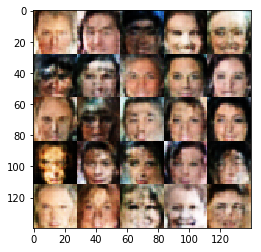

Epoch 1/1... Discriminator Loss: 0.9819... Generator Loss: 1.9264
Epoch 1/1... Discriminator Loss: 1.3050... Generator Loss: 0.5436
Epoch 1/1... Discriminator Loss: 1.7080... Generator Loss: 0.7647
Epoch 1/1... Discriminator Loss: 1.7149... Generator Loss: 0.3251
Epoch 1/1... Discriminator Loss: 1.1172... Generator Loss: 1.3719
Epoch 1/1... Discriminator Loss: 1.3238... Generator Loss: 0.6577
Epoch 1/1... Discriminator Loss: 1.0128... Generator Loss: 0.8963
Epoch 1/1... Discriminator Loss: 1.2257... Generator Loss: 0.9046
Epoch 1/1... Discriminator Loss: 1.2976... Generator Loss: 1.2509
Epoch 1/1... Discriminator Loss: 1.1408... Generator Loss: 0.7538


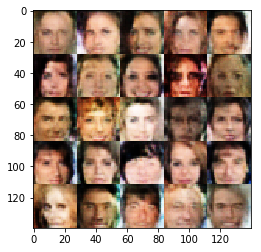

Epoch 1/1... Discriminator Loss: 1.5323... Generator Loss: 1.2610
Epoch 1/1... Discriminator Loss: 1.1550... Generator Loss: 1.0842
Epoch 1/1... Discriminator Loss: 1.2204... Generator Loss: 0.6222
Epoch 1/1... Discriminator Loss: 0.9056... Generator Loss: 0.9859
Epoch 1/1... Discriminator Loss: 0.9044... Generator Loss: 1.4149
Epoch 1/1... Discriminator Loss: 1.2763... Generator Loss: 0.5941
Epoch 1/1... Discriminator Loss: 1.1118... Generator Loss: 0.9409
Epoch 1/1... Discriminator Loss: 1.3195... Generator Loss: 0.7779
Epoch 1/1... Discriminator Loss: 1.2354... Generator Loss: 0.6822
Epoch 1/1... Discriminator Loss: 1.3705... Generator Loss: 0.6037


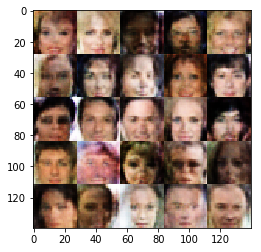

Epoch 1/1... Discriminator Loss: 0.9388... Generator Loss: 1.1410
Epoch 1/1... Discriminator Loss: 1.3348... Generator Loss: 0.6561
Epoch 1/1... Discriminator Loss: 1.3428... Generator Loss: 1.3766
Epoch 1/1... Discriminator Loss: 1.5532... Generator Loss: 0.3835
Epoch 1/1... Discriminator Loss: 1.5013... Generator Loss: 0.4452
Epoch 1/1... Discriminator Loss: 0.9175... Generator Loss: 1.1936
Epoch 1/1... Discriminator Loss: 1.4667... Generator Loss: 0.4820
Epoch 1/1... Discriminator Loss: 0.8002... Generator Loss: 1.6994
Epoch 1/1... Discriminator Loss: 1.6712... Generator Loss: 0.4136
Epoch 1/1... Discriminator Loss: 1.8905... Generator Loss: 0.2756


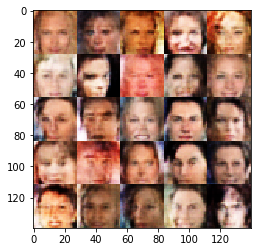

Epoch 1/1... Discriminator Loss: 1.0793... Generator Loss: 0.9895
Epoch 1/1... Discriminator Loss: 1.4486... Generator Loss: 0.4567
Epoch 1/1... Discriminator Loss: 1.3097... Generator Loss: 0.6108
Epoch 1/1... Discriminator Loss: 1.4741... Generator Loss: 0.4430
Epoch 1/1... Discriminator Loss: 1.2411... Generator Loss: 0.6691
Epoch 1/1... Discriminator Loss: 0.9060... Generator Loss: 1.6770
Epoch 1/1... Discriminator Loss: 1.1456... Generator Loss: 0.7188
Epoch 1/1... Discriminator Loss: 1.4886... Generator Loss: 0.7918
Epoch 1/1... Discriminator Loss: 1.1821... Generator Loss: 1.2974
Epoch 1/1... Discriminator Loss: 1.3663... Generator Loss: 0.4927


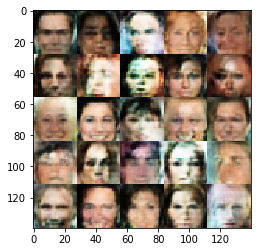

Epoch 1/1... Discriminator Loss: 1.0570... Generator Loss: 1.4340
Epoch 1/1... Discriminator Loss: 1.0618... Generator Loss: 0.9970
Epoch 1/1... Discriminator Loss: 1.2362... Generator Loss: 0.5871
Epoch 1/1... Discriminator Loss: 0.8679... Generator Loss: 1.8086
Epoch 1/1... Discriminator Loss: 0.8223... Generator Loss: 1.2088
Epoch 1/1... Discriminator Loss: 0.9104... Generator Loss: 1.2910
Epoch 1/1... Discriminator Loss: 1.6413... Generator Loss: 0.3440
Epoch 1/1... Discriminator Loss: 1.2774... Generator Loss: 1.8872
Epoch 1/1... Discriminator Loss: 1.7631... Generator Loss: 0.6248
Epoch 1/1... Discriminator Loss: 1.1208... Generator Loss: 0.8281


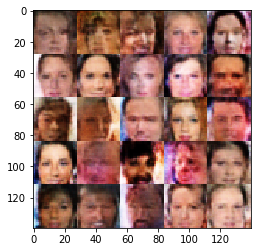

Epoch 1/1... Discriminator Loss: 1.3949... Generator Loss: 0.4715
Epoch 1/1... Discriminator Loss: 0.9155... Generator Loss: 1.2169
Epoch 1/1... Discriminator Loss: 1.2334... Generator Loss: 0.6642
Epoch 1/1... Discriminator Loss: 0.9962... Generator Loss: 1.3709
Epoch 1/1... Discriminator Loss: 1.2717... Generator Loss: 1.4126
Epoch 1/1... Discriminator Loss: 1.2629... Generator Loss: 0.6075
Epoch 1/1... Discriminator Loss: 1.4195... Generator Loss: 0.4649
Epoch 1/1... Discriminator Loss: 0.9512... Generator Loss: 1.0602
Epoch 1/1... Discriminator Loss: 1.7755... Generator Loss: 1.4078
Epoch 1/1... Discriminator Loss: 1.0369... Generator Loss: 1.1170


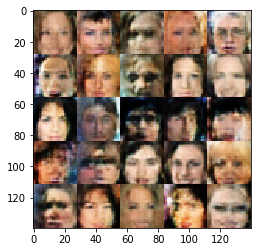

Epoch 1/1... Discriminator Loss: 1.0103... Generator Loss: 1.7495
Epoch 1/1... Discriminator Loss: 1.2026... Generator Loss: 0.9978
Epoch 1/1... Discriminator Loss: 1.1117... Generator Loss: 0.8219
Epoch 1/1... Discriminator Loss: 1.2273... Generator Loss: 0.6668
Epoch 1/1... Discriminator Loss: 1.2099... Generator Loss: 0.6807
Epoch 1/1... Discriminator Loss: 0.9397... Generator Loss: 1.5346
Epoch 1/1... Discriminator Loss: 1.1896... Generator Loss: 0.8107
Epoch 1/1... Discriminator Loss: 1.1617... Generator Loss: 1.5338
Epoch 1/1... Discriminator Loss: 0.9165... Generator Loss: 1.4275
Epoch 1/1... Discriminator Loss: 1.0468... Generator Loss: 1.1595


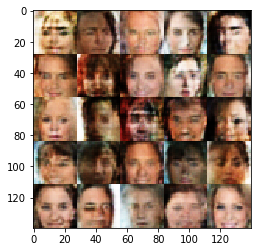

Epoch 1/1... Discriminator Loss: 1.2440... Generator Loss: 0.9818
Epoch 1/1... Discriminator Loss: 1.1244... Generator Loss: 0.8120
Epoch 1/1... Discriminator Loss: 1.1202... Generator Loss: 1.7078
Epoch 1/1... Discriminator Loss: 1.2632... Generator Loss: 0.5926
Epoch 1/1... Discriminator Loss: 1.1594... Generator Loss: 1.2927
Epoch 1/1... Discriminator Loss: 1.1903... Generator Loss: 0.7401
Epoch 1/1... Discriminator Loss: 1.3199... Generator Loss: 0.5738
Epoch 1/1... Discriminator Loss: 0.8921... Generator Loss: 1.4305
Epoch 1/1... Discriminator Loss: 0.7907... Generator Loss: 1.4755
Epoch 1/1... Discriminator Loss: 1.0005... Generator Loss: 1.2313


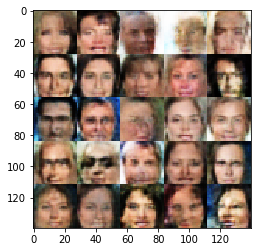

Epoch 1/1... Discriminator Loss: 1.1068... Generator Loss: 0.7160
Epoch 1/1... Discriminator Loss: 1.1437... Generator Loss: 0.6688
Epoch 1/1... Discriminator Loss: 0.8912... Generator Loss: 2.4589
Epoch 1/1... Discriminator Loss: 1.0360... Generator Loss: 0.8212
Epoch 1/1... Discriminator Loss: 0.7597... Generator Loss: 1.4416
Epoch 1/1... Discriminator Loss: 1.0904... Generator Loss: 1.0769
Epoch 1/1... Discriminator Loss: 0.7797... Generator Loss: 1.6945
Epoch 1/1... Discriminator Loss: 0.9178... Generator Loss: 0.9901
Epoch 1/1... Discriminator Loss: 1.2338... Generator Loss: 0.5882
Epoch 1/1... Discriminator Loss: 1.1537... Generator Loss: 1.3526


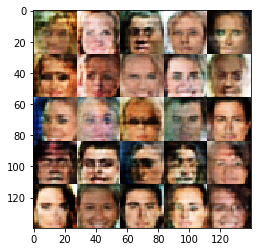

Epoch 1/1... Discriminator Loss: 0.7868... Generator Loss: 2.8207
Epoch 1/1... Discriminator Loss: 1.6486... Generator Loss: 0.3703
Epoch 1/1... Discriminator Loss: 0.8909... Generator Loss: 1.0636
Epoch 1/1... Discriminator Loss: 1.8172... Generator Loss: 0.3188
Epoch 1/1... Discriminator Loss: 1.1530... Generator Loss: 2.6613
Epoch 1/1... Discriminator Loss: 0.7108... Generator Loss: 1.5464
Epoch 1/1... Discriminator Loss: 1.8533... Generator Loss: 0.7808
Epoch 1/1... Discriminator Loss: 0.7364... Generator Loss: 1.8170
Epoch 1/1... Discriminator Loss: 1.3524... Generator Loss: 0.4763
Epoch 1/1... Discriminator Loss: 1.1887... Generator Loss: 0.6700


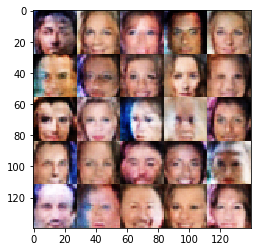

Epoch 1/1... Discriminator Loss: 1.0483... Generator Loss: 0.9137
Epoch 1/1... Discriminator Loss: 0.8514... Generator Loss: 1.5820
Epoch 1/1... Discriminator Loss: 1.6668... Generator Loss: 0.7348
Epoch 1/1... Discriminator Loss: 1.1368... Generator Loss: 1.4296
Epoch 1/1... Discriminator Loss: 0.6476... Generator Loss: 1.5765
Epoch 1/1... Discriminator Loss: 0.9391... Generator Loss: 0.9817
Epoch 1/1... Discriminator Loss: 0.8974... Generator Loss: 1.3931
Epoch 1/1... Discriminator Loss: 1.1407... Generator Loss: 0.6719
Epoch 1/1... Discriminator Loss: 2.3251... Generator Loss: 0.1649
Epoch 1/1... Discriminator Loss: 0.8441... Generator Loss: 1.5920


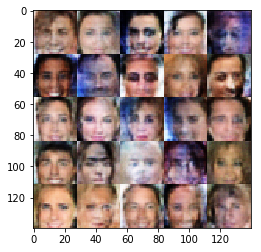

Epoch 1/1... Discriminator Loss: 0.7723... Generator Loss: 1.7241
Epoch 1/1... Discriminator Loss: 0.7911... Generator Loss: 1.6775
Epoch 1/1... Discriminator Loss: 0.8399... Generator Loss: 2.1274
Epoch 1/1... Discriminator Loss: 0.8237... Generator Loss: 1.1246
Epoch 1/1... Discriminator Loss: 0.6887... Generator Loss: 1.9549
Epoch 1/1... Discriminator Loss: 0.7493... Generator Loss: 1.3926
Epoch 1/1... Discriminator Loss: 0.7517... Generator Loss: 1.2332
Epoch 1/1... Discriminator Loss: 1.0594... Generator Loss: 0.7149
Epoch 1/1... Discriminator Loss: 1.6191... Generator Loss: 0.4352
Epoch 1/1... Discriminator Loss: 0.6093... Generator Loss: 1.8163


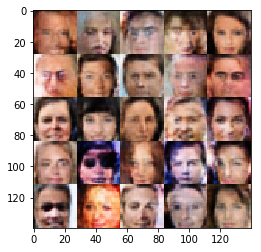

Epoch 1/1... Discriminator Loss: 0.6270... Generator Loss: 1.7035
Epoch 1/1... Discriminator Loss: 1.3804... Generator Loss: 0.5445
Epoch 1/1... Discriminator Loss: 0.6483... Generator Loss: 2.1343
Epoch 1/1... Discriminator Loss: 0.9090... Generator Loss: 2.7595
Epoch 1/1... Discriminator Loss: 1.0719... Generator Loss: 1.1977
Epoch 1/1... Discriminator Loss: 0.7224... Generator Loss: 2.8490
Epoch 1/1... Discriminator Loss: 0.6299... Generator Loss: 1.8842
Epoch 1/1... Discriminator Loss: 0.4404... Generator Loss: 2.8324
Epoch 1/1... Discriminator Loss: 1.6227... Generator Loss: 0.5619
Epoch 1/1... Discriminator Loss: 0.7418... Generator Loss: 1.7533


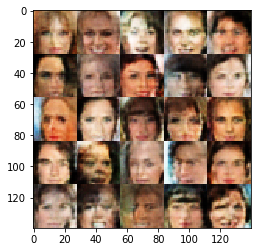

Epoch 1/1... Discriminator Loss: 1.5384... Generator Loss: 0.4449
Epoch 1/1... Discriminator Loss: 1.2696... Generator Loss: 0.6255
Epoch 1/1... Discriminator Loss: 1.2754... Generator Loss: 0.5462
Epoch 1/1... Discriminator Loss: 1.2245... Generator Loss: 0.6175
Epoch 1/1... Discriminator Loss: 1.0640... Generator Loss: 0.7233
Epoch 1/1... Discriminator Loss: 0.8385... Generator Loss: 1.1183
Epoch 1/1... Discriminator Loss: 1.1004... Generator Loss: 0.8649
Epoch 1/1... Discriminator Loss: 0.6288... Generator Loss: 2.0186
Epoch 1/1... Discriminator Loss: 0.6868... Generator Loss: 1.5564
Epoch 1/1... Discriminator Loss: 0.9044... Generator Loss: 2.5239


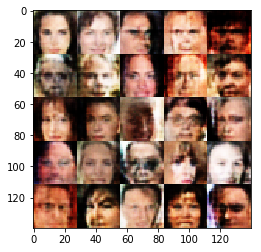

Epoch 1/1... Discriminator Loss: 0.9183... Generator Loss: 2.9478
Epoch 1/1... Discriminator Loss: 0.6187... Generator Loss: 1.8171
Epoch 1/1... Discriminator Loss: 0.5442... Generator Loss: 2.3884
Epoch 1/1... Discriminator Loss: 0.6353... Generator Loss: 1.8349
Epoch 1/1... Discriminator Loss: 0.9811... Generator Loss: 0.8433
Epoch 1/1... Discriminator Loss: 0.5751... Generator Loss: 1.7546
Epoch 1/1... Discriminator Loss: 0.8504... Generator Loss: 1.5627
Epoch 1/1... Discriminator Loss: 0.4918... Generator Loss: 2.4883
Epoch 1/1... Discriminator Loss: 1.4366... Generator Loss: 2.4170
Epoch 1/1... Discriminator Loss: 0.7422... Generator Loss: 1.3224


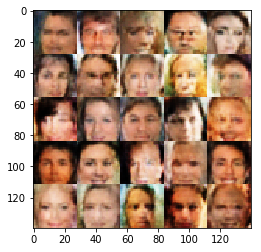

Epoch 1/1... Discriminator Loss: 0.6699... Generator Loss: 2.5749
Epoch 1/1... Discriminator Loss: 0.6019... Generator Loss: 2.1895
Epoch 1/1... Discriminator Loss: 1.1107... Generator Loss: 2.1541
Epoch 1/1... Discriminator Loss: 0.8624... Generator Loss: 1.2758
Epoch 1/1... Discriminator Loss: 0.8789... Generator Loss: 0.9905
Epoch 1/1... Discriminator Loss: 0.4998... Generator Loss: 3.1634
Epoch 1/1... Discriminator Loss: 2.4213... Generator Loss: 1.8536
Epoch 1/1... Discriminator Loss: 0.6134... Generator Loss: 1.8210
Epoch 1/1... Discriminator Loss: 0.5783... Generator Loss: 1.7824
Epoch 1/1... Discriminator Loss: 0.6560... Generator Loss: 3.3250


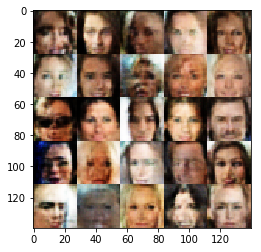

Epoch 1/1... Discriminator Loss: 0.6588... Generator Loss: 1.9390
Epoch 1/1... Discriminator Loss: 1.0757... Generator Loss: 0.6953
Epoch 1/1... Discriminator Loss: 0.5556... Generator Loss: 1.9487
Epoch 1/1... Discriminator Loss: 1.0274... Generator Loss: 0.7661
Epoch 1/1... Discriminator Loss: 0.6442... Generator Loss: 1.9497
Epoch 1/1... Discriminator Loss: 0.4851... Generator Loss: 2.6785
Epoch 1/1... Discriminator Loss: 0.9343... Generator Loss: 3.0141
Epoch 1/1... Discriminator Loss: 0.8607... Generator Loss: 1.6651
Epoch 1/1... Discriminator Loss: 0.5146... Generator Loss: 2.2048
Epoch 1/1... Discriminator Loss: 0.8442... Generator Loss: 1.1431


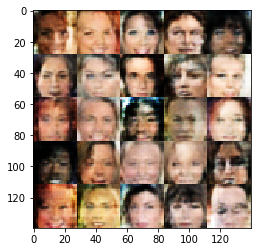

Epoch 1/1... Discriminator Loss: 0.6691... Generator Loss: 1.7272
Epoch 1/1... Discriminator Loss: 0.7563... Generator Loss: 1.1460
Epoch 1/1... Discriminator Loss: 0.7264... Generator Loss: 1.7805
Epoch 1/1... Discriminator Loss: 0.5893... Generator Loss: 1.7000
Epoch 1/1... Discriminator Loss: 1.2183... Generator Loss: 0.5891
Epoch 1/1... Discriminator Loss: 1.6336... Generator Loss: 0.3892
Epoch 1/1... Discriminator Loss: 0.6505... Generator Loss: 1.4975
Epoch 1/1... Discriminator Loss: 0.4443... Generator Loss: 2.6450
Epoch 1/1... Discriminator Loss: 0.4541... Generator Loss: 2.7061
Epoch 1/1... Discriminator Loss: 0.7822... Generator Loss: 1.0982


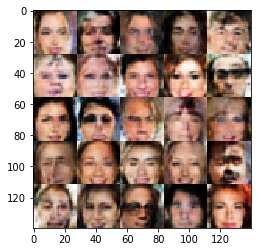

Epoch 1/1... Discriminator Loss: 0.6402... Generator Loss: 1.5165
Epoch 1/1... Discriminator Loss: 0.9266... Generator Loss: 0.8635
Epoch 1/1... Discriminator Loss: 0.5657... Generator Loss: 1.6907
Epoch 1/1... Discriminator Loss: 0.6235... Generator Loss: 4.6398
Epoch 1/1... Discriminator Loss: 0.4198... Generator Loss: 3.6010
Epoch 1/1... Discriminator Loss: 0.5309... Generator Loss: 2.1940
Epoch 1/1... Discriminator Loss: 0.4541... Generator Loss: 2.6868
Epoch 1/1... Discriminator Loss: 1.7169... Generator Loss: 0.3316
Epoch 1/1... Discriminator Loss: 1.6130... Generator Loss: 0.4190
Epoch 1/1... Discriminator Loss: 0.5580... Generator Loss: 1.8777


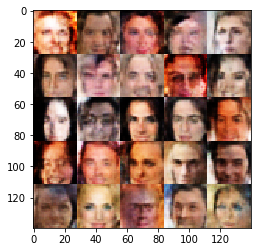

Epoch 1/1... Discriminator Loss: 0.4983... Generator Loss: 2.2972
Epoch 1/1... Discriminator Loss: 1.0136... Generator Loss: 0.8025
Epoch 1/1... Discriminator Loss: 0.4896... Generator Loss: 3.3598
Epoch 1/1... Discriminator Loss: 0.8391... Generator Loss: 1.0308
Epoch 1/1... Discriminator Loss: 0.5558... Generator Loss: 2.4119
Epoch 1/1... Discriminator Loss: 0.6805... Generator Loss: 1.2944
Epoch 1/1... Discriminator Loss: 0.7400... Generator Loss: 1.2368
Epoch 1/1... Discriminator Loss: 0.4449... Generator Loss: 2.5957
Epoch 1/1... Discriminator Loss: 0.6235... Generator Loss: 3.1364
Epoch 1/1... Discriminator Loss: 0.7478... Generator Loss: 3.6385


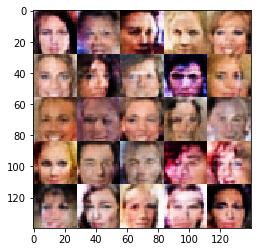

Epoch 1/1... Discriminator Loss: 0.6054... Generator Loss: 3.0408
Epoch 1/1... Discriminator Loss: 0.4196... Generator Loss: 3.2713
Epoch 1/1... Discriminator Loss: 0.7772... Generator Loss: 3.1237
Epoch 1/1... Discriminator Loss: 0.5895... Generator Loss: 4.0218
Epoch 1/1... Discriminator Loss: 0.8130... Generator Loss: 1.1243
Epoch 1/1... Discriminator Loss: 0.4625... Generator Loss: 2.3926
Epoch 1/1... Discriminator Loss: 0.5877... Generator Loss: 2.8482
Epoch 1/1... Discriminator Loss: 0.7182... Generator Loss: 1.9524
Epoch 1/1... Discriminator Loss: 0.6925... Generator Loss: 1.3349
Epoch 1/1... Discriminator Loss: 0.4996... Generator Loss: 4.7672


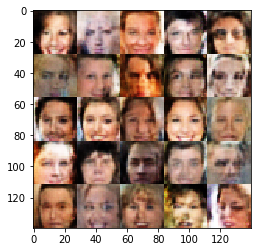

Epoch 1/1... Discriminator Loss: 0.6075... Generator Loss: 1.6892
Epoch 1/1... Discriminator Loss: 1.5963... Generator Loss: 0.3636
Epoch 1/1... Discriminator Loss: 0.5451... Generator Loss: 1.9493
Epoch 1/1... Discriminator Loss: 0.8342... Generator Loss: 3.1906
Epoch 1/1... Discriminator Loss: 0.4424... Generator Loss: 3.5993
Epoch 1/1... Discriminator Loss: 1.9820... Generator Loss: 3.7309
Epoch 1/1... Discriminator Loss: 0.4990... Generator Loss: 3.1182
Epoch 1/1... Discriminator Loss: 0.4596... Generator Loss: 2.4759
Epoch 1/1... Discriminator Loss: 0.4682... Generator Loss: 2.4903
Epoch 1/1... Discriminator Loss: 0.5270... Generator Loss: 2.0983


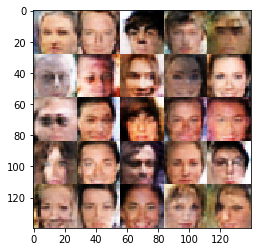

Epoch 1/1... Discriminator Loss: 0.4583... Generator Loss: 2.3760
Epoch 1/1... Discriminator Loss: 1.2725... Generator Loss: 0.6253
Epoch 1/1... Discriminator Loss: 0.8897... Generator Loss: 0.9711
Epoch 1/1... Discriminator Loss: 0.4571... Generator Loss: 3.6297
Epoch 1/1... Discriminator Loss: 0.4545... Generator Loss: 2.3565
Epoch 1/1... Discriminator Loss: 0.7331... Generator Loss: 3.4686
Epoch 1/1... Discriminator Loss: 0.5568... Generator Loss: 1.7733
Epoch 1/1... Discriminator Loss: 0.5627... Generator Loss: 1.6970
Epoch 1/1... Discriminator Loss: 0.4501... Generator Loss: 2.3851
Epoch 1/1... Discriminator Loss: 0.4848... Generator Loss: 2.2529


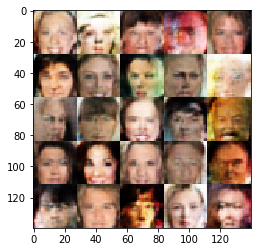

Epoch 1/1... Discriminator Loss: 0.4556... Generator Loss: 3.8990
Epoch 1/1... Discriminator Loss: 0.8484... Generator Loss: 1.1995
Epoch 1/1... Discriminator Loss: 0.5504... Generator Loss: 1.7747
Epoch 1/1... Discriminator Loss: 0.9061... Generator Loss: 0.9535
Epoch 1/1... Discriminator Loss: 0.5294... Generator Loss: 3.0378
Epoch 1/1... Discriminator Loss: 1.9492... Generator Loss: 0.2840
Epoch 1/1... Discriminator Loss: 1.1040... Generator Loss: 0.6904
Epoch 1/1... Discriminator Loss: 0.4439... Generator Loss: 2.6829
Epoch 1/1... Discriminator Loss: 0.9015... Generator Loss: 0.9375
Epoch 1/1... Discriminator Loss: 0.4026... Generator Loss: 3.2743


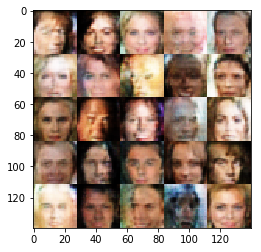

Epoch 1/1... Discriminator Loss: 0.4435... Generator Loss: 2.4542
Epoch 1/1... Discriminator Loss: 0.5594... Generator Loss: 1.9936
Epoch 1/1... Discriminator Loss: 0.6890... Generator Loss: 1.3632
Epoch 1/1... Discriminator Loss: 0.5463... Generator Loss: 3.7648
Epoch 1/1... Discriminator Loss: 0.7241... Generator Loss: 5.0228
Epoch 1/1... Discriminator Loss: 0.6232... Generator Loss: 1.9991
Epoch 1/1... Discriminator Loss: 0.5807... Generator Loss: 1.6558
Epoch 1/1... Discriminator Loss: 0.5507... Generator Loss: 3.7838
Epoch 1/1... Discriminator Loss: 0.6019... Generator Loss: 2.2670
Epoch 1/1... Discriminator Loss: 0.6387... Generator Loss: 1.4798


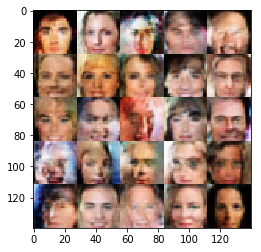

Epoch 1/1... Discriminator Loss: 0.4839... Generator Loss: 2.6279
Epoch 1/1... Discriminator Loss: 0.4699... Generator Loss: 2.6387
Epoch 1/1... Discriminator Loss: 0.6101... Generator Loss: 1.8786
Epoch 1/1... Discriminator Loss: 0.5014... Generator Loss: 2.2409
Epoch 1/1... Discriminator Loss: 0.3869... Generator Loss: 3.3167
Epoch 1/1... Discriminator Loss: 0.5375... Generator Loss: 4.1407
Epoch 1/1... Discriminator Loss: 0.4486... Generator Loss: 2.9519
Epoch 1/1... Discriminator Loss: 0.4720... Generator Loss: 2.1875
Epoch 1/1... Discriminator Loss: 0.8573... Generator Loss: 0.9839
Epoch 1/1... Discriminator Loss: 0.4256... Generator Loss: 4.1535


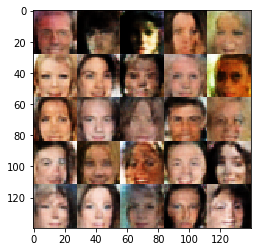

Epoch 1/1... Discriminator Loss: 1.1391... Generator Loss: 0.7160
Epoch 1/1... Discriminator Loss: 0.5836... Generator Loss: 2.8746
Epoch 1/1... Discriminator Loss: 0.7275... Generator Loss: 1.4632
Epoch 1/1... Discriminator Loss: 0.6375... Generator Loss: 3.4921
Epoch 1/1... Discriminator Loss: 0.5234... Generator Loss: 1.9329
Epoch 1/1... Discriminator Loss: 1.1279... Generator Loss: 0.6715
Epoch 1/1... Discriminator Loss: 0.8524... Generator Loss: 1.0971
Epoch 1/1... Discriminator Loss: 0.9038... Generator Loss: 0.8993
Epoch 1/1... Discriminator Loss: 0.4622... Generator Loss: 2.2147
Epoch 1/1... Discriminator Loss: 0.4316... Generator Loss: 3.9244


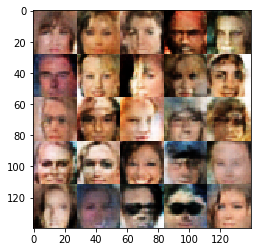

Epoch 1/1... Discriminator Loss: 0.3846... Generator Loss: 3.9314
Epoch 1/1... Discriminator Loss: 0.4683... Generator Loss: 2.8314
Epoch 1/1... Discriminator Loss: 0.5660... Generator Loss: 4.5136
Epoch 1/1... Discriminator Loss: 0.5071... Generator Loss: 2.2119
Epoch 1/1... Discriminator Loss: 0.4463... Generator Loss: 2.6337
Epoch 1/1... Discriminator Loss: 0.4033... Generator Loss: 3.0896
Epoch 1/1... Discriminator Loss: 0.3880... Generator Loss: 3.3909
Epoch 1/1... Discriminator Loss: 0.4382... Generator Loss: 2.8543
Epoch 1/1... Discriminator Loss: 0.7276... Generator Loss: 1.2995
Epoch 1/1... Discriminator Loss: 0.7701... Generator Loss: 1.2460


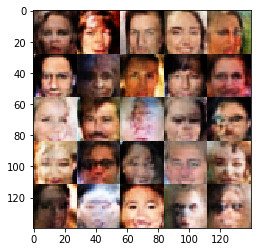

Epoch 1/1... Discriminator Loss: 0.5667... Generator Loss: 1.7760
Epoch 1/1... Discriminator Loss: 0.4403... Generator Loss: 2.7160
Epoch 1/1... Discriminator Loss: 0.4161... Generator Loss: 2.7178
Epoch 1/1... Discriminator Loss: 0.5042... Generator Loss: 2.1702
Epoch 1/1... Discriminator Loss: 0.7257... Generator Loss: 1.3464
Epoch 1/1... Discriminator Loss: 1.0075... Generator Loss: 0.7971
Epoch 1/1... Discriminator Loss: 0.4699... Generator Loss: 2.6719
Epoch 1/1... Discriminator Loss: 0.4258... Generator Loss: 2.8872
Epoch 1/1... Discriminator Loss: 0.4586... Generator Loss: 2.4343
Epoch 1/1... Discriminator Loss: 0.7852... Generator Loss: 1.1378


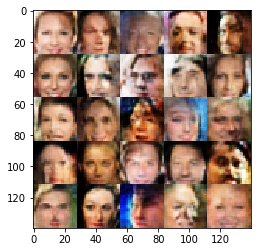

Epoch 1/1... Discriminator Loss: 0.4520... Generator Loss: 2.5166
Epoch 1/1... Discriminator Loss: 0.5053... Generator Loss: 2.0659
Epoch 1/1... Discriminator Loss: 0.4904... Generator Loss: 2.1702
Epoch 1/1... Discriminator Loss: 0.4156... Generator Loss: 4.4827
Epoch 1/1... Discriminator Loss: 0.4424... Generator Loss: 4.6269
Epoch 1/1... Discriminator Loss: 0.4356... Generator Loss: 2.6205
Epoch 1/1... Discriminator Loss: 0.3888... Generator Loss: 3.1490
Epoch 1/1... Discriminator Loss: 0.4572... Generator Loss: 3.3616
Epoch 1/1... Discriminator Loss: 0.3987... Generator Loss: 2.9172
Epoch 1/1... Discriminator Loss: 0.6679... Generator Loss: 1.5408


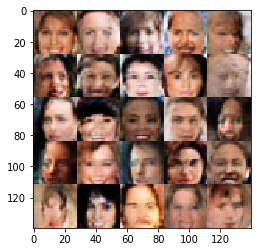

Epoch 1/1... Discriminator Loss: 0.4153... Generator Loss: 2.7069
Epoch 1/1... Discriminator Loss: 0.4160... Generator Loss: 3.2139
Epoch 1/1... Discriminator Loss: 0.6280... Generator Loss: 1.4942
Epoch 1/1... Discriminator Loss: 0.4039... Generator Loss: 5.3673
Epoch 1/1... Discriminator Loss: 0.7093... Generator Loss: 4.4384
Epoch 1/1... Discriminator Loss: 1.1544... Generator Loss: 4.1287
Epoch 1/1... Discriminator Loss: 0.4626... Generator Loss: 2.2192
Epoch 1/1... Discriminator Loss: 0.4793... Generator Loss: 3.8850
Epoch 1/1... Discriminator Loss: 0.3499... Generator Loss: 4.4850
Epoch 1/1... Discriminator Loss: 1.0868... Generator Loss: 6.2539


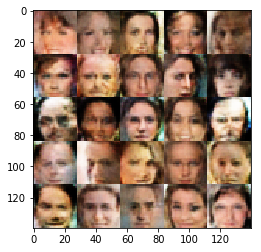

Epoch 1/1... Discriminator Loss: 0.3975... Generator Loss: 3.0566
Epoch 1/1... Discriminator Loss: 0.4450... Generator Loss: 4.0852
Epoch 1/1... Discriminator Loss: 0.3550... Generator Loss: 4.9700
Epoch 1/1... Discriminator Loss: 0.3942... Generator Loss: 3.4981
Epoch 1/1... Discriminator Loss: 0.5436... Generator Loss: 4.7878
Epoch 1/1... Discriminator Loss: 0.7336... Generator Loss: 3.3297
Epoch 1/1... Discriminator Loss: 0.4812... Generator Loss: 4.0412
Epoch 1/1... Discriminator Loss: 0.4038... Generator Loss: 3.7586
Epoch 1/1... Discriminator Loss: 0.4791... Generator Loss: 2.1933
Epoch 1/1... Discriminator Loss: 0.4160... Generator Loss: 2.8978


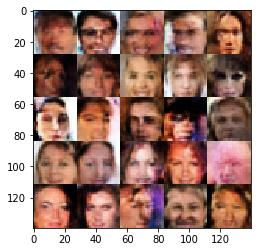

Epoch 1/1... Discriminator Loss: 0.3799... Generator Loss: 3.3856
Epoch 1/1... Discriminator Loss: 0.7774... Generator Loss: 2.8979
Epoch 1/1... Discriminator Loss: 0.4393... Generator Loss: 2.9877
Epoch 1/1... Discriminator Loss: 0.6145... Generator Loss: 5.2178
Epoch 1/1... Discriminator Loss: 0.9613... Generator Loss: 1.9687
Epoch 1/1... Discriminator Loss: 0.4705... Generator Loss: 2.9572
Epoch 1/1... Discriminator Loss: 0.5059... Generator Loss: 2.0396
Epoch 1/1... Discriminator Loss: 1.1181... Generator Loss: 0.7168
Epoch 1/1... Discriminator Loss: 0.4320... Generator Loss: 3.7908
Epoch 1/1... Discriminator Loss: 1.1619... Generator Loss: 3.5408


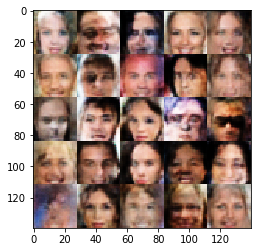

Epoch 1/1... Discriminator Loss: 0.8802... Generator Loss: 1.1110
Epoch 1/1... Discriminator Loss: 1.1341... Generator Loss: 4.1162
Epoch 1/1... Discriminator Loss: 0.6386... Generator Loss: 4.2824
Epoch 1/1... Discriminator Loss: 0.5800... Generator Loss: 1.7754
Epoch 1/1... Discriminator Loss: 0.4700... Generator Loss: 2.4875
Epoch 1/1... Discriminator Loss: 0.4511... Generator Loss: 2.4093
Epoch 1/1... Discriminator Loss: 0.5129... Generator Loss: 4.2286
Epoch 1/1... Discriminator Loss: 0.4954... Generator Loss: 2.1028
Epoch 1/1... Discriminator Loss: 0.3972... Generator Loss: 3.4940
Epoch 1/1... Discriminator Loss: 0.4172... Generator Loss: 3.2692


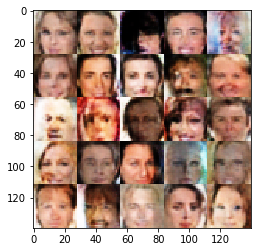

Epoch 1/1... Discriminator Loss: 1.5477... Generator Loss: 0.4438
Epoch 1/1... Discriminator Loss: 0.3964... Generator Loss: 3.2545
Epoch 1/1... Discriminator Loss: 0.4021... Generator Loss: 3.5081


In [15]:
batch_size = 28
z_dim = 100
learning_rate = 0.0001
beta1 = 0.2

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

In [14]:
print("End")

End


### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.